# Crimes in India

## Description
- Capstone project on the topic of **Crimes in India** covering following phases:


- **Phase 1: Data Collection/preparation part**

    1.1     To collect data about the population of each state.
    
    1.2     To collect data about literacy rate in each state.
    
    1.3     To collect data about area of each state.
    

- **Phase 2: State/UT wise analysis**

    2.1.    To analyse Literacy Rate vs Total Crimes.

    2.2.    To analyse the type of crime vs each state vs Literacy rate.

    2.3.    To analyse year-on-year total crime rate.

    2.4.    To analyse area vs overall crime.

    2.5.    To analyse Population vs overall Crime.

    2.6.    To write each state crime report.
    
    
- **Phase 3: SQL Operations**

    3.1	 To insert records from 42_District_wise_crimes_committed_against_women_2001_2012.csv into a table.

    3.2	To write SQL query to find the highest number of rapes & Kidnappings that happened in which state, District, and year.

    3.3	To write SQL query to find All the lowest number of rapes & Kidnappings that happened in which state, District, and year.
       
    3.4	To insert records from 02_District_wise_crimes_committed_against_ST_2001_2012.csv into a new table

    3.5	To write SQL query to find the highest number of dacoity/robbery in which district.

    3.6	To write SQL query to find in which districts(All) the lowest number of murders happened.

    3.7	To write SQL query to find the number of murders in ascending order in district and year wise.

    3.8.1 To insert records of STATE/UT, DISTRICT, YEAR, MURDER, ATTEMPT TO MURDER, and RAPE columns only from    
          01_District_wise_crimes_committed_IPC_2001_2012.csv into a new table.
          
    3.8.2 To write SQL query to find which District in each state/UT has the highest number of murders year wise. Your 
          output should show STATE/UT, YEAR, DISTRICT, and MURDERS.

    3.8.3 To store the above data (the result of 3.8.2) in DataFrame and analyze districts that appear 3 or more than           3 years and print the corresponding state/UT, district, murders, and year in descending order.

    3.8.4 To use appropriate graphs to show your data (the result of 3.8.3).
    

- **Phase 4: Clustering and report writing**
       
     4.1  To create 3 clusters as below:
        1. Sensitive Area's
        2. Moderate Area's
        3. Peaceful Area's"

    4.2  To create DataFrame for each cluster that shows data according to the areas.

    4.3  To analyze clusters and prepare a report that explains all the observations.

    4.4   Capstone project overall story in your own words. Min 1000 words.



### Github link:

https://github.com/ravikesh2426/ML-File/blob/9236b5858591e296fecc0d302922082b76b540f1/India_Crime%20-Zip.zip


### Phase 1: Data Collection/preparation part

In [363]:
# Importing the packages
import os
import numpy
import matplotlib.pyplot as plt
import pandas as pd

### 1.1 The population of each state.

   Source url: https://en.wikipedia.org/wiki/List_of_states_in_India_by_past_population

In [364]:
# Opening the saved population data file
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/')
df_state_pop=pd.read_csv('state_wise_population.csv')
df_state_pop

,STATE/UT,Population [Census 2001],Population [Census 2011]
0,UTTAR PRADESH,166053600,199581477
1,MAHARASHTRA,96752500,112372972
2,BIHAR,82879910,103804630
3,WEST BENGAL,80221300,91347736
4,MADHYA PRADESH,60385090,72597565
5,TAMIL NADU,62111390,72138958
6,RAJASTHAN,56473300,68621012
7,KARNATAKA,52734986,61130704
8,GUJARAT,50597200,60383628
9,ANDHRA PRADESH,75728400,49386799


In [365]:
# Estimating annualized growth rate of population of each state between 2001 and 2011

r = []
n = 10  # Number of years from 2001 to 2011, as the census takes place once in a decade.

for index, row in df_state_pop.iterrows():
    try:
        gr = round(((row['Population [Census 2011]'] / row['Population [Census 2001]']) ** (1/n) - 1) * 100, 4)
        r.append(gr)
    except ZeroDivisionError:
        r.append(0)

df_state_pop['Annualized population growth rate (%)']=pd.DataFrame(r, columns=['Annualized population growth rate (%)'])
df_state_pop

,STATE/UT,Population [Census 2001],Population [Census 2011],Annualized population growth rate (%)
0,UTTAR PRADESH,166053600,199581477,1.8561
1,MAHARASHTRA,96752500,112372972,1.5079
2,BIHAR,82879910,103804630,2.2767
3,WEST BENGAL,80221300,91347736,1.3073
4,MADHYA PRADESH,60385090,72597565,1.8590
5,TAMIL NADU,62111390,72138958,1.5079
6,RAJASTHAN,56473300,68621012,1.9674
7,KARNATAKA,52734986,61130704,1.4883
8,GUJARAT,50597200,60383628,1.7839
9,ANDHRA PRADESH,75728400,49386799,-4.1846


In [366]:
# Estimating population of each state through 2002 to 2012 using the annualized growth rate

j = 2001
for n in range(1, 12):         # Loop through each of the years from 2001 to 2011
    j += 1
    p = []
    for index, row in df_state_pop.iterrows():
        # Calculate estimated population for each state for the current year
        pop = int(row['Population [Census 2001]'] * ((1 + row['Annualized population growth rate (%)'] / 100) ** n))
        p.append(pop)
    df_state_pop[f'Estimated Population_{j}'] = p   # Add estimated population values as a new column for the current year

df_state_pop.drop(columns=['Estimated Population_2011'],inplace=True)  # Dropping the column 'Estimated Population_2011'

df_state_pop

,STATE/UT,Population [Census 2001],Population [Census 2011],Annualized population growth rate (%),Estimated Population_2002,Estimated Population_2003,Estimated Population_2004,Estimated Population_2005,Estimated Population_2006,Estimated Population_2007,Estimated Population_2008,Estimated Population_2009,Estimated Population_2010,Estimated Population_2012
0,UTTAR PRADESH,166053600,199581477,1.8561,169135720,172275048,175472646,178729593,182046993,185425968,188867659,192373232,195943871,203285204
1,MAHARASHTRA,96752500,112372972,1.5079,98211430,99692361,101195622,102721551,104270489,105842783,107438787,109058856,110703355,114067118
2,BIHAR,82879910,103804630,2.2767,84766836,86696723,88670547,90689310,92754033,94865764,97025573,99234554,101493827,106167855
3,WEST BENGAL,80221300,91347736,1.3073,81270033,82332476,83408808,84499212,85603870,86722969,87856698,89005249,90168815,92541779
4,MADHYA PRADESH,60385090,72597565,1.8590,61507648,62651076,63815759,65002094,66210483,67441336,68695070,69972112,71272893,73947450
5,TAMIL NADU,62111390,72138958,1.5079,63047967,63998667,64963703,65943291,66937650,67947003,68971576,70011598,71067303,73226710
6,RAJASTHAN,56473300,68621012,1.9674,57584355,58717270,59872473,61050404,62251510,63476246,64725078,65998479,67296933,69970981
7,KARNATAKA,52734986,61130704,1.4883,53519840,54316376,55124767,55945189,56777821,57622845,58480446,59350810,60234129,62040400
8,GUJARAT,50597200,60383628,1.7839,51499803,52418508,53353602,54305377,55274130,56260165,57263791,58285319,59325071,61460550
9,ANDHRA PRADESH,75728400,49386799,-4.1846,72559469,69523145,66613880,63826355,61155478,58596366,56144342,53794926,51543823,47320275


### 1.2. Literacy Rate in each state

Source url: https://en.wikipedia.org/wiki/List_of_Indian_states_and_union_territories_by_literacy_rate

In [367]:
# Opening the saved literacy data file
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/')
df_state_lit=pd.read_csv('state_wise_literacy.csv')
df_state_lit

,STATE/UT,Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,ANDAMAN AND NICOBAR ISLANDS,81.30,86.63
1,ANDHRA PRADESH,60.47,67.02
2,ARUNACHAL PRADESH,54.34,65.38
3,ASSAM,63.25,72.19
4,BIHAR,47.00,61.80
5,CHANDIGARH,81.94,86.05
6,CHHATTISGARH,64.66,70.28
7,DADRA AND NAGAR HAVELI,57.63,76.24
8,DAMAN AND DIU,78.18,87.10
9,DELHI,81.67,86.21


### 1.3. Area of each state

Source url: https://en.wikipedia.org/wiki/List_of_states_and_union_territories_of_India_by_area

In [368]:
# Opening the saved literacy data file
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/')
df_state_area=pd.read_csv('state_wise_area.csv')
df_state_area

,STATE/UT,Area [ km² ]
0,Rajasthan,342239
1,Madhya Pradesh,308252
2,Maharashtra,307713
3,Uttar Pradesh,240928
4,Gujarat,196024
5,Karnataka,191791
6,Andhra Pradesh,162975
7,Odisha,155707
8,Chhattisgarh,135192
9,Tamil Nadu,130058


In [369]:
import pandas as pd

# Assuming df1 and df2 are your DataFrames with different indices
df_state_pop
df_state_lit
# Reset the index of both DataFrames
df1_reset = df_state_pop.reset_index()
df2_reset = df_state_lit.reset_index()

# Merge the DataFrames on a common column
merged_df = pd.merge(df1_reset, df2_reset, on='STATE/UT')

# Set the common column as the index
# merged_df.set_index('STATE/UT', inplace=False)
merged_df.drop(columns=['index_x','index_y'],inplace=True)
# merged_df['STATE/UT'] = merged_df['STATE/UT'].str.upper()

merged_df

,STATE/UT,Population [Census 2001],Population [Census 2011],Annualized population growth rate (%),Estimated Population_2002,Estimated Population_2003,Estimated Population_2004,Estimated Population_2005,Estimated Population_2006,Estimated Population_2007,Estimated Population_2008,Estimated Population_2009,Estimated Population_2010,Estimated Population_2012,Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,UTTAR PRADESH,166053600,199581477,1.8561,169135720,172275048,175472646,178729593,182046993,185425968,188867659,192373232,195943871,203285204,56.27,67.68
1,MAHARASHTRA,96752500,112372972,1.5079,98211430,99692361,101195622,102721551,104270489,105842783,107438787,109058856,110703355,114067118,76.84,82.34
2,BIHAR,82879910,103804630,2.2767,84766836,86696723,88670547,90689310,92754033,94865764,97025573,99234554,101493827,106167855,47.00,61.80
3,WEST BENGAL,80221300,91347736,1.3073,81270033,82332476,83408808,84499212,85603870,86722969,87856698,89005249,90168815,92541779,68.64,76.26
4,MADHYA PRADESH,60385090,72597565,1.8590,61507648,62651076,63815759,65002094,66210483,67441336,68695070,69972112,71272893,73947450,63.74,69.32
5,TAMIL NADU,62111390,72138958,1.5079,63047967,63998667,64963703,65943291,66937650,67947003,68971576,70011598,71067303,73226710,73.45,80.33
6,RAJASTHAN,56473300,68621012,1.9674,57584355,58717270,59872473,61050404,62251510,63476246,64725078,65998479,67296933,69970981,60.41,66.11
7,KARNATAKA,52734986,61130704,1.4883,53519840,54316376,55124767,55945189,56777821,57622845,58480446,59350810,60234129,62040400,66.06,75.36
8,GUJARAT,50597200,60383628,1.7839,51499803,52418508,53353602,54305377,55274130,56260165,57263791,58285319,59325071,61460550,69.14,78.03
9,ANDHRA PRADESH,75728400,49386799,-4.1846,72559469,69523145,66613880,63826355,61155478,58596366,56144342,53794926,51543823,47320275,60.47,67.02


In [370]:
len(merged_df['Population [Census 2011]'].unique())

35

### Phase 2: State/UT wise analysis.

    2.1.	To analyse Literacy Rate vs Total Crimes.
    
    2.2.    To analyse the type of crime vs each state vs Literacy rate.
    
    2.3.	To analyse year-on-year total crime rate.
    
    2.4.	To analyse area vs overall crime.
    
    2.5.	To analyse Population vs overall Crime.
    
    2.6.	To write each state crime report.

### Read and understand dataset

In [371]:
# Import dependencies
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [372]:
file_list = os.listdir("F:\FlipRobo\Capstone Project_Data Trained\India_Crime - Copy")
folder_path="F:\FlipRobo\Capstone Project_Data Trained\India_Crime - Copy"
# Initialize an empty list to store DataFrames
dfs = []

# Loop through each file and read it into a DataFrame
for file in file_list:
    if file.endswith('.csv'):  # Check if the file is a CSV file
        file_path = os.path.join(folder_path, file)
        df = pd.read_csv(file_path)
        df.columns = df.columns.str.upper()  # convert all the column names to upper case
        dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dfs, ignore_index=True)
combined_df.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,OTHER PLACES - BURGLARY,OTHER PLACES - THEFT,TOTAL - DACOITY,TOTAL - ROBBERY,TOTAL - BURGLARY,TOTAL - THEFT,CASES_REGISTERED_UNDER_HUMAN_RIGHTS_VIOLATIONS,POLICEMEN_CHARGESHEETED,POLICEMEN_CONVICTED,IMPORTATION OF GIRLS
0,ANDHRA PRADESH,ADILABAD,2001,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ANDHRA PRADESH,ANANTAPUR,2001,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ANDHRA PRADESH,CHITTOOR,2001,101.0,57.0,2.0,27.0,0.0,27.0,59.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ANDHRA PRADESH,CUDDAPAH,2001,80.0,53.0,1.0,20.0,0.0,20.0,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ANDHRA PRADESH,EAST GODAVARI,2001,82.0,67.0,1.0,23.0,0.0,23.0,49.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2.1. Analysis of Literacy Rate vs Total Crimes.

- A better metric to compare the effect of literacy on crime would be to compare literacy rate and crime rate, instead of comparing literacy rate with total crimes. 

- Crime rate is the total crime commited per 100000 of population. This way it takes into account the effect of more crimes in larger population. 

- This way the effect of pouplation on the crime gets nullified and only the effect of literacy is reflected.

In [373]:
file_list = os.listdir("F:\FlipRobo\Capstone Project_Data Trained\India_Crime - Copy")
os.chdir("F:\FlipRobo\Capstone Project_Data Trained\India_Crime - Copy")
df_crimes = pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')  # Reading total crimes file district wise
df_crimes

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


In [374]:
dff=df_crimes[['STATE/UT','YEAR','TOTAL IPC CRIMES']]  # Creating a dataframe having columns 'STATE/UT','YEAR','TOTAL IPC CRIMES' 
dff.head()

,STATE/UT,YEAR,TOTAL IPC CRIMES
0,ANDHRA PRADESH,2001,4154
1,ANDHRA PRADESH,2001,4125
2,ANDHRA PRADESH,2001,5818
3,ANDHRA PRADESH,2001,3140
4,ANDHRA PRADESH,2001,6507


In [375]:
df_states_crime=pd.DataFrame()  # Initialize a dataframe df_states_crime

for states in dff['STATE/UT'].unique():    # Loop through each of the states in the dataframe dff
    
    states_data = dff[dff['STATE/UT'] == states]
    
    states_crimes_data = states_data.groupby('YEAR')['TOTAL IPC CRIMES'].sum() # Group by the column 'YEAR' and sum up the 'TOTAL IPC CRIMES' for each year
    
    df_states_crime[f'{states}']=states_crimes_data
    
df_states_crime_transposed=df_states_crime.T

row_sums = df_states_crime_transposed.sum(axis=1)
column_sums = df_states_crime_transposed.sum(axis=0)
df_states_crime_transposed = df_states_crime_transposed.astype(int)
# df_states_crime_transposed.index = df_states_crime_transposed.index.str.replace('YEAR', '')
df_states_crime_transposed.index = df_states_crime_transposed.index.str.replace('YEAR', 'STATE/UT')
# df_states_crime_transposed = df_states_crime_transposed.rename_axis(index=None)
df_states_crime_transposed = df_states_crime_transposed.reset_index()
df_states_crime_transposed.rename(columns={'index':'STATE/UT'}, inplace=True)
df_states_crime_transposed['STATE/UT']=df_states_crime_transposed['STATE/UT'].replace('&','AND',regex=True)
df_states_crime_transposed['STATE/UT']=df_states_crime_transposed['STATE/UT'].replace('D AND N HAVELI','DADRA AND NAGAR HAVELI',regex=True)
df_states_crime_transposed['STATE/UT']=df_states_crime_transposed['STATE/UT'].replace('DELHI UT','DELHI',regex=True)
df_states_crime_transposed['STATE/UT']=df_states_crime_transposed['STATE/UT'].replace('A AND N ISLANDS','ANDAMAN AND NICOBAR ISLANDS',regex=True)
df_states_crime_transposed


YEAR,STATE/UT,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,ANDHRA PRADESH,260178,287220,313902,317512,314246,347818,350174,358550,360882,362876,379560,385044
1,ARUNACHAL PRADESH,4684,4456,4122,4512,4608,4588,4572,4748,4724,4878,4572,4840
2,ASSAM,73754,72692,76390,81350,84012,87346,90564,106666,110626,123336,133428,155364
3,BIHAR,176864,188080,184526,216120,195700,201330,218840,245338,245862,254906,271792,293228
4,CHHATTISGARH,76920,75900,76898,83854,87266,90354,91690,102884,102740,109916,114436,109196
5,GOA,4682,4880,4488,4254,4238,4408,4958,5484,6010,6586,6898,7216
6,GUJARAT,206838,213350,207418,210938,226828,241944,246390,247616,230366,232878,246742,260242
7,HARYANA,77518,80304,77224,78192,85328,101018,103194,110688,112458,118240,121482,124960
8,HIMACHAL PRADESH,22998,24486,24022,24652,24690,26186,28444,27952,26630,26098,28624,25114
9,JAMMU AND KASHMIR,39010,39934,42466,42382,40230,41574,42886,41208,43950,46446,49008,49216


 ### To calculate: crime rate

#### crime rate = (Total reported crimes / Total population) x 100,000

In [376]:
df_state_pop_reset = df_state_pop.reset_index()
df_states_crime_transposed_reset=df_states_crime_transposed.reset_index()
merged_df1 = pd.merge(df_states_crime_transposed_reset, df_state_pop_reset, on='STATE/UT', how='outer')
merged_df1.drop(columns=['index_x'],inplace=True)
merged_df1 = merged_df1.applymap(lambda x: x.strip() if isinstance(x, str) else x)
merged_df1

,STATE/UT,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,Estimated Population_2002,Estimated Population_2003,Estimated Population_2004,Estimated Population_2005,Estimated Population_2006,Estimated Population_2007,Estimated Population_2008,Estimated Population_2009,Estimated Population_2010,Estimated Population_2012
0,ANDHRA PRADESH,260178.0,287220.0,313902.0,317512.0,314246.0,347818.0,350174.0,358550.0,360882.0,...,72559469,69523145,66613880,63826355,61155478,58596366,56144342,53794926,51543823,47320275
1,ARUNACHAL PRADESH,4684.0,4456.0,4122.0,4512.0,4608.0,4588.0,4572.0,4748.0,4724.0,...,1123902,1150072,1176852,1204255,1232296,1260990,1290352,1320398,1351143,1414798
2,ASSAM,73754.0,72692.0,76390.0,81350.0,84012.0,87346.0,90564.0,106666.0,110626.0,...,27060315,27488707,27923881,28365944,28815005,29271175,29734567,30205295,30683475,31662665
3,BIHAR,176864.0,188080.0,184526.0,216120.0,195700.0,201330.0,218840.0,245338.0,245862.0,...,84766836,86696723,88670547,90689310,92754033,94865764,97025573,99234554,101493827,106167855
4,CHHATTISGARH,76920.0,75900.0,76898.0,83854.0,87266.0,90354.0,91690.0,102884.0,102740.0,...,21263158,21700605,22147052,22602683,23067688,23542260,24026595,24520894,25025362,26065648
5,GOA,4682.0,4880.0,4488.0,4254.0,4238.0,4408.0,4958.0,5484.0,6010.0,...,1359406,1369994,1380665,1391419,1402257,1413179,1424187,1435280,1446459,1469080
6,GUJARAT,206838.0,213350.0,207418.0,210938.0,226828.0,241944.0,246390.0,247616.0,230366.0,...,51499803,52418508,53353602,54305377,55274130,56260165,57263791,58285319,59325071,61460550
7,HARYANA,77518.0,80304.0,77224.0,78192.0,85328.0,101018.0,103194.0,110688.0,112458.0,...,21509921,21944550,22387962,22840333,23301845,23772682,24253033,24743089,25243048,26273477
8,HIMACHAL PRADESH,22998.0,24486.0,24022.0,24652.0,24690.0,26186.0,28444.0,27952.0,26630.0,...,6151196,6225835,6301379,6377840,6455229,6533557,6612835,6693075,6774289,6939685
9,JAMMU AND KASHMIR,39010.0,39934.0,42466.0,42382.0,40230.0,41574.0,42886.0,41208.0,43950.0,...,10294344,10523372,10757496,10996829,11241486,11491587,11747252,12008605,12275772,12828071


In [377]:
# Assuming df1 and df2 are your DataFrames and 'common_column' is the common column
df_crime_rate=pd.DataFrame(merged_df1['STATE/UT'])

# Perform the division
crime_rate_2001 = (merged_df1[2001].div(merged_df1['Population [Census 2001]']))*100000

# Add the result as a new column in the merged DataFrame
df_crime_rate['crime_rate_2001'] = round(crime_rate_2001,2)

for c1, c2 in zip(merged_df1.columns[2:11], merged_df1.columns[17:26]):
    crime_rate = (merged_df1[c1].div(merged_df1[c2])) * 100000  
    df_crime_rate[f'crime_rate_{c1}'] = round(crime_rate,2) # Add the result as a new column in the crime rate DataFrame
    
crime_rate_2011 = (merged_df1[2011].div(merged_df1['Population [Census 2011]']))*100000
crime_rate_2012 = (merged_df1[2012].div(merged_df1['Estimated Population_2012']))*100000
df_crime_rate['crime_rate_2011'] = round(crime_rate_2011,2)
df_crime_rate['crime_rate_2012'] = round(crime_rate_2012,2)

# Display the result
df_crime_rate


,STATE/UT,crime_rate_2001,crime_rate_2002,crime_rate_2003,crime_rate_2004,crime_rate_2005,crime_rate_2006,crime_rate_2007,crime_rate_2008,crime_rate_2009,crime_rate_2010,crime_rate_2011,crime_rate_2012
0,ANDHRA PRADESH,343.57,395.84,451.51,476.65,492.35,568.74,597.60,638.62,670.85,704.01,768.55,813.70
1,ARUNACHAL PRADESH,426.47,396.48,358.41,383.40,382.64,372.31,362.57,367.96,357.77,361.03,330.68,342.10
2,ASSAM,276.87,268.63,277.90,291.33,296.17,303.13,309.40,358.73,366.25,401.96,428.08,490.69
3,BIHAR,213.40,221.88,212.84,243.73,215.79,217.06,230.68,252.86,247.76,251.15,261.83,276.19
4,CHHATTISGARH,369.19,356.96,354.36,378.62,386.09,391.69,389.47,428.21,418.99,439.22,448.06,418.93
5,GOA,347.10,358.98,327.59,308.11,304.58,314.35,350.84,385.06,418.73,455.32,473.20,491.19
6,GUJARAT,408.79,414.27,395.70,395.36,417.69,437.72,437.95,432.41,395.24,392.55,408.62,423.43
7,HARYANA,367.66,373.33,351.91,349.26,373.58,433.52,434.09,456.39,454.50,468.41,471.72,475.61
8,HIMACHAL PRADESH,378.42,398.07,385.84,391.22,387.12,405.66,435.35,422.69,397.87,385.25,417.47,361.89
9,JAMMU AND KASHMIR,387.38,387.92,403.54,393.98,365.83,369.83,373.19,350.79,365.99,378.36,390.54,383.66


In [378]:
df_crime_lit=pd.merge(df_crime_rate,df_state_lit,on='STATE/UT')
df_crime_lit

,STATE/UT,crime_rate_2001,crime_rate_2002,crime_rate_2003,crime_rate_2004,crime_rate_2005,crime_rate_2006,crime_rate_2007,crime_rate_2008,crime_rate_2009,crime_rate_2010,crime_rate_2011,crime_rate_2012,Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,ANDHRA PRADESH,343.57,395.84,451.51,476.65,492.35,568.74,597.60,638.62,670.85,704.01,768.55,813.70,60.47,67.02
1,ARUNACHAL PRADESH,426.47,396.48,358.41,383.40,382.64,372.31,362.57,367.96,357.77,361.03,330.68,342.10,54.34,65.38
2,ASSAM,276.87,268.63,277.90,291.33,296.17,303.13,309.40,358.73,366.25,401.96,428.08,490.69,63.25,72.19
3,BIHAR,213.40,221.88,212.84,243.73,215.79,217.06,230.68,252.86,247.76,251.15,261.83,276.19,47.00,61.80
4,CHHATTISGARH,369.19,356.96,354.36,378.62,386.09,391.69,389.47,428.21,418.99,439.22,448.06,418.93,64.66,70.28
5,GOA,347.10,358.98,327.59,308.11,304.58,314.35,350.84,385.06,418.73,455.32,473.20,491.19,82.01,88.70
6,GUJARAT,408.79,414.27,395.70,395.36,417.69,437.72,437.95,432.41,395.24,392.55,408.62,423.43,69.14,78.03
7,HARYANA,367.66,373.33,351.91,349.26,373.58,433.52,434.09,456.39,454.50,468.41,471.72,475.61,67.91,75.55
8,HIMACHAL PRADESH,378.42,398.07,385.84,391.22,387.12,405.66,435.35,422.69,397.87,385.25,417.47,361.89,76.48,82.80
9,JAMMU AND KASHMIR,387.38,387.92,403.54,393.98,365.83,369.83,373.19,350.79,365.99,378.36,390.54,383.66,55.52,67.16


In [379]:
df_crime_lit.groupby('STATE/UT')['crime_rate_2011'].sum().sort_values()


STATE/UT
NAGALAND                        109.36
LAKSHADWEEP                     136.58
UTTARAKHAND                     173.45
DAMAN AND DIU                   184.43
MEGHALAYA                       185.90
UTTAR PRADESH                   195.54
SIKKIM                          196.15
DADRA AND NAGAR HAVELI          217.00
JHARKHAND                       217.28
MANIPUR                         236.46
PUNJAB                          251.82
BIHAR                           261.83
ODISHA                          292.16
WEST BENGAL                     313.52
TRIPURA                         316.15
ARUNACHAL PRADESH               330.68
MIZORAM                         333.82
MAHARASHTRA                     364.68
JAMMU AND KASHMIR               390.54
GUJARAT                         408.62
ANDAMAN AND NICOBAR ISLANDS     417.43
HIMACHAL PRADESH                417.47
ASSAM                           428.08
CHHATTISGARH                    448.06
KARNATAKA                       450.18
HARYANA         

### Crime rate (total crimes per 100000 persons) Vs Literacy rate (%) for census years 2001 and 2011

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\1894384525.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


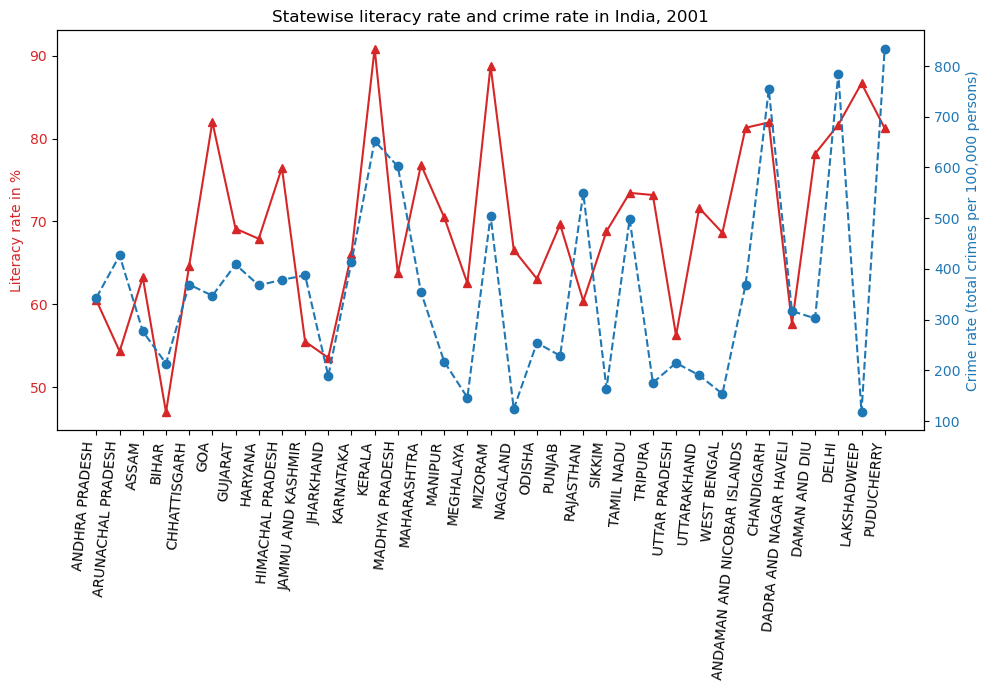

In [380]:
x = df_crime_lit['STATE/UT']
y = df_crime_lit['crime_rate_2001']
y1 = df_crime_lit['Literacy rate (%) [Census 2001]'].astype(float)
fig=plt.figure(figsize=(10,7))
color = 'tab:red'
plt.plot(x,y1.astype(float),color=color,marker='^',)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_ylabel('Literacy rate in %',color=color)
plt.xticks(rotation=85)
plt.gca().set_xticklabels(x, ha='right')
ax2 = plt.gca().twinx()
color = 'tab:blue'
plt.plot(x,y,color=color,marker='o',ls='--')
plt.gca().set_ylabel('Crime rate (total crimes per 100,000 persons)',color=color)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_title('Statewise literacy rate and crime rate in India, 2001')
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\1646741864.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


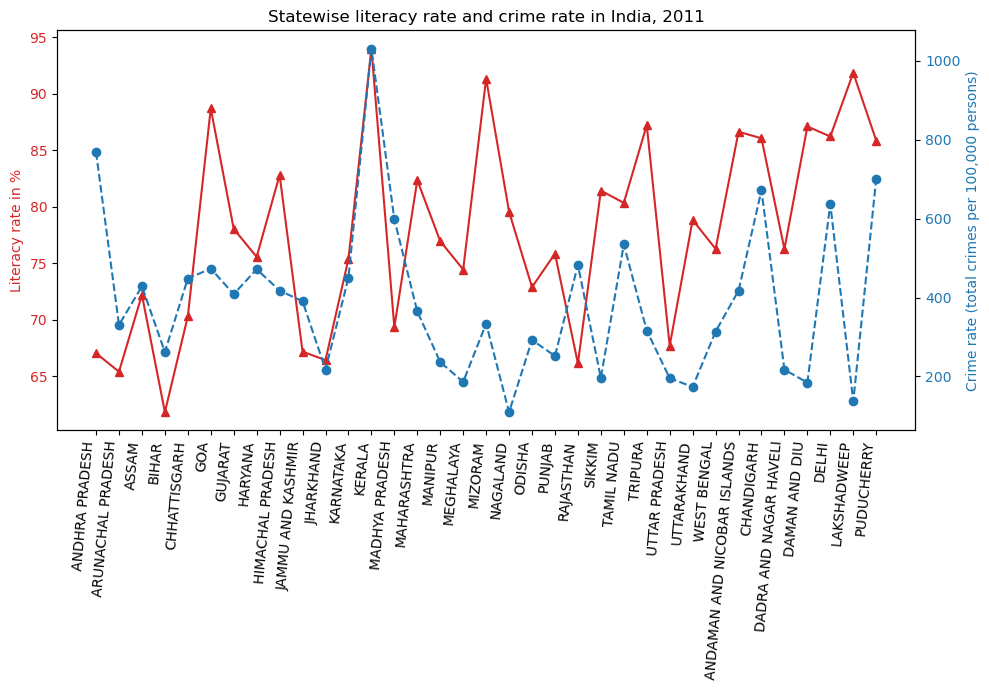

In [381]:
x = df_crime_lit['STATE/UT']
y = df_crime_lit['crime_rate_2011']
y1 = df_crime_lit['Literacy rate (%) [Census 2011]'].astype(float)
fig=plt.figure(figsize=(10,7))
color = 'tab:red'
plt.plot(x,y1.astype(float),color=color,marker='^',)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_ylabel('Literacy rate in %',color=color)
plt.xticks(rotation=85)
plt.gca().set_xticklabels(x, ha='right')
ax2 = plt.gca().twinx()
color = 'tab:blue'
plt.plot(x,y,color=color,marker='o',ls='--')
plt.gca().set_ylabel('Crime rate (total crimes per 100,000 persons)',color=color)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_title('Statewise literacy rate and crime rate in India, 2011')
plt.tight_layout()
plt.show()

## 2.2. Analysis of the type of crime vs each state vs Literacy rate.

In [382]:
df_crimes.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [383]:
df_crimes.groupby(['STATE/UT', 'YEAR'])['MURDER'].sum()


STATE/UT       YEAR
A & N ISLANDS  2001      26
               2002      34
               2003      42
               2004      30
               2005      28
                       ... 
WEST BENGAL    2008    3622
               2009    4136
               2010    4796
               2011    4218
               2012    4504
Name: MURDER, Length: 420, dtype: int64

In [384]:
# year = 2011  # Replace this with the year you're interested in
# murders_by_state = df_crimes[df_crimes['YEAR'] == year].groupby('STATE/UT')['MURDER'].sum()
# murders_by_state

In [385]:
df_crimes['STATE/UT']=df_crimes['STATE/UT'].replace('&','AND',regex=True)
df_crimes['STATE/UT']=df_crimes['STATE/UT'].replace('D AND N HAVELI','DADRA AND NAGAR HAVELI',regex=True)
df_crimes['STATE/UT']=df_crimes['STATE/UT'].replace('DELHI UT','DELHI',regex=True)
df_crimes['STATE/UT']=df_crimes['STATE/UT'].replace('A AND N ISLANDS','ANDAMAN AND NICOBAR ISLANDS',regex=True)
df_2001=df_crimes[df_crimes['YEAR']==2001].groupby('STATE/UT')['MURDER'].sum()
df_2011=df_crimes[df_crimes['YEAR']==2011].groupby('STATE/UT')['MURDER'].sum()

In [386]:
df2=pd.concat([df_2001,df_2011],axis=1,keys=['MURDER_2001', 'MURDER_2011'])


In [387]:
df2.reset_index(inplace=True)
df2_merge = pd.merge(df2, df_state_pop[['STATE/UT', 'Population [Census 2001]', 'Population [Census 2011]']], on='STATE/UT')
df2_merge
# df3

,STATE/UT,MURDER_2001,MURDER_2011,Population [Census 2001],Population [Census 2011]
0,ANDAMAN AND NICOBAR ISLANDS,26,28,356650,379944
1,ANDHRA PRADESH,5204,5616,75728400,49386799
2,ARUNACHAL PRADESH,166,130,1098328,1382611
3,ASSAM,2712,2606,26638600,31169272
4,BIHAR,7286,6396,82879910,103804630
5,CHANDIGARH,30,48,901080,1054686
6,CHHATTISGARH,1760,2220,20834530,25540196
7,DADRA AND NAGAR HAVELI,6,28,220963,342853
8,DAMAN AND DIU,14,12,158080,242911
9,DELHI,1094,1086,13851503,16753235


In [388]:
df_state_pop[['STATE/UT', 'Population [Census 2001]', 'Population [Census 2011]']].shape

(36, 3)

#### Statewise crime type: 'Murder' per 100,000 of population

In [389]:
Murder_2001 = (df2_merge['MURDER_2001'].div(df2_merge['Population [Census 2001]']))*100000
Murder_2011 = (df2_merge['MURDER_2011'].div(df2_merge['Population [Census 2011]']))*100000

In [390]:
df2_merge['Murder per 100000 population_2001'] = round(Murder_2001,2)
df2_merge['Murder per 100000 population_2011'] = round(Murder_2011,2)
df2_merge

,STATE/UT,MURDER_2001,MURDER_2011,Population [Census 2001],Population [Census 2011],Murder per 100000 population_2001,Murder per 100000 population_2011
0,ANDAMAN AND NICOBAR ISLANDS,26,28,356650,379944,7.29,7.37
1,ANDHRA PRADESH,5204,5616,75728400,49386799,6.87,11.37
2,ARUNACHAL PRADESH,166,130,1098328,1382611,15.11,9.40
3,ASSAM,2712,2606,26638600,31169272,10.18,8.36
4,BIHAR,7286,6396,82879910,103804630,8.79,6.16
5,CHANDIGARH,30,48,901080,1054686,3.33,4.55
6,CHHATTISGARH,1760,2220,20834530,25540196,8.45,8.69
7,DADRA AND NAGAR HAVELI,6,28,220963,342853,2.72,8.17
8,DAMAN AND DIU,14,12,158080,242911,8.86,4.94
9,DELHI,1094,1086,13851503,16753235,7.90,6.48


In [391]:
df_murder_lit=pd.merge(df2_merge,df_state_lit,on='STATE/UT')
df_murder_lit

,STATE/UT,MURDER_2001,MURDER_2011,Population [Census 2001],Population [Census 2011],Murder per 100000 population_2001,Murder per 100000 population_2011,Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,ANDAMAN AND NICOBAR ISLANDS,26,28,356650,379944,7.29,7.37,81.30,86.63
1,ANDHRA PRADESH,5204,5616,75728400,49386799,6.87,11.37,60.47,67.02
2,ARUNACHAL PRADESH,166,130,1098328,1382611,15.11,9.40,54.34,65.38
3,ASSAM,2712,2606,26638600,31169272,10.18,8.36,63.25,72.19
4,BIHAR,7286,6396,82879910,103804630,8.79,6.16,47.00,61.80
5,CHANDIGARH,30,48,901080,1054686,3.33,4.55,81.94,86.05
6,CHHATTISGARH,1760,2220,20834530,25540196,8.45,8.69,64.66,70.28
7,DADRA AND NAGAR HAVELI,6,28,220963,342853,2.72,8.17,57.63,76.24
8,DAMAN AND DIU,14,12,158080,242911,8.86,4.94,78.18,87.10
9,DELHI,1094,1086,13851503,16753235,7.90,6.48,81.67,86.21


C:\Users\admin\AppData\Local\Temp\ipykernel_13388\1596622818.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


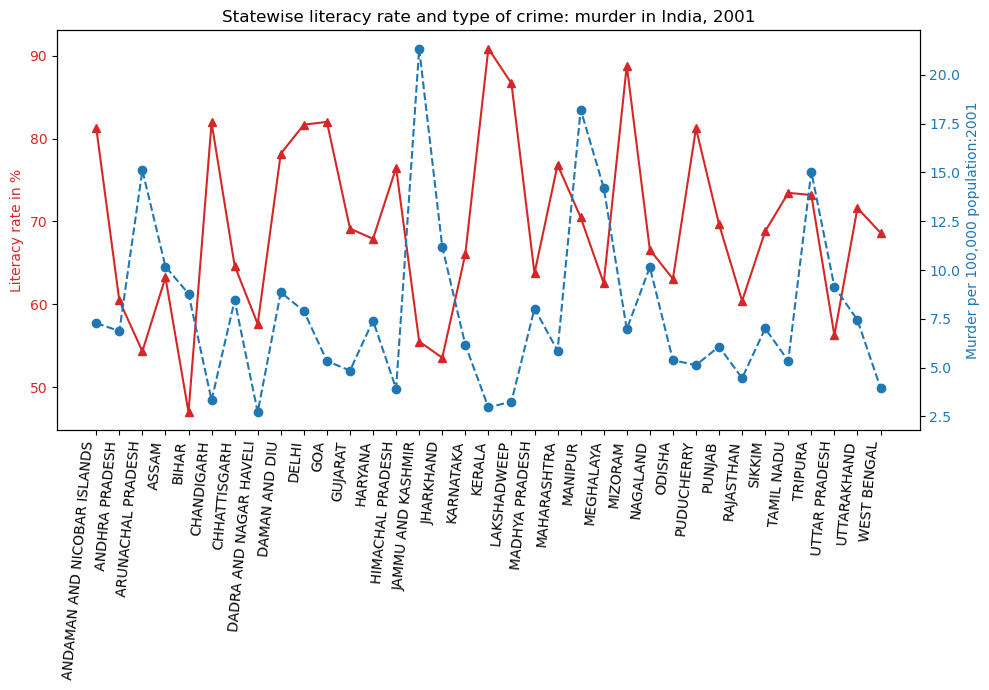

In [392]:
x = df_murder_lit['STATE/UT']
y = df_murder_lit['Murder per 100000 population_2001']
y1 = df_murder_lit['Literacy rate (%) [Census 2001]'].astype(float)
fig=plt.figure(figsize=(10,7))
color = 'tab:red'
plt.plot(x,y1.astype(float),color=color,marker='^',)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_ylabel('Literacy rate in %',color=color)
plt.xticks(rotation=85)
plt.gca().set_xticklabels(x, ha='right')
ax2 = plt.gca().twinx()
color = 'tab:blue'
plt.plot(x,y,color=color,marker='o',ls='--')
plt.gca().set_ylabel('Murder per 100,000 population:2001',color=color)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_title('Statewise literacy rate and type of crime: murder in India, 2001')
plt.tight_layout()
plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3944323758.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


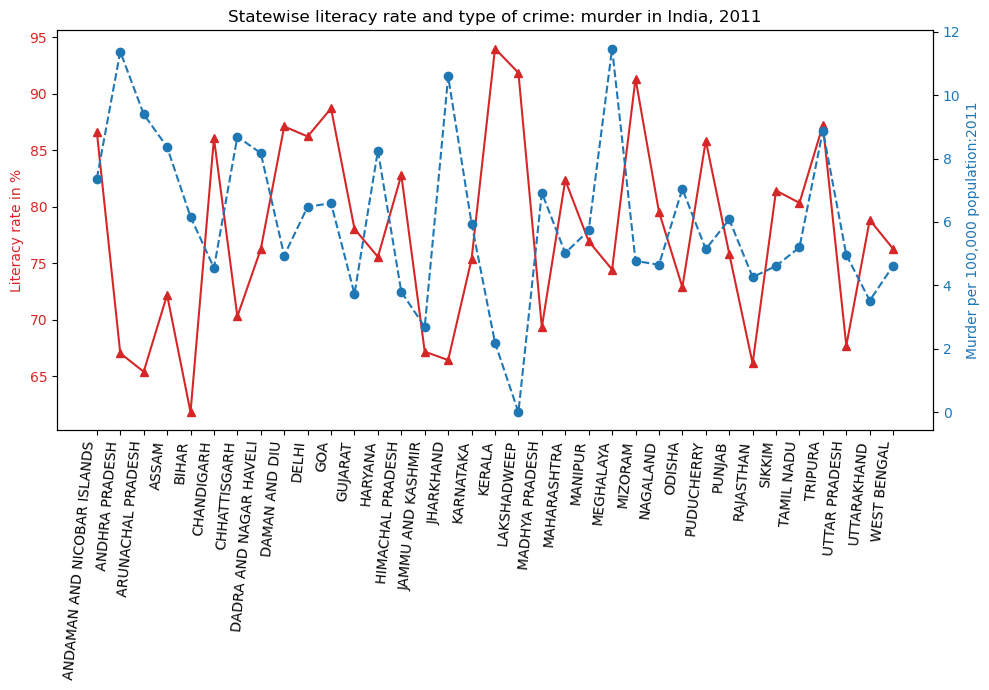

In [393]:
x = df_murder_lit['STATE/UT']
y = df_murder_lit['Murder per 100000 population_2011']
y1 = df_murder_lit['Literacy rate (%) [Census 2011]'].astype(float)
fig=plt.figure(figsize=(10,7))
color = 'tab:red'
plt.plot(x,y1.astype(float),color=color,marker='^',)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_ylabel('Literacy rate in %',color=color)
plt.xticks(rotation=85)
plt.gca().set_xticklabels(x, ha='right')
ax2 = plt.gca().twinx()
color = 'tab:blue'
plt.plot(x,y,color=color,marker='o',ls='--')
plt.gca().set_ylabel('Murder per 100,000 population:2011',color=color)
plt.gca().tick_params(axis='y', labelcolor=color)
plt.gca().set_title('Statewise literacy rate and type of crime: murder in India, 2011')
plt.tight_layout()
plt.show()

#### Crime types statewise: 2001

In [394]:
year = 2001  # Replace this with the year you're interested in
df_crime_types=pd.DataFrame()
for i in df_crimes.columns[3:32]:
    crimes_by_state = df_crimes[df_crimes['YEAR'] == year].groupby('STATE/UT')[i].sum()
    df_crime_types[f'{i}']=crimes_by_state
df_crime_types.reset_index(inplace=True)
df_crime_types

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES
0,ANDAMAN AND NICOBAR ISLANDS,26,0,0,6,0,6,4,4,0,...,4,8,236,0,38,2,18,0,0,646
1,ANDHRA PRADESH,5204,3110,272,1742,0,1742,2364,1530,834,...,288,1744,69894,840,7088,4542,11582,14,14800,68688
2,ARUNACHAL PRADESH,166,106,6,66,0,66,166,110,56,...,8,26,932,0,156,6,22,0,0,1236
3,ASSAM,2712,962,80,1634,0,1634,2960,2140,820,...,92,882,11610,118,1700,8,2496,0,4020,18630
4,BIHAR,7286,6838,500,1776,0,1776,4318,1036,3282,...,170,1004,15088,1718,1124,42,3116,166,4812,73334
5,CHANDIGARH,30,20,12,36,0,36,112,100,12,...,4,10,190,6,48,30,72,0,12,1828
6,CHHATTISGARH,1760,1058,90,1918,0,1918,414,342,72,...,16,430,10954,140,3526,322,1680,0,1378,31580
7,DADRA AND NAGAR HAVELI,6,4,0,12,0,12,8,4,4,...,2,2,58,0,14,0,8,0,0,366
8,DAMAN AND DIU,14,10,0,0,0,0,10,6,4,...,2,6,42,0,0,0,8,0,0,146
9,DELHI,1094,1020,126,762,0,762,3254,1928,1326,...,84,100,4022,226,1004,180,276,0,864,44000


#### Crime types per 100,000 of population: 2001

In [395]:
df_crime_types.reset_index(inplace=True)
df_crime_rate_type = pd.merge(df_crime_types, df_state_pop[['STATE/UT', 'Population [Census 2001]', 'Population [Census 2011]']], on='STATE/UT')
df_crime_rate_type

,index,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,Population [Census 2001],Population [Census 2011]
0,0,ANDAMAN AND NICOBAR ISLANDS,26,0,0,6,0,6,4,4,...,236,0,38,2,18,0,0,646,356650,379944
1,1,ANDHRA PRADESH,5204,3110,272,1742,0,1742,2364,1530,...,69894,840,7088,4542,11582,14,14800,68688,75728400,49386799
2,2,ARUNACHAL PRADESH,166,106,6,66,0,66,166,110,...,932,0,156,6,22,0,0,1236,1098328,1382611
3,3,ASSAM,2712,962,80,1634,0,1634,2960,2140,...,11610,118,1700,8,2496,0,4020,18630,26638600,31169272
4,4,BIHAR,7286,6838,500,1776,0,1776,4318,1036,...,15088,1718,1124,42,3116,166,4812,73334,82879910,103804630
5,5,CHANDIGARH,30,20,12,36,0,36,112,100,...,190,6,48,30,72,0,12,1828,901080,1054686
6,6,CHHATTISGARH,1760,1058,90,1918,0,1918,414,342,...,10954,140,3526,322,1680,0,1378,31580,20834530,25540196
7,7,DADRA AND NAGAR HAVELI,6,4,0,12,0,12,8,4,...,58,0,14,0,8,0,0,366,220963,342853
8,8,DAMAN AND DIU,14,10,0,0,0,0,10,6,...,42,0,0,0,8,0,0,146,158080,242911
9,9,DELHI,1094,1020,126,762,0,762,3254,1928,...,4022,226,1004,180,276,0,864,44000,13851503,16753235


In [396]:
df_crime_rate_type.columns[2:31]

Index(['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES'],
      dtype='object')

In [397]:
for j in df_crime_rate_type.columns[2:31]:
    crime_rate1 = (df_crime_rate_type[j].div(df_crime_rate_type['Population [Census 2001]']))*100000
    df_crime_rate_type[f'{j} per 100,000 population'] = round(crime_rate1,2)
df_crime_rate_type

,index,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,"COUNTERFIETING per 100,000 population","ARSON per 100,000 population","HURT/GREVIOUS HURT per 100,000 population","DOWRY DEATHS per 100,000 population","ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population","INSULT TO MODESTY OF WOMEN per 100,000 population","CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population","IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES per 100,000 population","CAUSING DEATH BY NEGLIGENCE per 100,000 population","OTHER IPC CRIMES per 100,000 population"
0,0,ANDAMAN AND NICOBAR ISLANDS,26,0,0,6,0,6,4,4,...,1.12,2.24,66.17,0.00,10.65,0.56,5.05,0.00,0.00,181.13
1,1,ANDHRA PRADESH,5204,3110,272,1742,0,1742,2364,1530,...,0.38,2.30,92.30,1.11,9.36,6.00,15.29,0.02,19.54,90.70
2,2,ARUNACHAL PRADESH,166,106,6,66,0,66,166,110,...,0.73,2.37,84.86,0.00,14.20,0.55,2.00,0.00,0.00,112.53
3,3,ASSAM,2712,962,80,1634,0,1634,2960,2140,...,0.35,3.31,43.58,0.44,6.38,0.03,9.37,0.00,15.09,69.94
4,4,BIHAR,7286,6838,500,1776,0,1776,4318,1036,...,0.21,1.21,18.20,2.07,1.36,0.05,3.76,0.20,5.81,88.48
5,5,CHANDIGARH,30,20,12,36,0,36,112,100,...,0.44,1.11,21.09,0.67,5.33,3.33,7.99,0.00,1.33,202.87
6,6,CHHATTISGARH,1760,1058,90,1918,0,1918,414,342,...,0.08,2.06,52.58,0.67,16.92,1.55,8.06,0.00,6.61,151.58
7,7,DADRA AND NAGAR HAVELI,6,4,0,12,0,12,8,4,...,0.91,0.91,26.25,0.00,6.34,0.00,3.62,0.00,0.00,165.64
8,8,DAMAN AND DIU,14,10,0,0,0,0,10,6,...,1.27,3.80,26.57,0.00,0.00,0.00,5.06,0.00,0.00,92.36
9,9,DELHI,1094,1020,126,762,0,762,3254,1928,...,0.61,0.72,29.04,1.63,7.25,1.30,1.99,0.00,6.24,317.66


In [398]:
df_crime_rate_lit=pd.merge(df_crime_rate_type,df_state_lit,on='STATE/UT')
df_crime_rate_lit

,index,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,"HURT/GREVIOUS HURT per 100,000 population","DOWRY DEATHS per 100,000 population","ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population","INSULT TO MODESTY OF WOMEN per 100,000 population","CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population","IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES per 100,000 population","CAUSING DEATH BY NEGLIGENCE per 100,000 population","OTHER IPC CRIMES per 100,000 population",Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,0,ANDAMAN AND NICOBAR ISLANDS,26,0,0,6,0,6,4,4,...,66.17,0.00,10.65,0.56,5.05,0.00,0.00,181.13,81.30,86.63
1,1,ANDHRA PRADESH,5204,3110,272,1742,0,1742,2364,1530,...,92.30,1.11,9.36,6.00,15.29,0.02,19.54,90.70,60.47,67.02
2,2,ARUNACHAL PRADESH,166,106,6,66,0,66,166,110,...,84.86,0.00,14.20,0.55,2.00,0.00,0.00,112.53,54.34,65.38
3,3,ASSAM,2712,962,80,1634,0,1634,2960,2140,...,43.58,0.44,6.38,0.03,9.37,0.00,15.09,69.94,63.25,72.19
4,4,BIHAR,7286,6838,500,1776,0,1776,4318,1036,...,18.20,2.07,1.36,0.05,3.76,0.20,5.81,88.48,47.00,61.80
5,5,CHANDIGARH,30,20,12,36,0,36,112,100,...,21.09,0.67,5.33,3.33,7.99,0.00,1.33,202.87,81.94,86.05
6,6,CHHATTISGARH,1760,1058,90,1918,0,1918,414,342,...,52.58,0.67,16.92,1.55,8.06,0.00,6.61,151.58,64.66,70.28
7,7,DADRA AND NAGAR HAVELI,6,4,0,12,0,12,8,4,...,26.25,0.00,6.34,0.00,3.62,0.00,0.00,165.64,57.63,76.24
8,8,DAMAN AND DIU,14,10,0,0,0,0,10,6,...,26.57,0.00,0.00,0.00,5.06,0.00,0.00,92.36,78.18,87.10
9,9,DELHI,1094,1020,126,762,0,762,3254,1928,...,29.04,1.63,7.25,1.30,1.99,0.00,6.24,317.66,81.67,86.21


C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


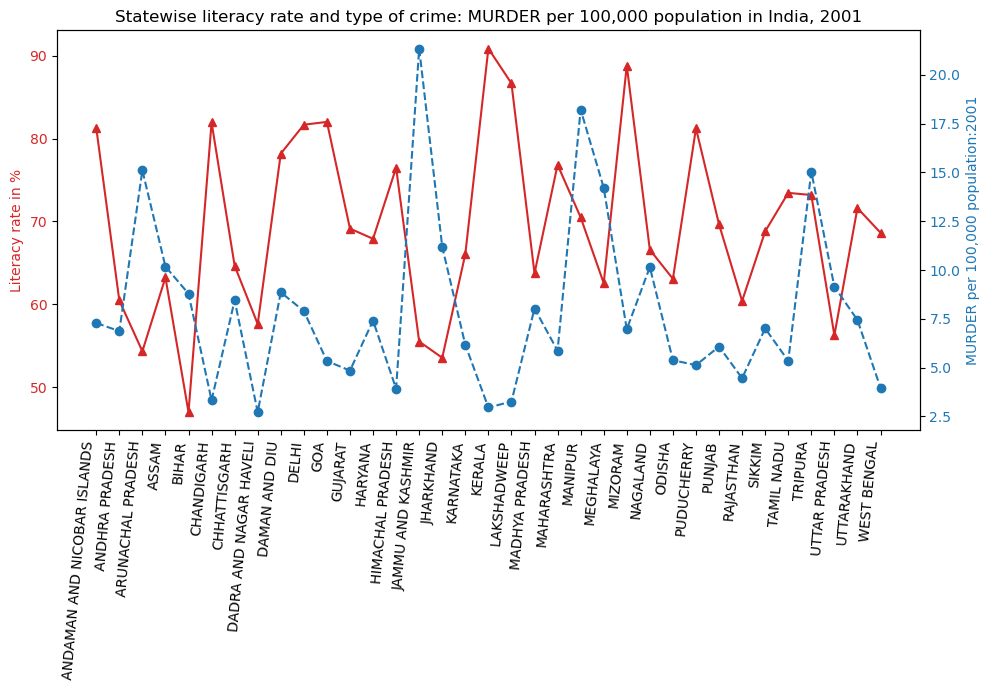

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


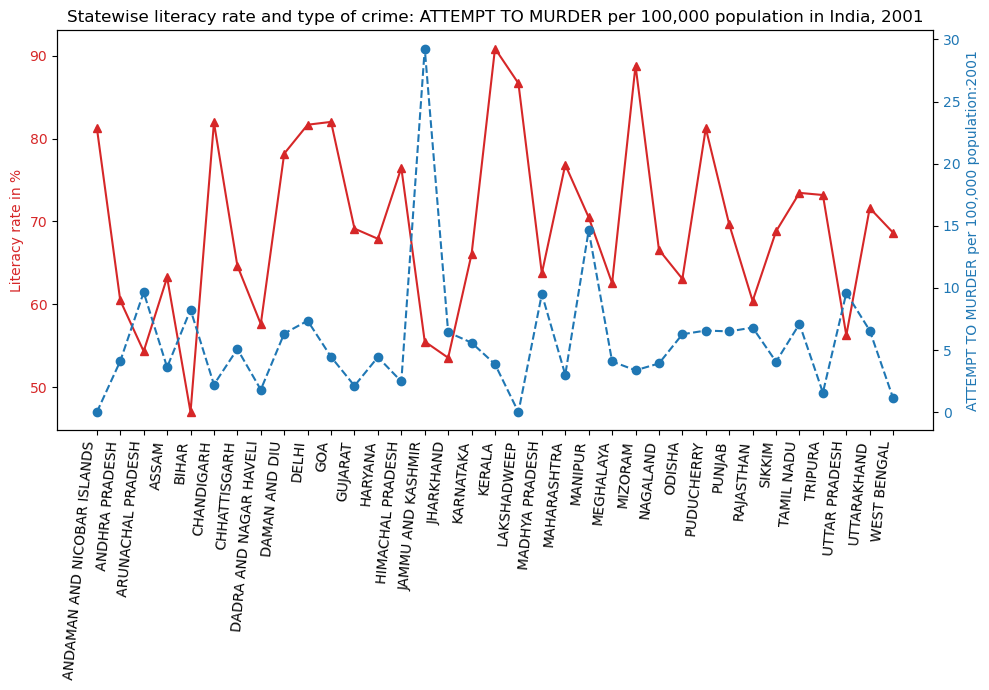

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


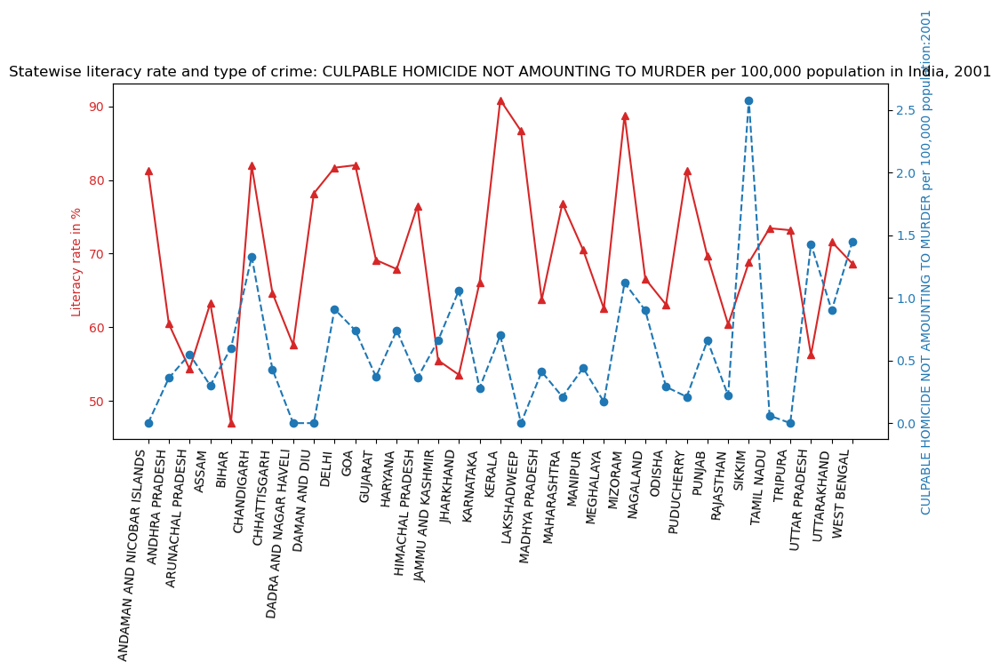

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


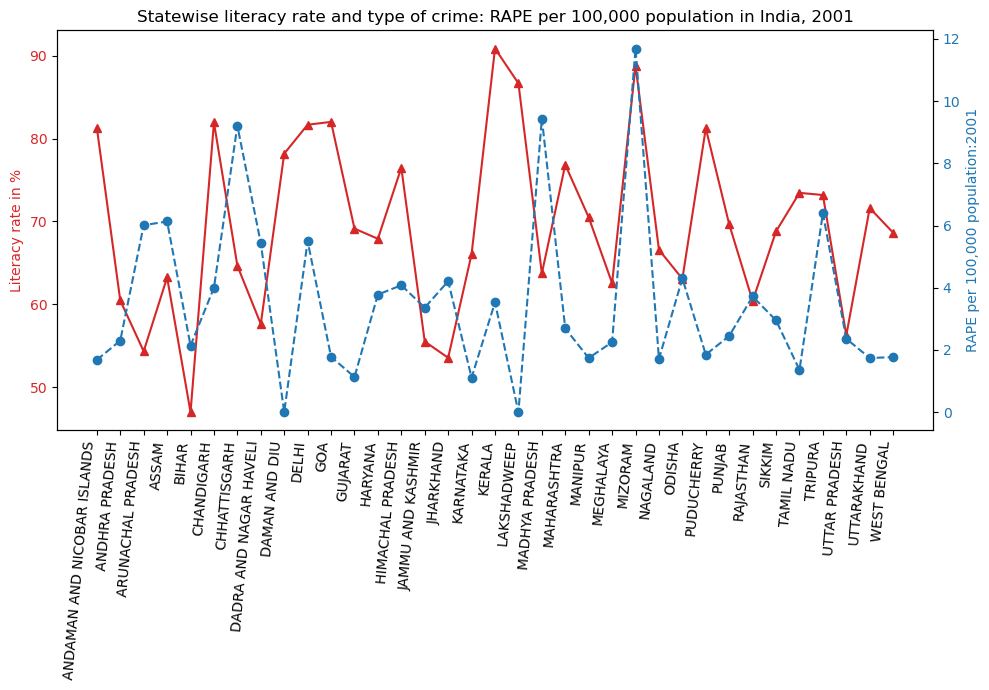

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


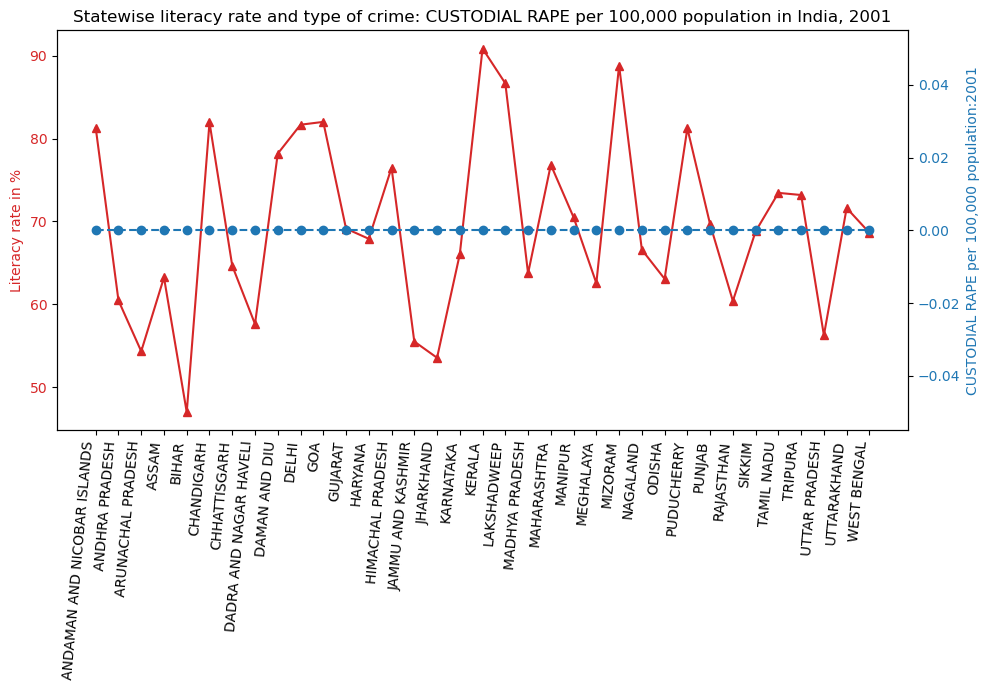

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


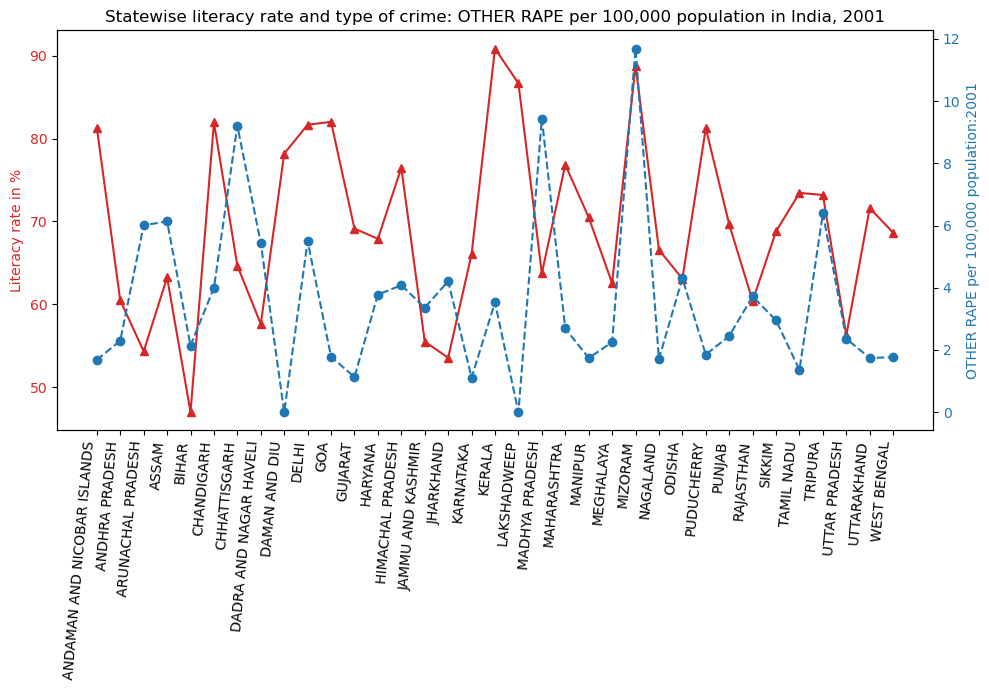

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


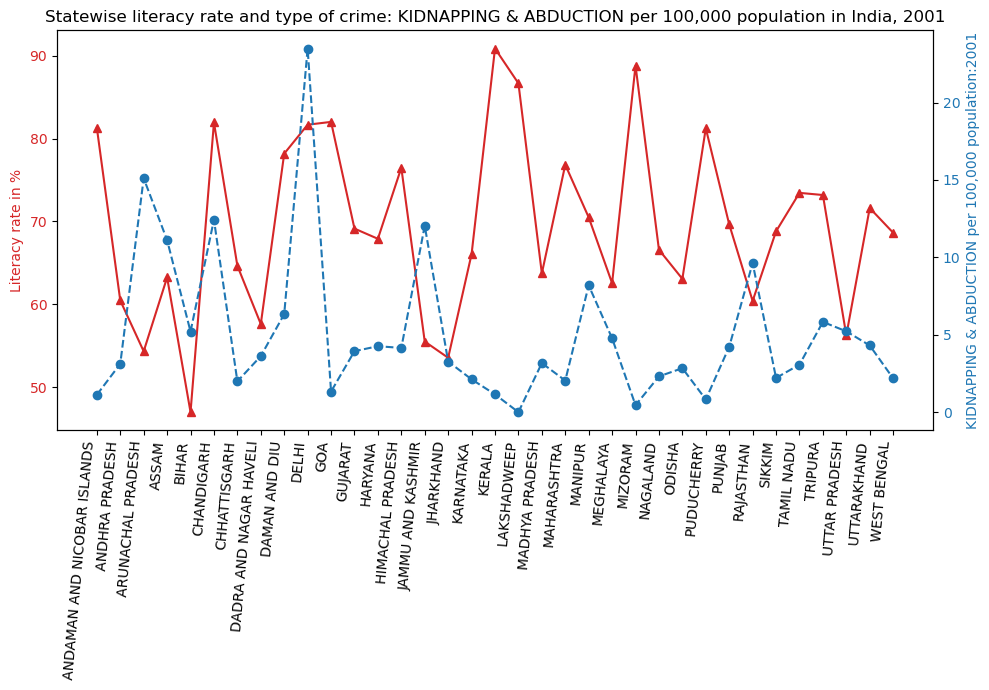

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


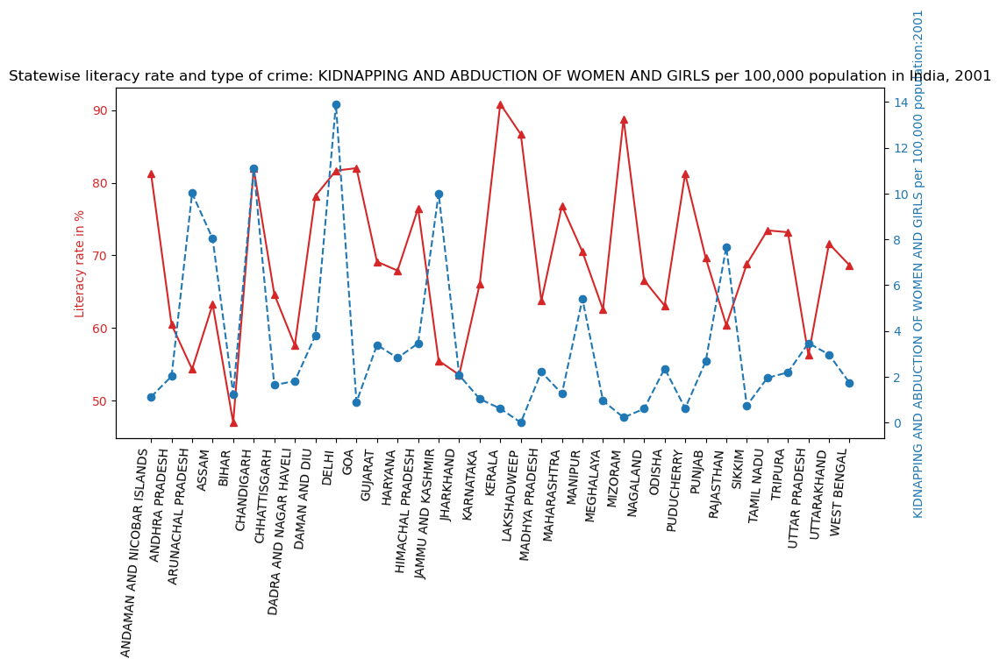

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


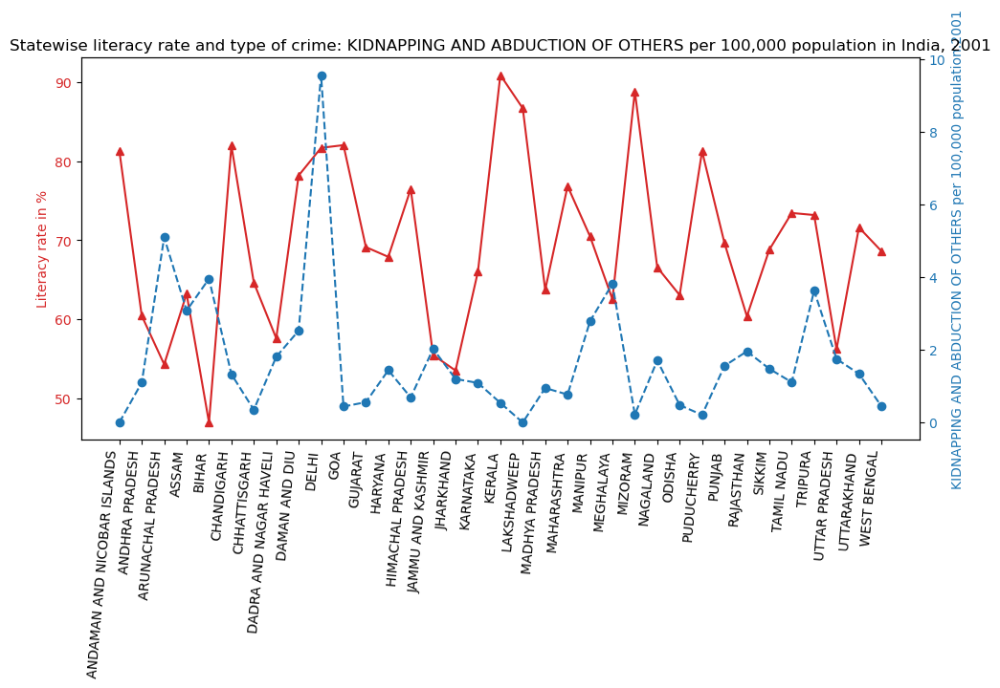

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


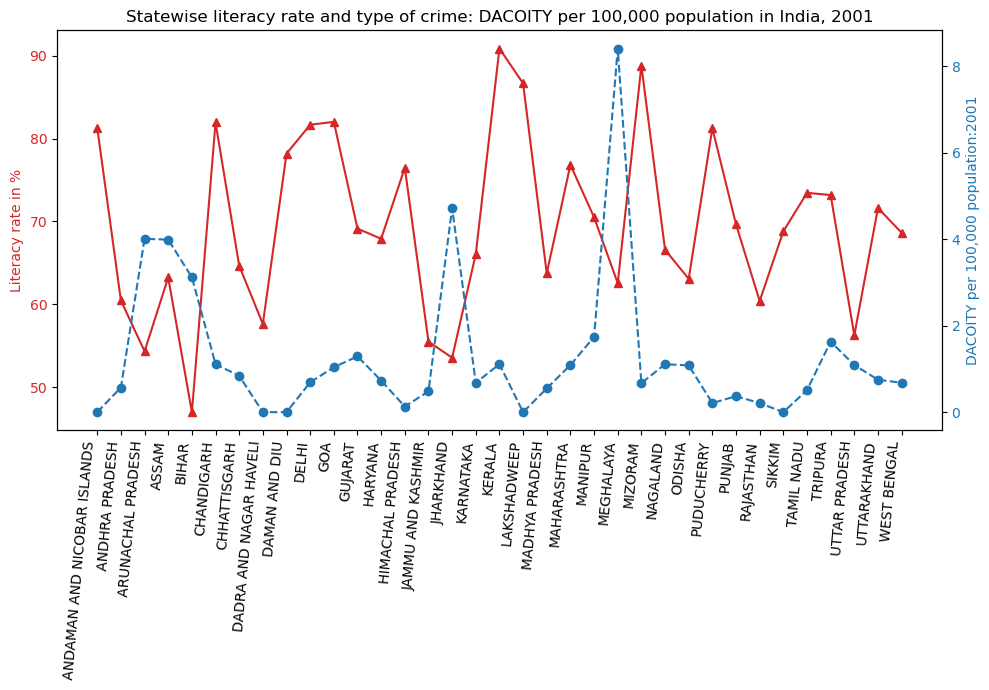

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


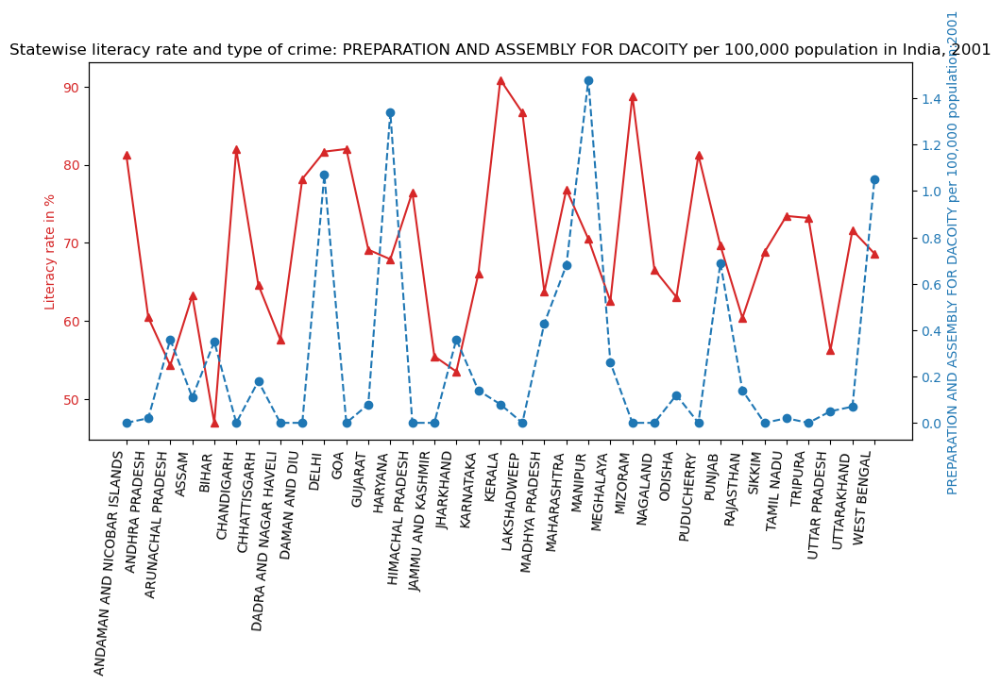

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


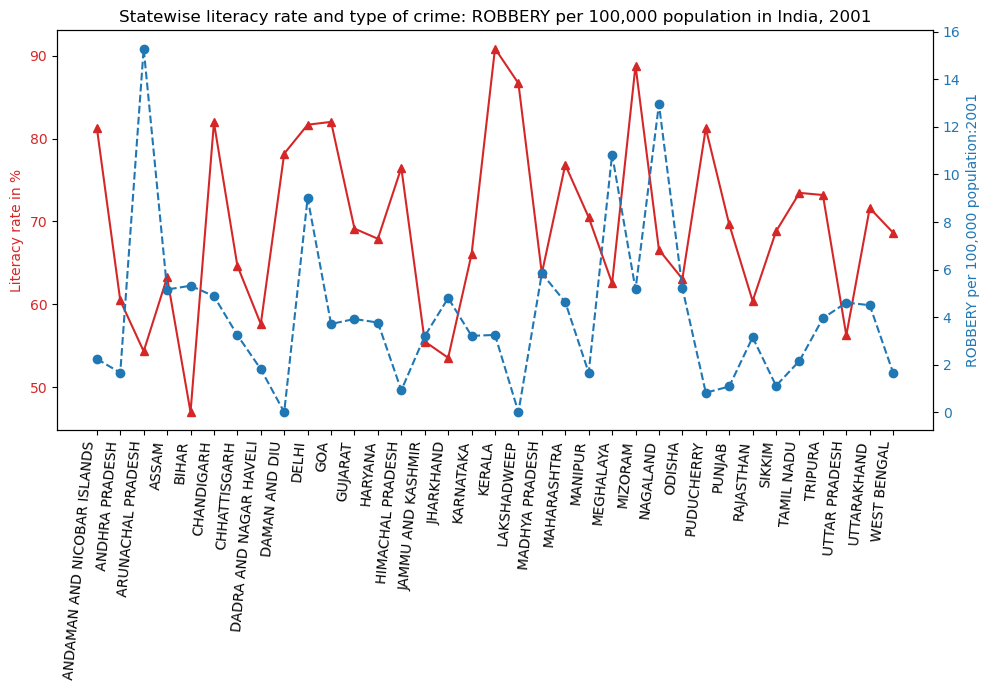

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


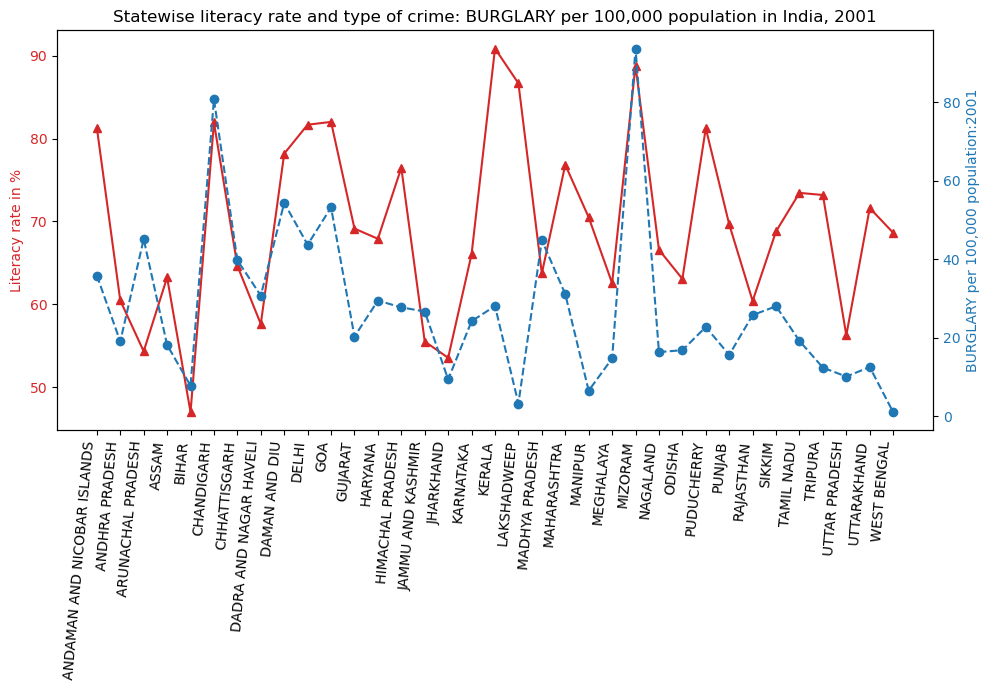

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


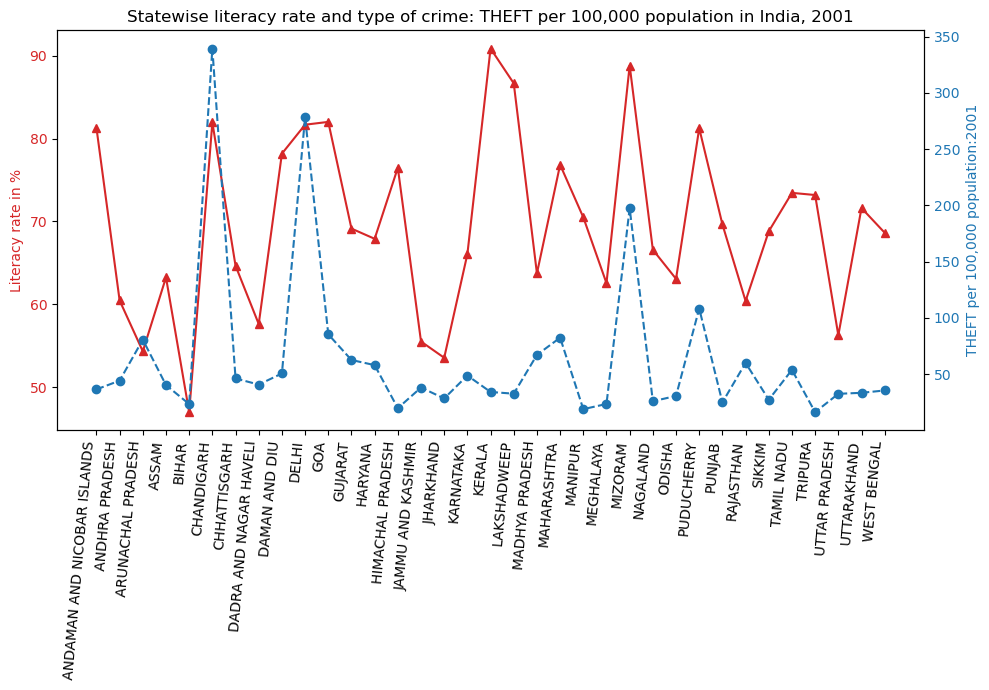

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


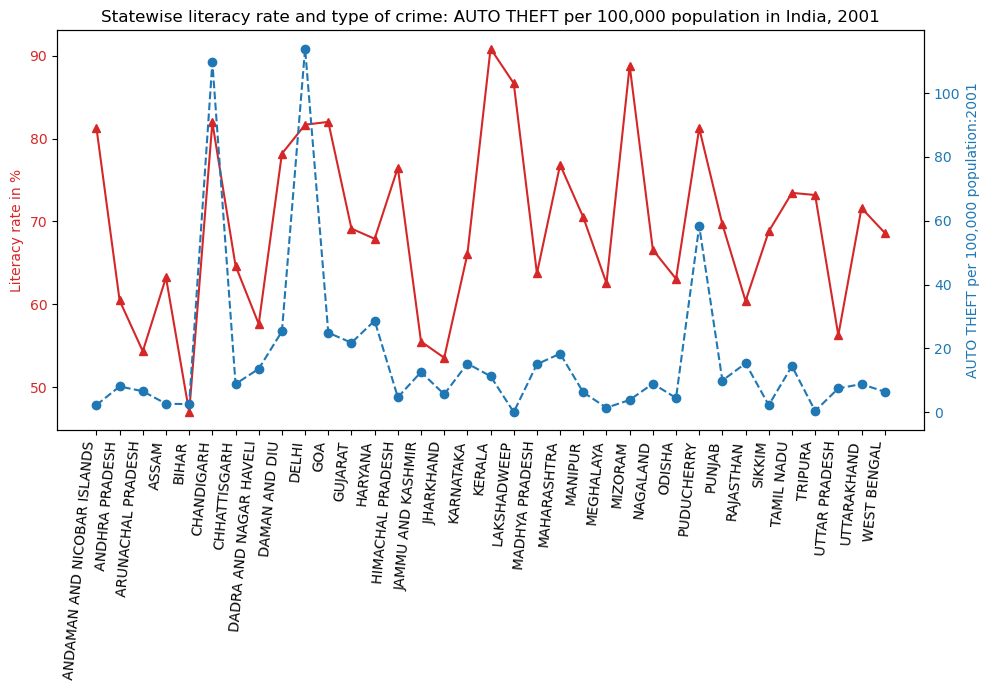

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


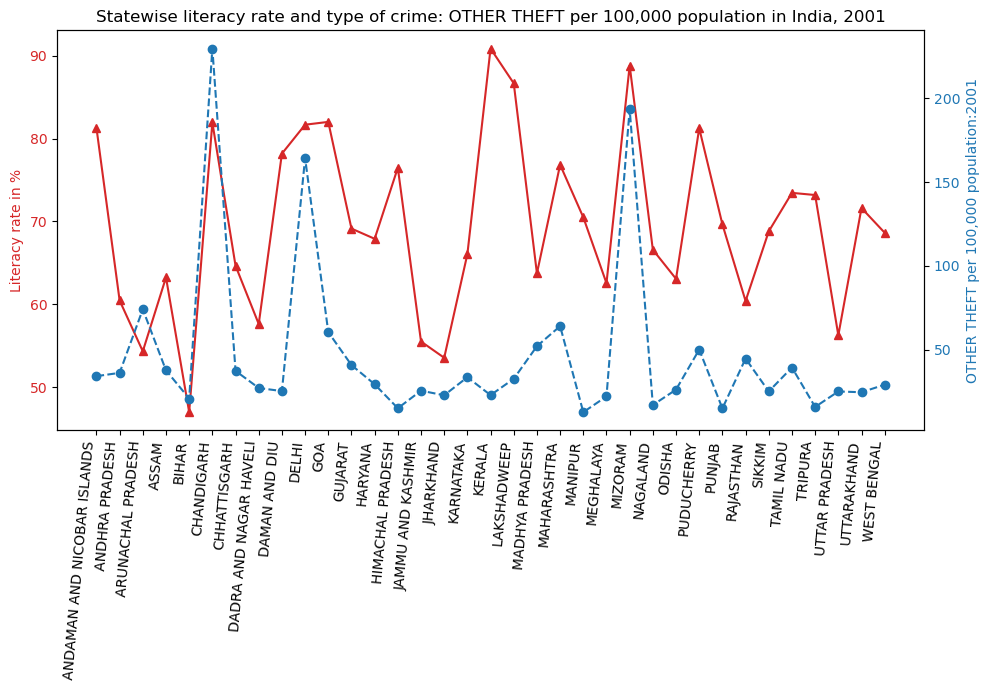

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


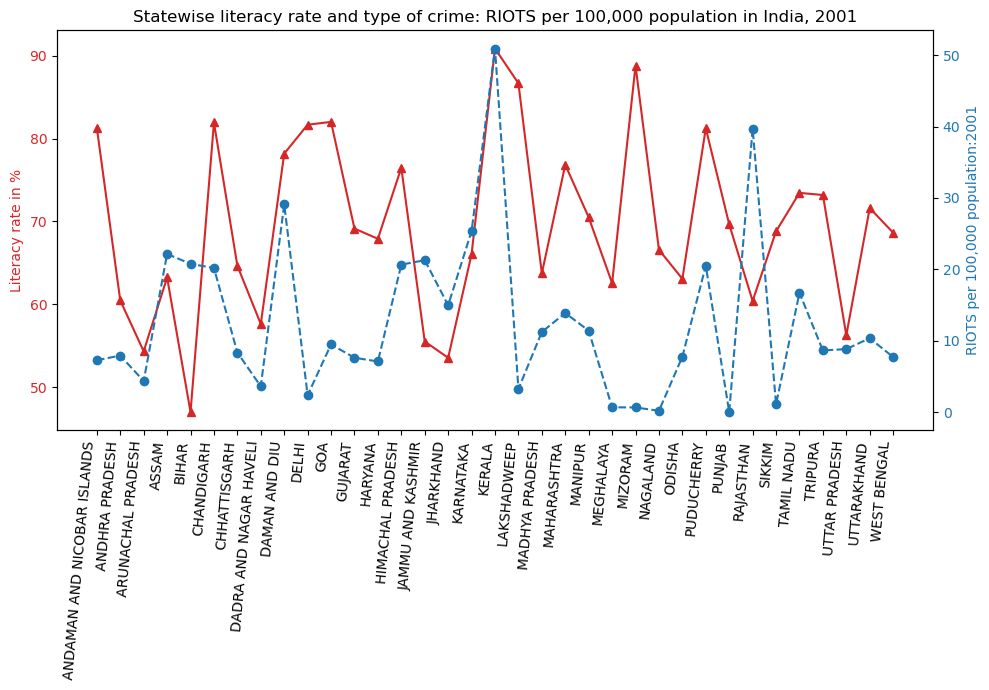

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


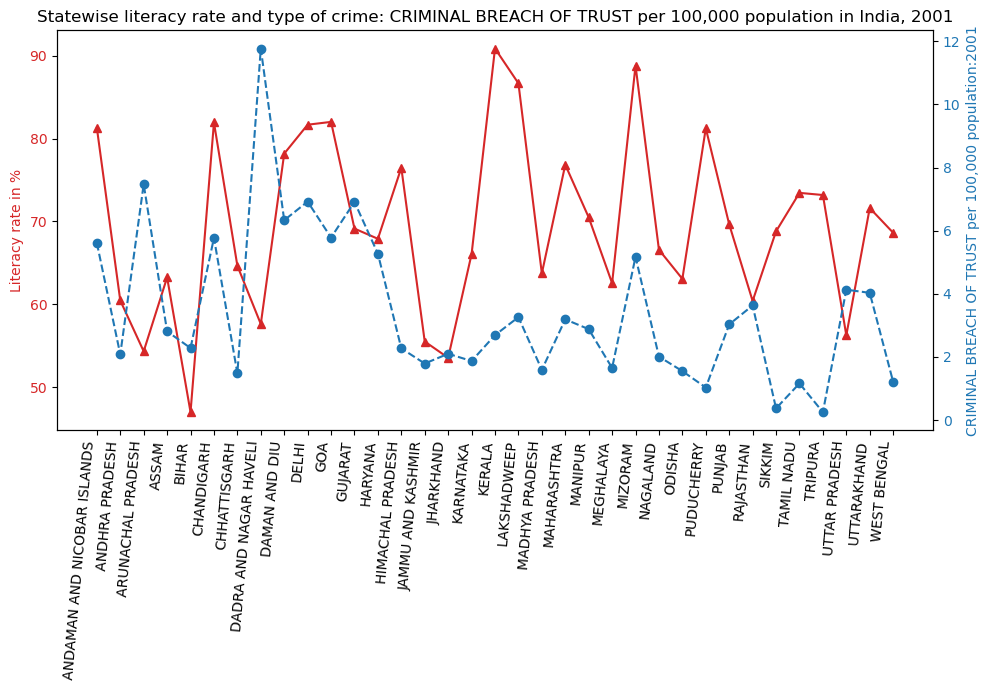

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


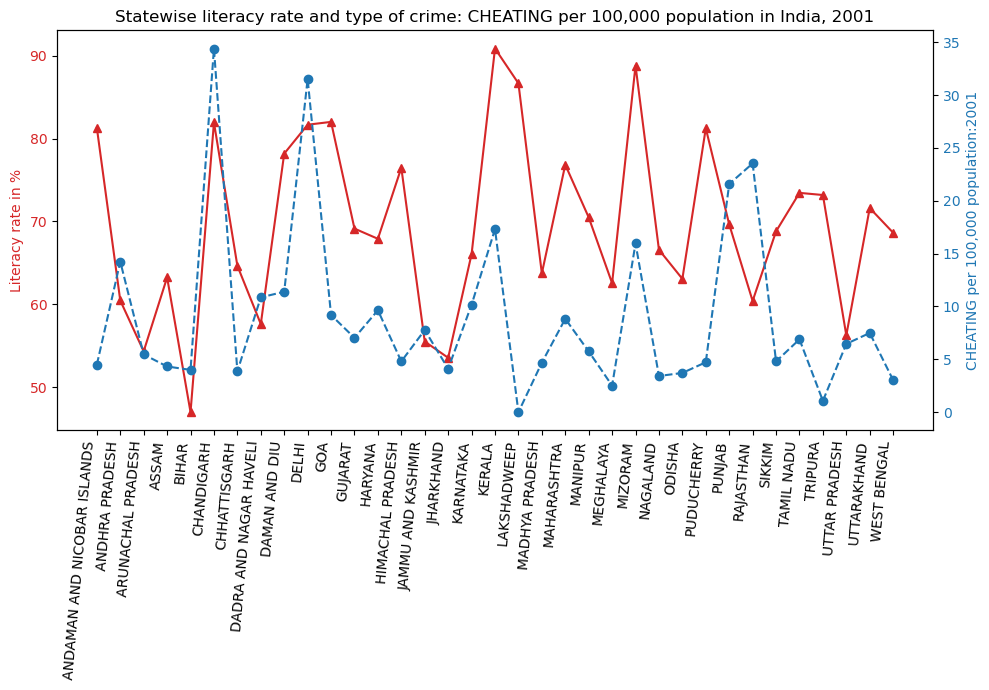

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


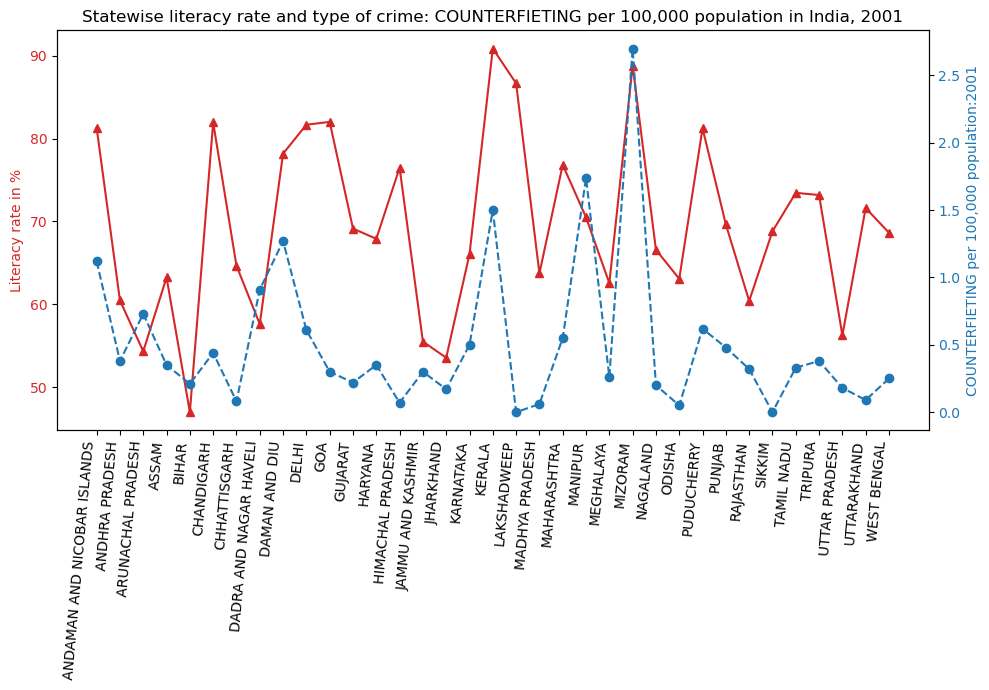

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


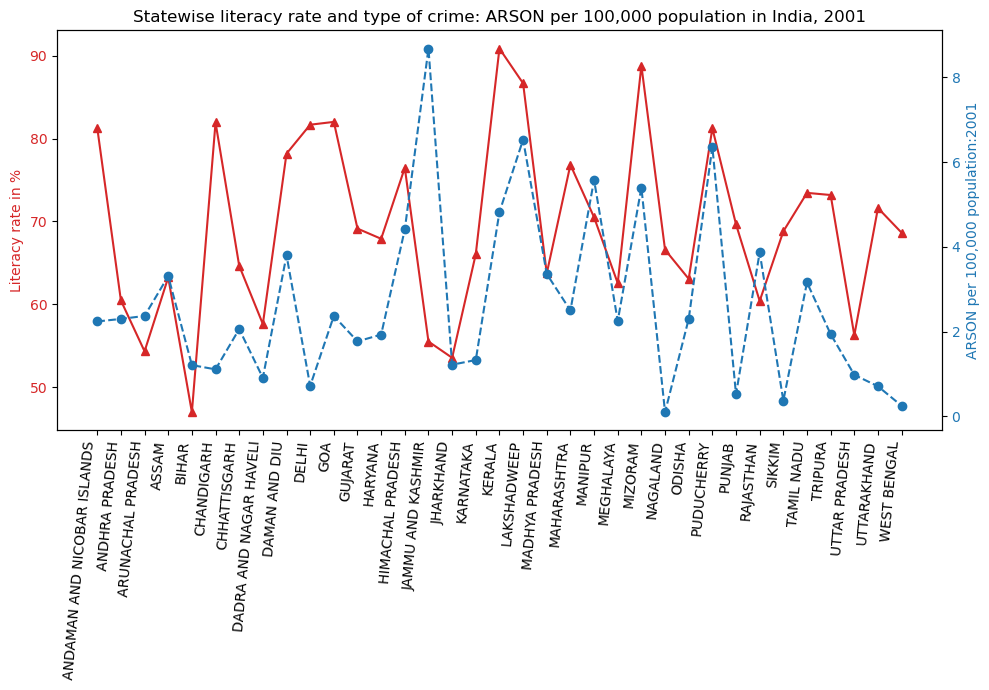

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


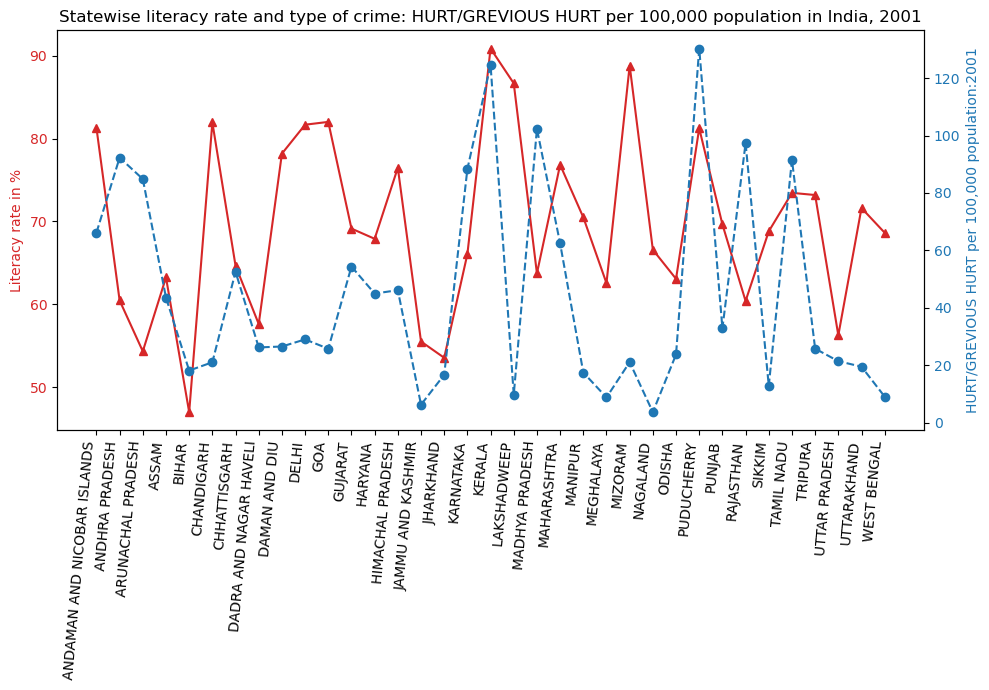

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


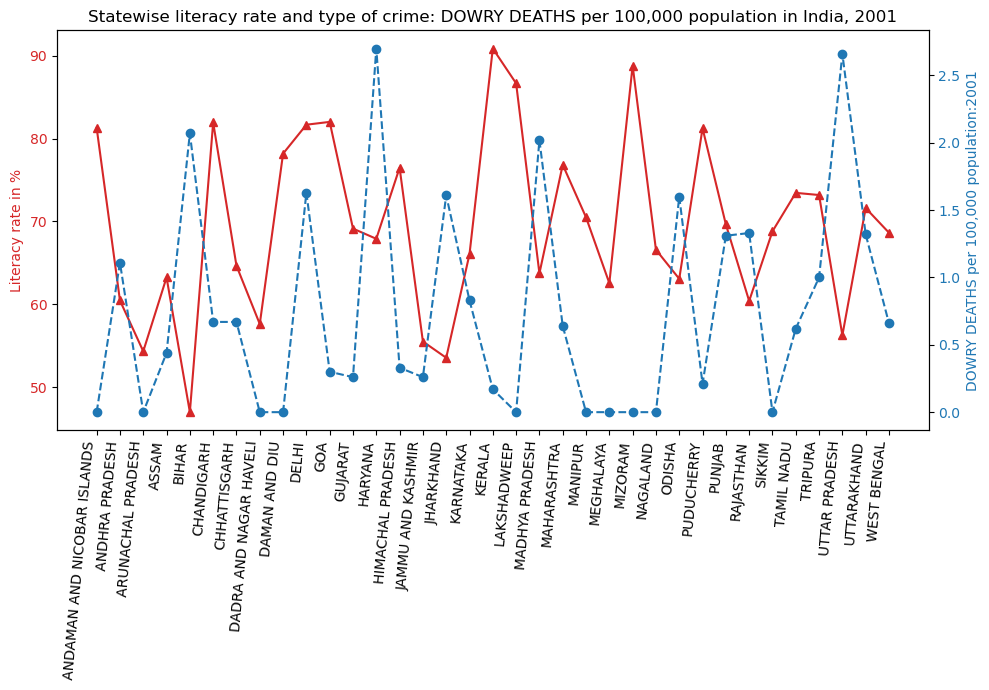

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


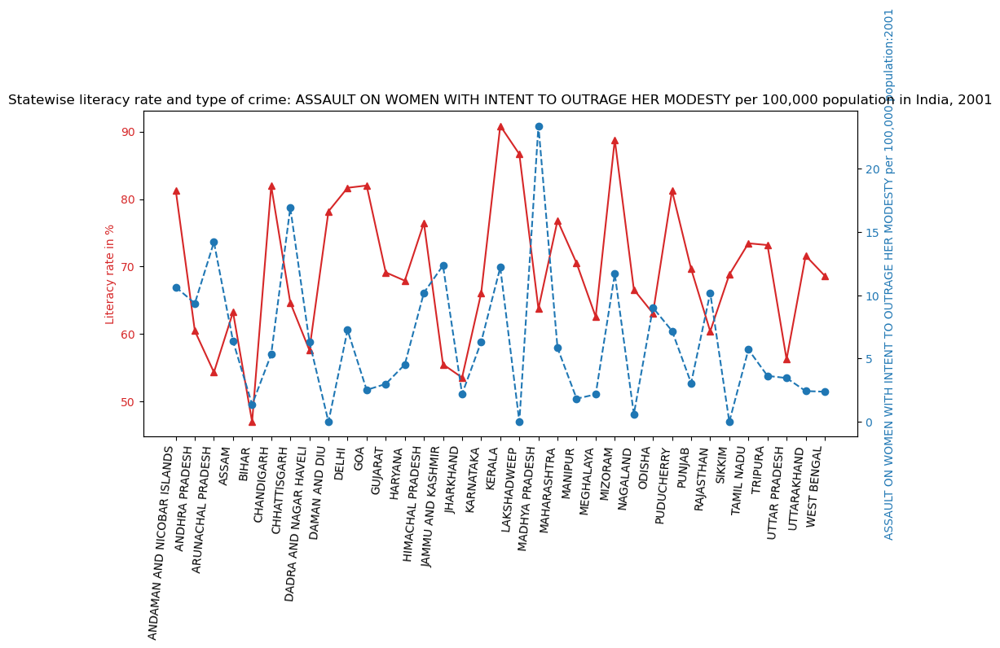

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


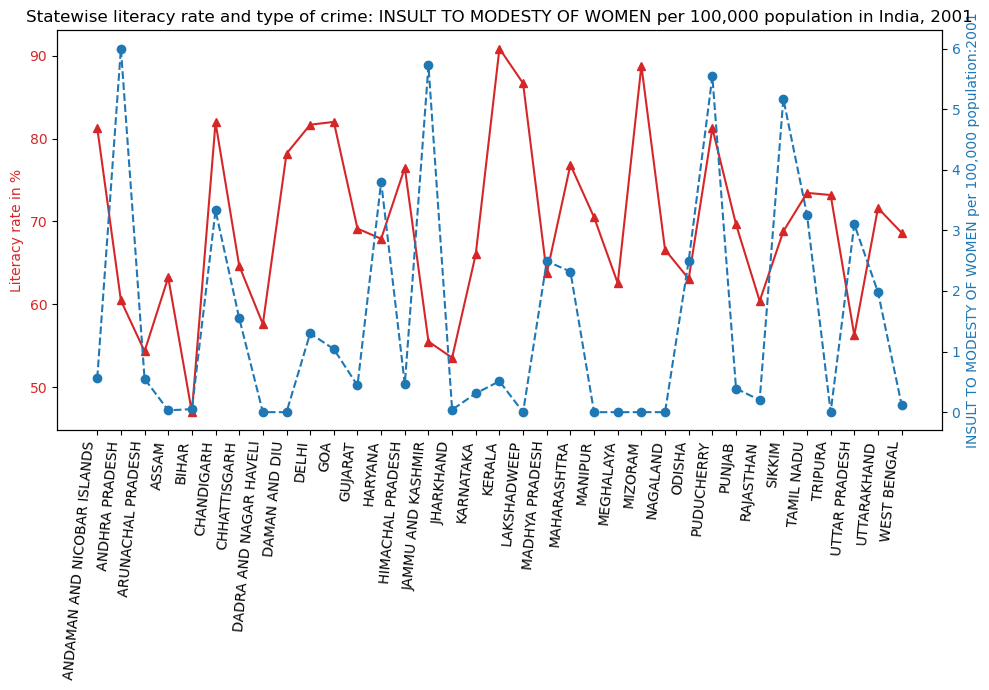

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


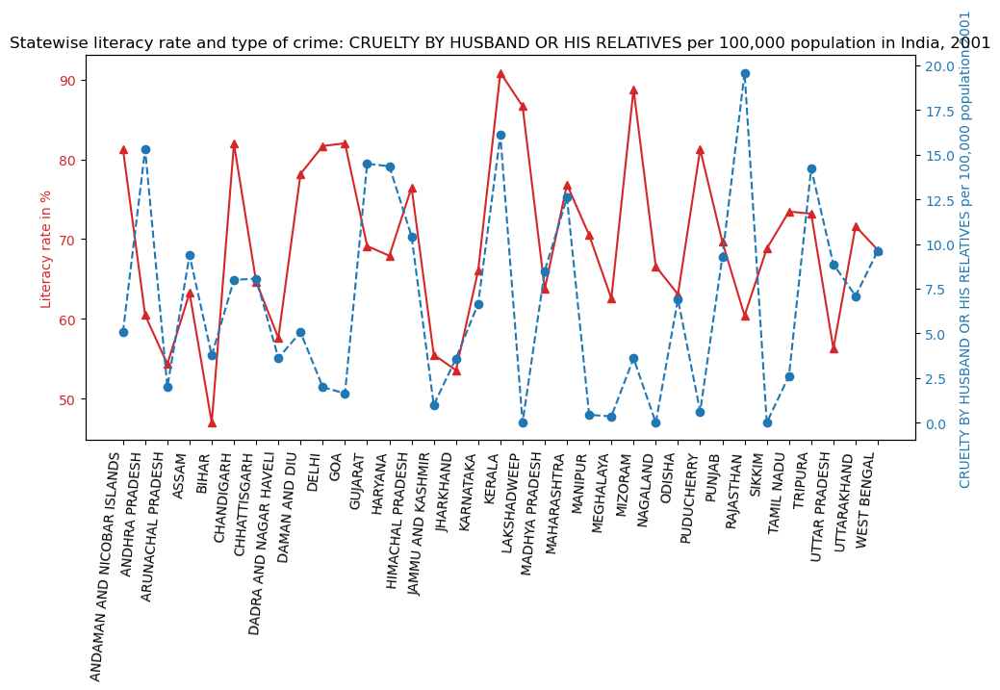

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


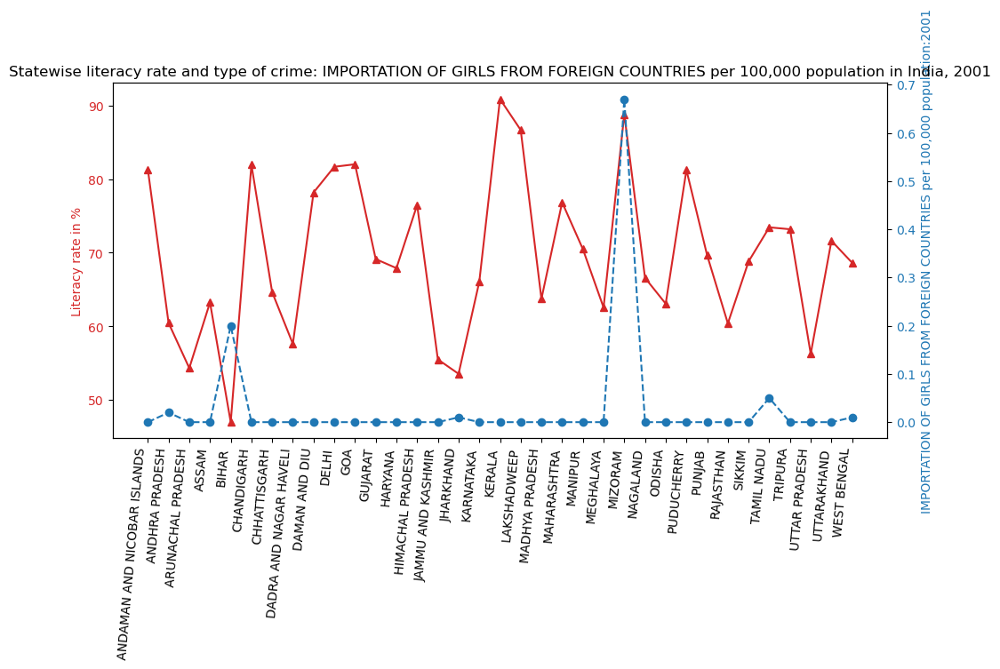

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


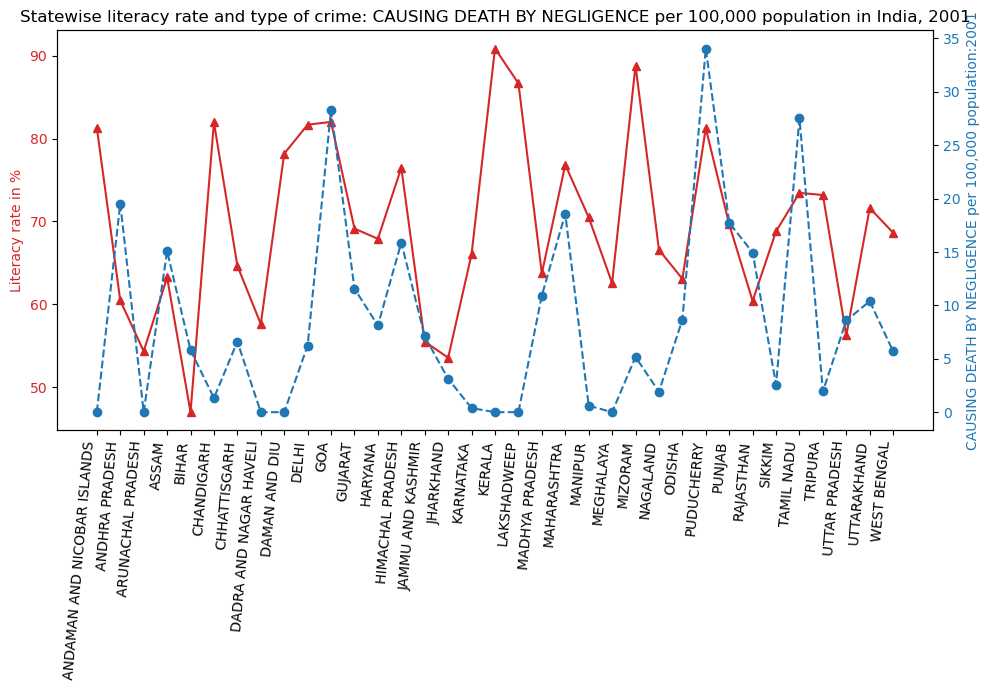

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\3932020985.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


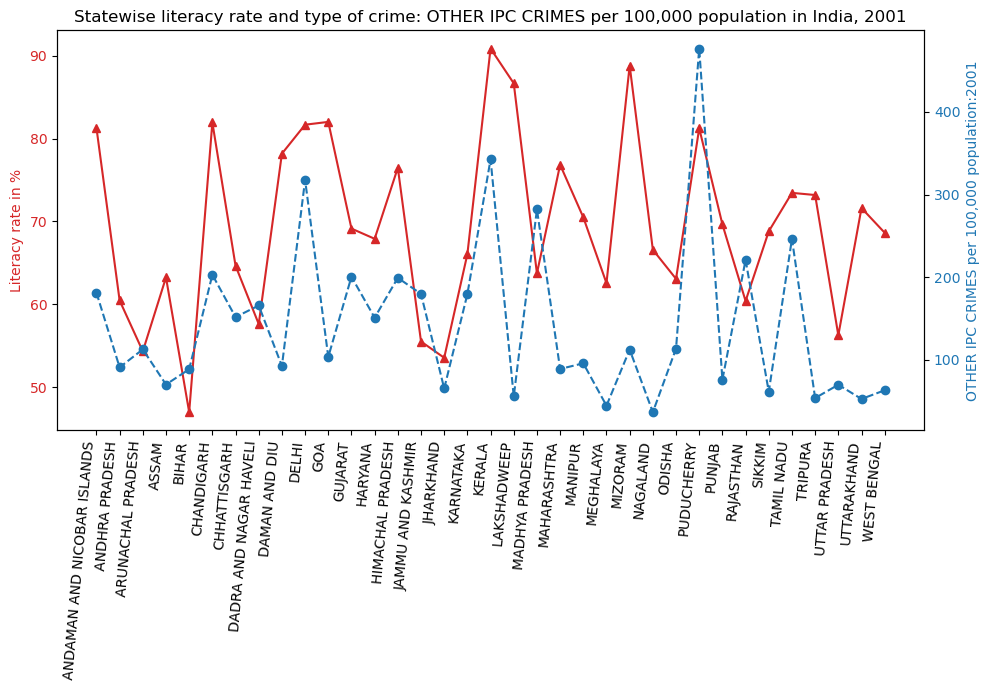

In [399]:
x = df_crime_rate_lit['STATE/UT']
y1 = df_crime_rate_lit['Literacy rate (%) [Census 2001]'].astype(float)
for k in df_crime_rate_lit.columns[33:62]:
    y = df_crime_rate_lit[k]
    fig=plt.figure(figsize=(10,7))
    color = 'tab:red'
    plt.plot(x,y1.astype(float),color=color,marker='^',)
    plt.gca().tick_params(axis='y', labelcolor=color)
    plt.gca().set_ylabel('Literacy rate in %',color=color)
    plt.xticks(rotation=85)
    plt.gca().set_xticklabels(x, ha='right')
    ax2 = plt.gca().twinx()
    color = 'tab:blue'
    plt.plot(x,y,color=color,marker='o',ls='--')
    plt.gca().set_ylabel(f'{k}:2001',color=color)
    plt.gca().tick_params(axis='y', labelcolor=color)
    plt.gca().set_title(f'Statewise literacy rate and type of crime: {k} in India, 2001')
    plt.tight_layout()
    plt.show()

#### Crime types statewise 2011

In [400]:
year = 2011  # Replace this with the year you're interested in
df_crime_types_2011=pd.DataFrame()
for i in df_crimes.columns[3:32]:
    crimes_by_state = df_crimes[df_crimes['YEAR'] == year].groupby('STATE/UT')[i].sum()
    df_crime_types_2011[f'{i}']=crimes_by_state
df_crime_types_2011.reset_index(inplace=True)
df_crime_types_2011

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES
0,ANDAMAN AND NICOBAR ISLANDS,28,12,4,26,0,26,30,24,6,...,0,12,162,0,30,6,10,0,12,784
1,ANDHRA PRADESH,5616,4458,342,2884,0,2884,4308,3224,1084,...,448,2042,108904,1198,9698,7316,26752,0,27946,76784
2,ARUNACHAL PRADESH,130,58,4,84,0,84,186,120,66,...,4,68,758,0,102,0,36,0,196,1244
3,ASSAM,2606,1008,96,3400,0,3400,7528,6384,1144,...,120,1012,12612,242,2386,16,10492,4,5830,51026
4,BIHAR,6396,6654,696,1868,2,1866,8536,6100,2436,...,128,1410,38782,2826,1580,22,5214,20,11754,111410
5,CHANDIGARH,48,80,12,54,0,54,116,92,24,...,0,18,90,4,42,24,92,0,14,2072
6,CHHATTISGARH,2220,1494,56,2106,0,2106,944,730,214,...,130,578,22210,208,3308,348,1668,4,5712,50446
7,DADRA AND NAGAR HAVELI,28,4,0,8,0,8,18,16,2,...,4,10,50,0,4,0,6,0,48,268
8,DAMAN AND DIU,12,2,0,2,0,2,6,4,2,...,4,0,22,0,0,0,4,0,86,70
9,DELHI,1086,772,142,1144,0,1144,7534,4170,3364,...,88,84,3892,284,1314,324,3150,0,2336,28726


In [401]:
df_crime_rate_type_2011 = pd.merge(df_crime_types_2011, df_state_pop[['STATE/UT','Population [Census 2011]']], on='STATE/UT')
df_crime_rate_type_2011

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,Population [Census 2011]
0,ANDAMAN AND NICOBAR ISLANDS,28,12,4,26,0,26,30,24,6,...,12,162,0,30,6,10,0,12,784,379944
1,ANDHRA PRADESH,5616,4458,342,2884,0,2884,4308,3224,1084,...,2042,108904,1198,9698,7316,26752,0,27946,76784,49386799
2,ARUNACHAL PRADESH,130,58,4,84,0,84,186,120,66,...,68,758,0,102,0,36,0,196,1244,1382611
3,ASSAM,2606,1008,96,3400,0,3400,7528,6384,1144,...,1012,12612,242,2386,16,10492,4,5830,51026,31169272
4,BIHAR,6396,6654,696,1868,2,1866,8536,6100,2436,...,1410,38782,2826,1580,22,5214,20,11754,111410,103804630
5,CHANDIGARH,48,80,12,54,0,54,116,92,24,...,18,90,4,42,24,92,0,14,2072,1054686
6,CHHATTISGARH,2220,1494,56,2106,0,2106,944,730,214,...,578,22210,208,3308,348,1668,4,5712,50446,25540196
7,DADRA AND NAGAR HAVELI,28,4,0,8,0,8,18,16,2,...,10,50,0,4,0,6,0,48,268,342853
8,DAMAN AND DIU,12,2,0,2,0,2,6,4,2,...,0,22,0,0,0,4,0,86,70,242911
9,DELHI,1086,772,142,1144,0,1144,7534,4170,3364,...,84,3892,284,1314,324,3150,0,2336,28726,16753235


In [402]:
df_crime_rate_type_2011.columns[1:30]

Index(['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES'],
      dtype='object')

In [403]:
for j in df_crime_rate_type_2011.columns[1:30]:
    crime_rate2 = (df_crime_rate_type_2011[j].div(df_crime_rate_type_2011['Population [Census 2011]']))*100000
    df_crime_rate_type_2011[f'{j} per 100,000 population'] = round(crime_rate2,2)
df_crime_rate_type_2011

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,"COUNTERFIETING per 100,000 population","ARSON per 100,000 population","HURT/GREVIOUS HURT per 100,000 population","DOWRY DEATHS per 100,000 population","ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population","INSULT TO MODESTY OF WOMEN per 100,000 population","CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population","IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES per 100,000 population","CAUSING DEATH BY NEGLIGENCE per 100,000 population","OTHER IPC CRIMES per 100,000 population"
0,ANDAMAN AND NICOBAR ISLANDS,28,12,4,26,0,26,30,24,6,...,0.00,3.16,42.64,0.00,7.90,1.58,2.63,0.00,3.16,206.35
1,ANDHRA PRADESH,5616,4458,342,2884,0,2884,4308,3224,1084,...,0.91,4.13,220.51,2.43,19.64,14.81,54.17,0.00,56.59,155.47
2,ARUNACHAL PRADESH,130,58,4,84,0,84,186,120,66,...,0.29,4.92,54.82,0.00,7.38,0.00,2.60,0.00,14.18,89.97
3,ASSAM,2606,1008,96,3400,0,3400,7528,6384,1144,...,0.38,3.25,40.46,0.78,7.65,0.05,33.66,0.01,18.70,163.71
4,BIHAR,6396,6654,696,1868,2,1866,8536,6100,2436,...,0.12,1.36,37.36,2.72,1.52,0.02,5.02,0.02,11.32,107.33
5,CHANDIGARH,48,80,12,54,0,54,116,92,24,...,0.00,1.71,8.53,0.38,3.98,2.28,8.72,0.00,1.33,196.46
6,CHHATTISGARH,2220,1494,56,2106,0,2106,944,730,214,...,0.51,2.26,86.96,0.81,12.95,1.36,6.53,0.02,22.36,197.52
7,DADRA AND NAGAR HAVELI,28,4,0,8,0,8,18,16,2,...,1.17,2.92,14.58,0.00,1.17,0.00,1.75,0.00,14.00,78.17
8,DAMAN AND DIU,12,2,0,2,0,2,6,4,2,...,1.65,0.00,9.06,0.00,0.00,0.00,1.65,0.00,35.40,28.82
9,DELHI,1086,772,142,1144,0,1144,7534,4170,3364,...,0.53,0.50,23.23,1.70,7.84,1.93,18.80,0.00,13.94,171.47


In [404]:
df_crime_rate_lit_2011=pd.merge(df_crime_rate_type_2011,df_state_lit,on='STATE/UT')
df_crime_rate_lit_2011

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,"HURT/GREVIOUS HURT per 100,000 population","DOWRY DEATHS per 100,000 population","ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population","INSULT TO MODESTY OF WOMEN per 100,000 population","CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population","IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES per 100,000 population","CAUSING DEATH BY NEGLIGENCE per 100,000 population","OTHER IPC CRIMES per 100,000 population",Literacy rate (%) [Census 2001],Literacy rate (%) [Census 2011]
0,ANDAMAN AND NICOBAR ISLANDS,28,12,4,26,0,26,30,24,6,...,42.64,0.00,7.90,1.58,2.63,0.00,3.16,206.35,81.30,86.63
1,ANDHRA PRADESH,5616,4458,342,2884,0,2884,4308,3224,1084,...,220.51,2.43,19.64,14.81,54.17,0.00,56.59,155.47,60.47,67.02
2,ARUNACHAL PRADESH,130,58,4,84,0,84,186,120,66,...,54.82,0.00,7.38,0.00,2.60,0.00,14.18,89.97,54.34,65.38
3,ASSAM,2606,1008,96,3400,0,3400,7528,6384,1144,...,40.46,0.78,7.65,0.05,33.66,0.01,18.70,163.71,63.25,72.19
4,BIHAR,6396,6654,696,1868,2,1866,8536,6100,2436,...,37.36,2.72,1.52,0.02,5.02,0.02,11.32,107.33,47.00,61.80
5,CHANDIGARH,48,80,12,54,0,54,116,92,24,...,8.53,0.38,3.98,2.28,8.72,0.00,1.33,196.46,81.94,86.05
6,CHHATTISGARH,2220,1494,56,2106,0,2106,944,730,214,...,86.96,0.81,12.95,1.36,6.53,0.02,22.36,197.52,64.66,70.28
7,DADRA AND NAGAR HAVELI,28,4,0,8,0,8,18,16,2,...,14.58,0.00,1.17,0.00,1.75,0.00,14.00,78.17,57.63,76.24
8,DAMAN AND DIU,12,2,0,2,0,2,6,4,2,...,9.06,0.00,0.00,0.00,1.65,0.00,35.40,28.82,78.18,87.10
9,DELHI,1086,772,142,1144,0,1144,7534,4170,3364,...,23.23,1.70,7.84,1.93,18.80,0.00,13.94,171.47,81.67,86.21


In [405]:
df_crime_rate_lit_2011.columns[31:60]

Index(['MURDER per 100,000 population',
       'ATTEMPT TO MURDER per 100,000 population',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER per 100,000 population',
       'RAPE per 100,000 population', 'CUSTODIAL RAPE per 100,000 population',
       'OTHER RAPE per 100,000 population',
       'KIDNAPPING & ABDUCTION per 100,000 population',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS per 100,000 population',
       'KIDNAPPING AND ABDUCTION OF OTHERS per 100,000 population',
       'DACOITY per 100,000 population',
       'PREPARATION AND ASSEMBLY FOR DACOITY per 100,000 population',
       'ROBBERY per 100,000 population', 'BURGLARY per 100,000 population',
       'THEFT per 100,000 population', 'AUTO THEFT per 100,000 population',
       'OTHER THEFT per 100,000 population', 'RIOTS per 100,000 population',
       'CRIMINAL BREACH OF TRUST per 100,000 population',
       'CHEATING per 100,000 population',
       'COUNTERFIETING per 100,000 population', 'ARSON per 100,000 pop

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


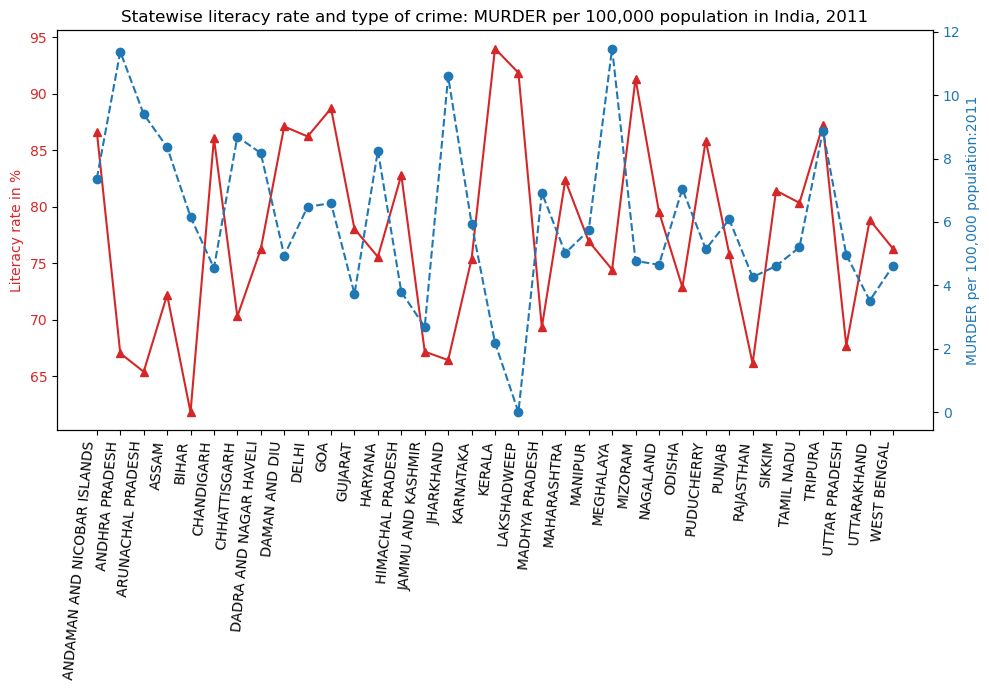

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


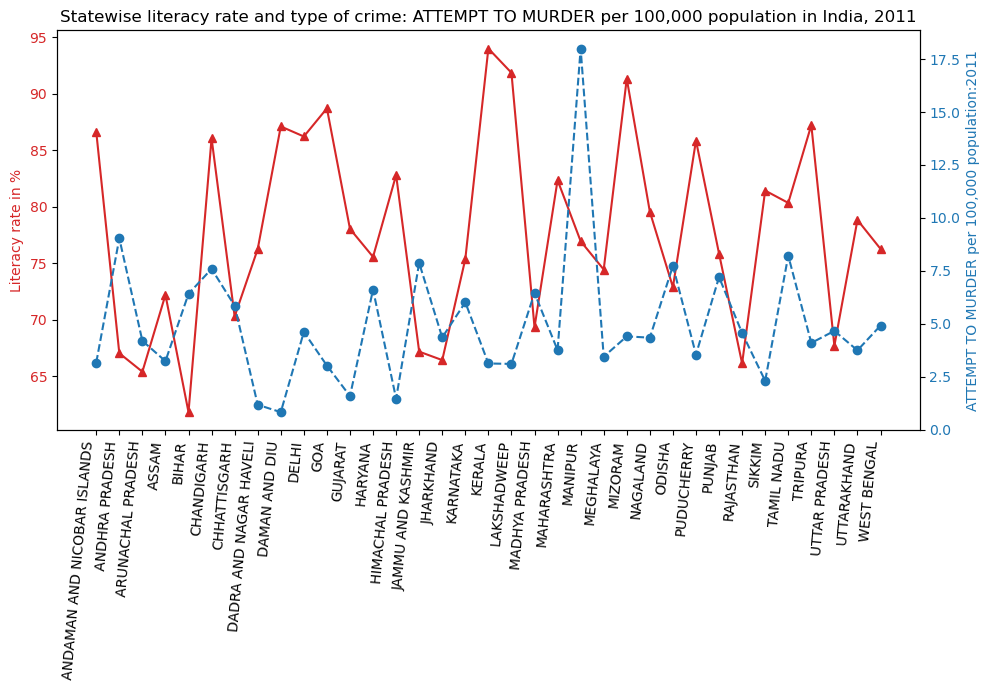

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


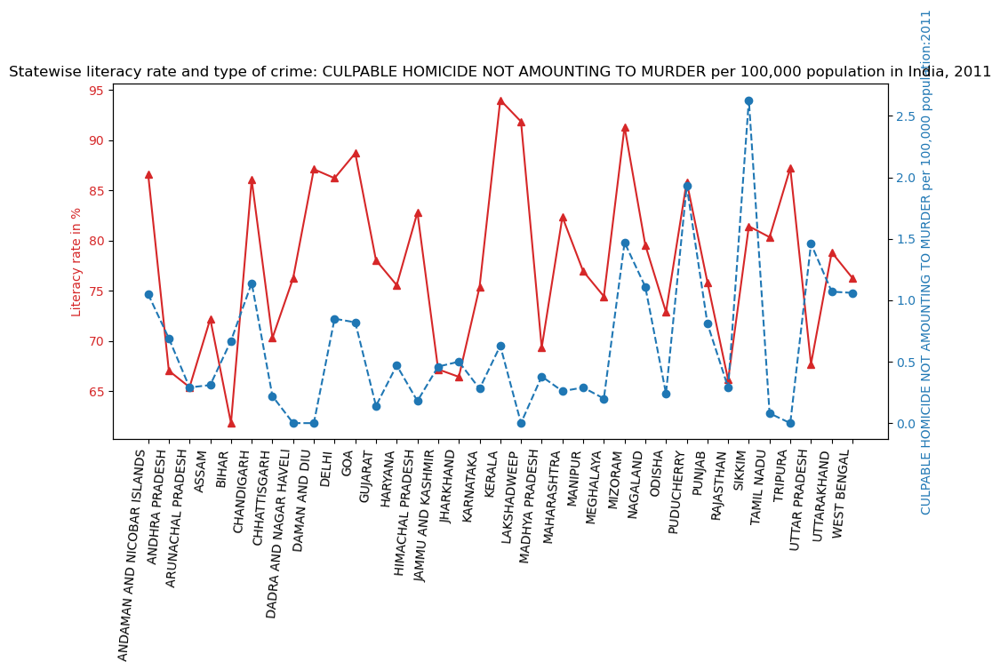

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


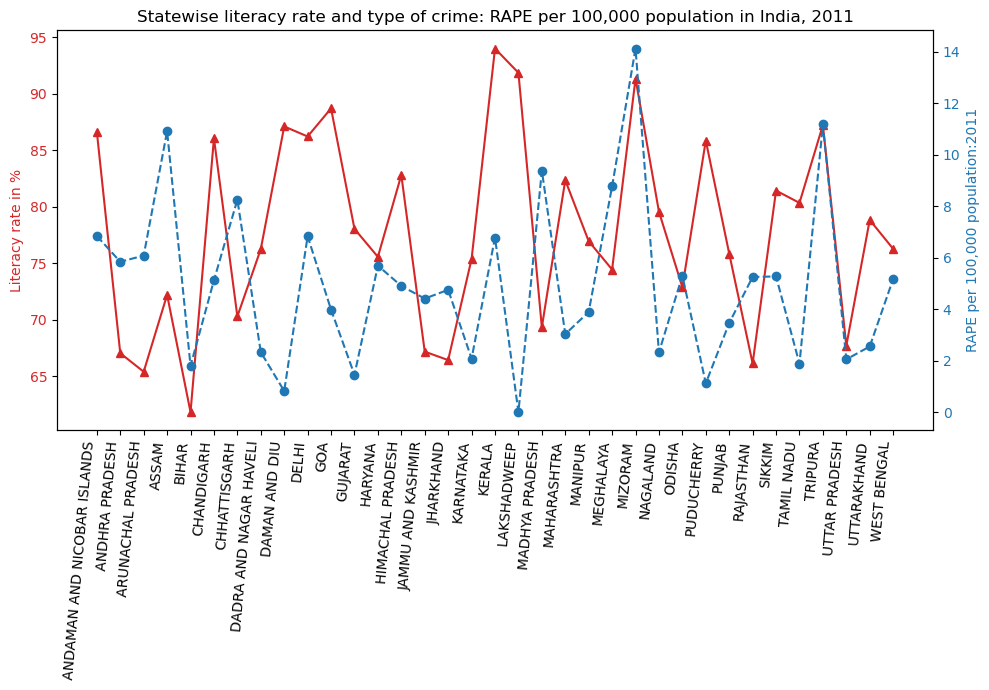

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


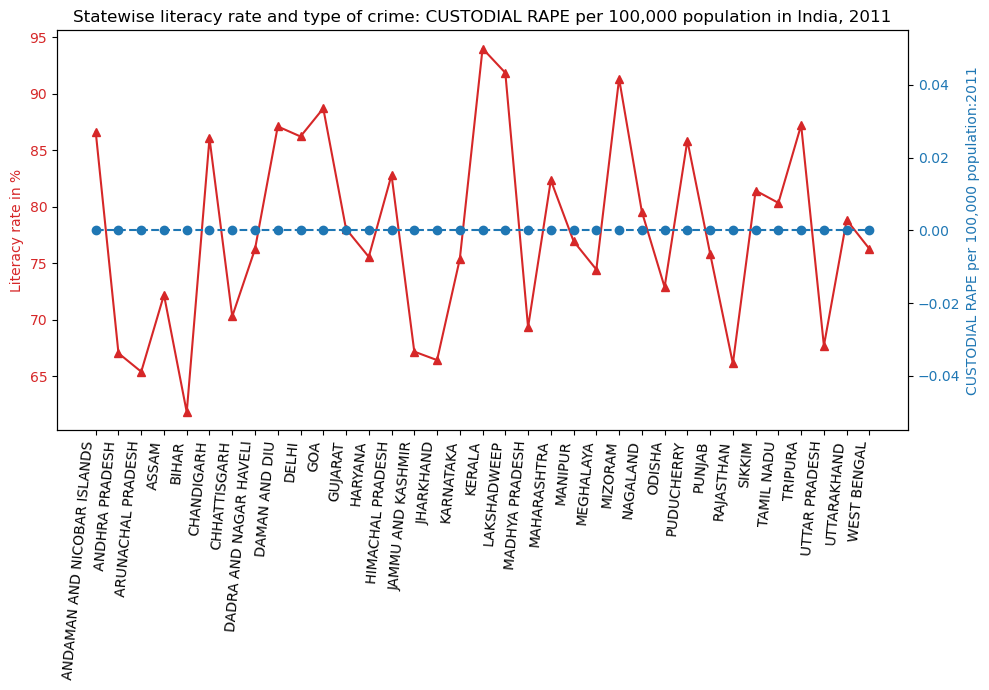

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


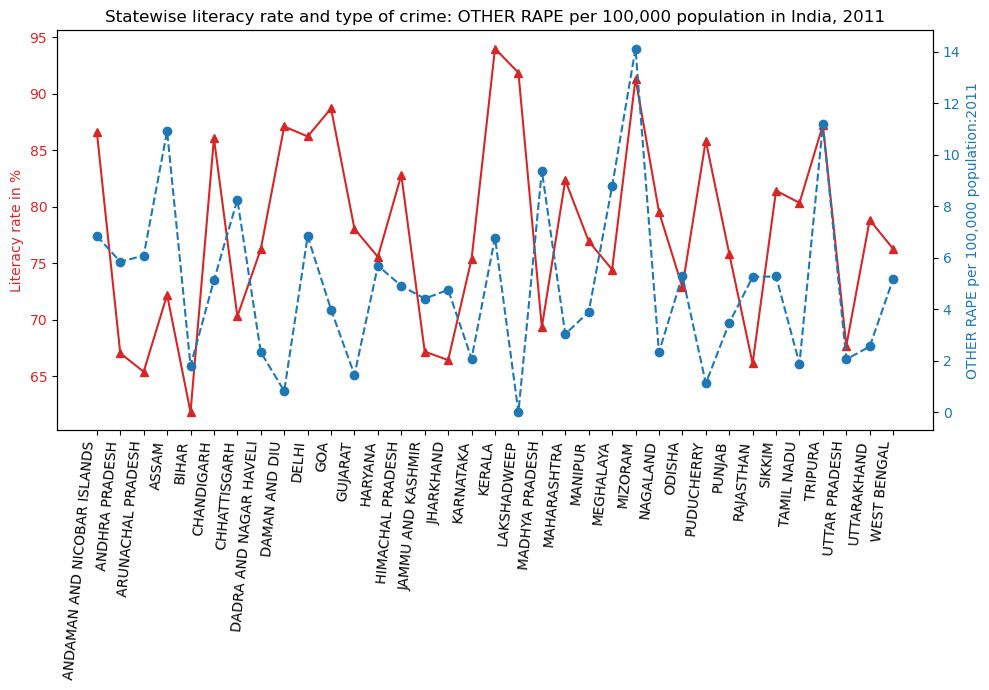

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


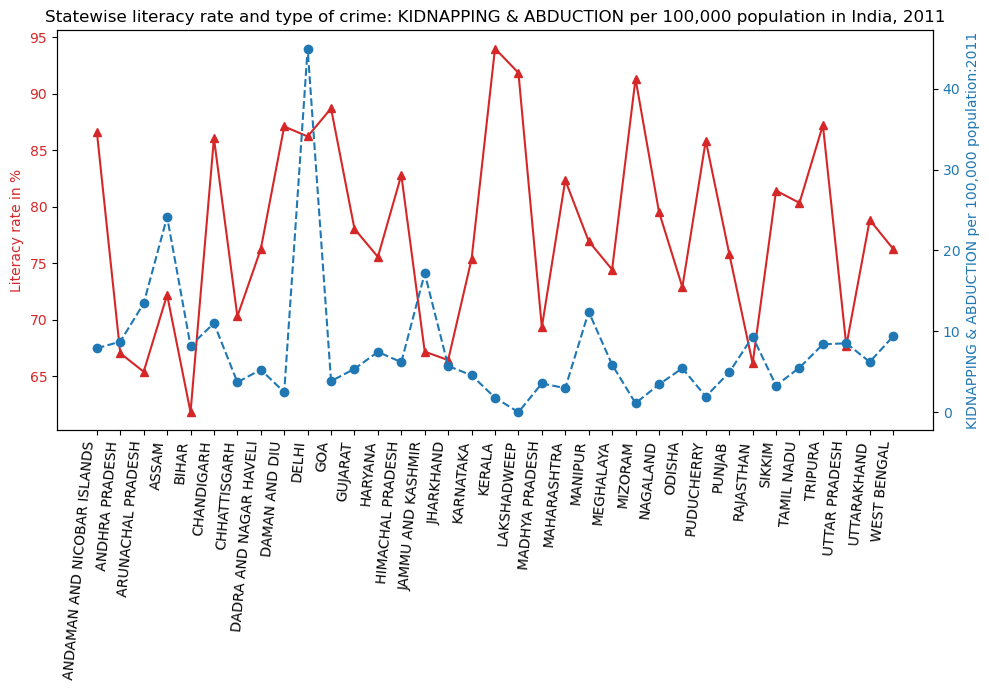

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


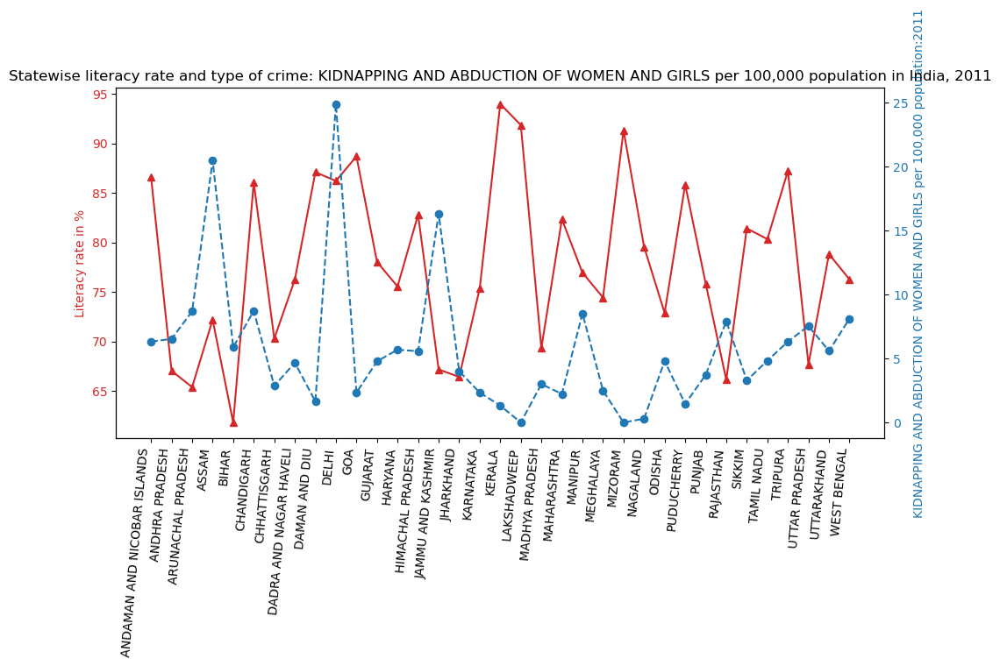

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


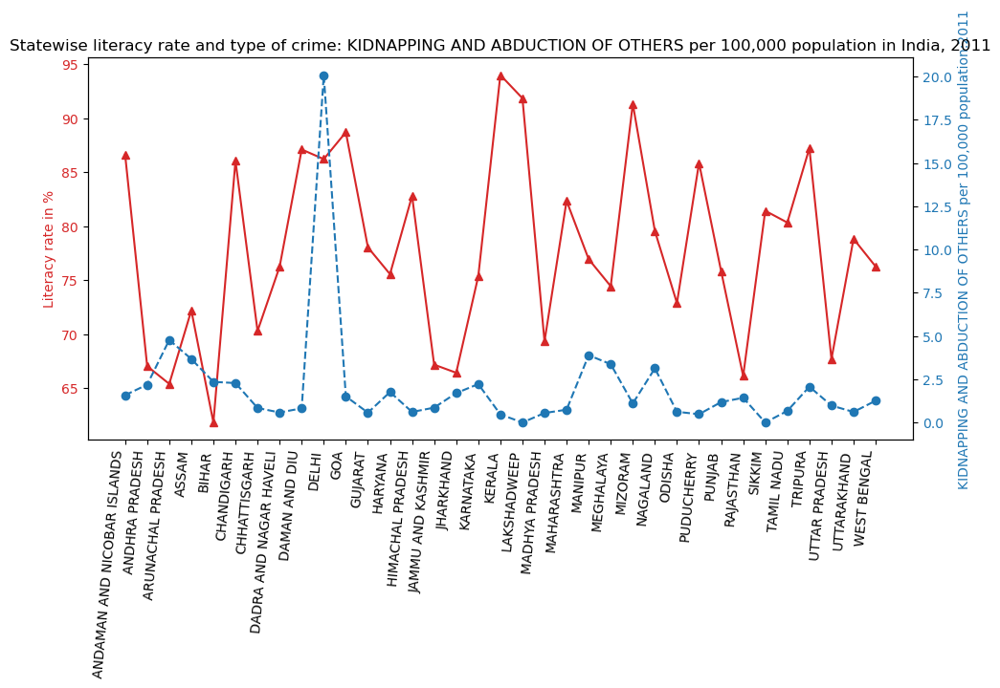

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


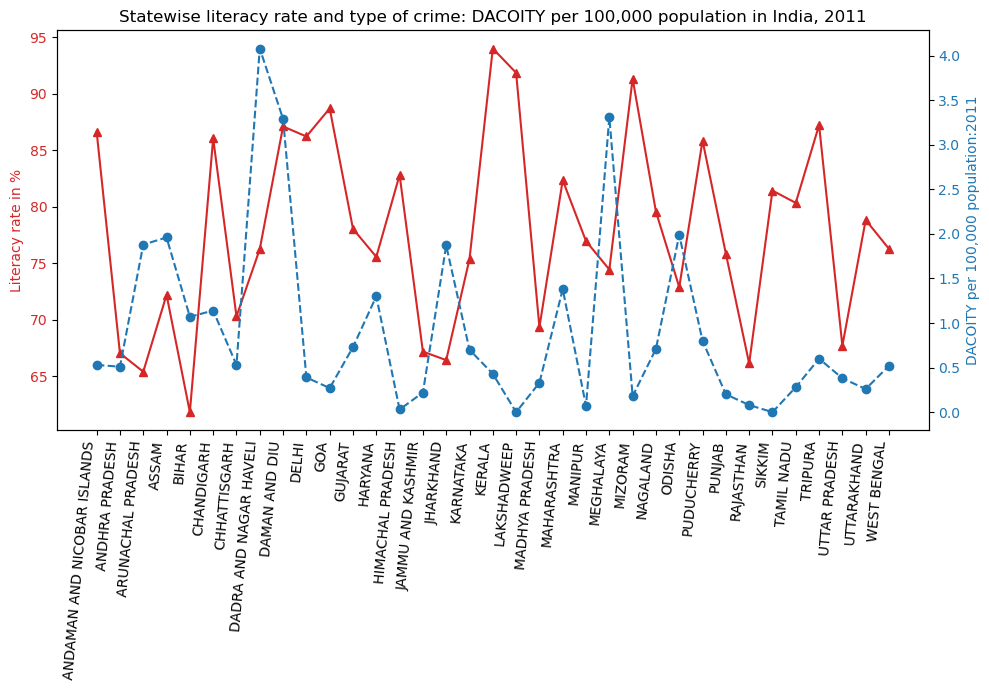

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


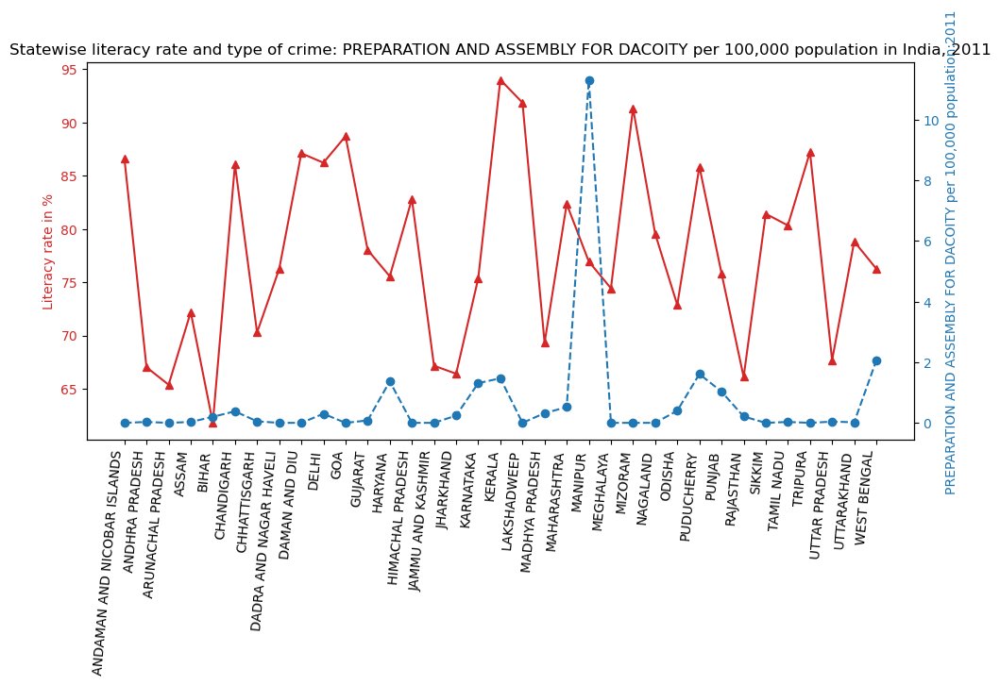

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


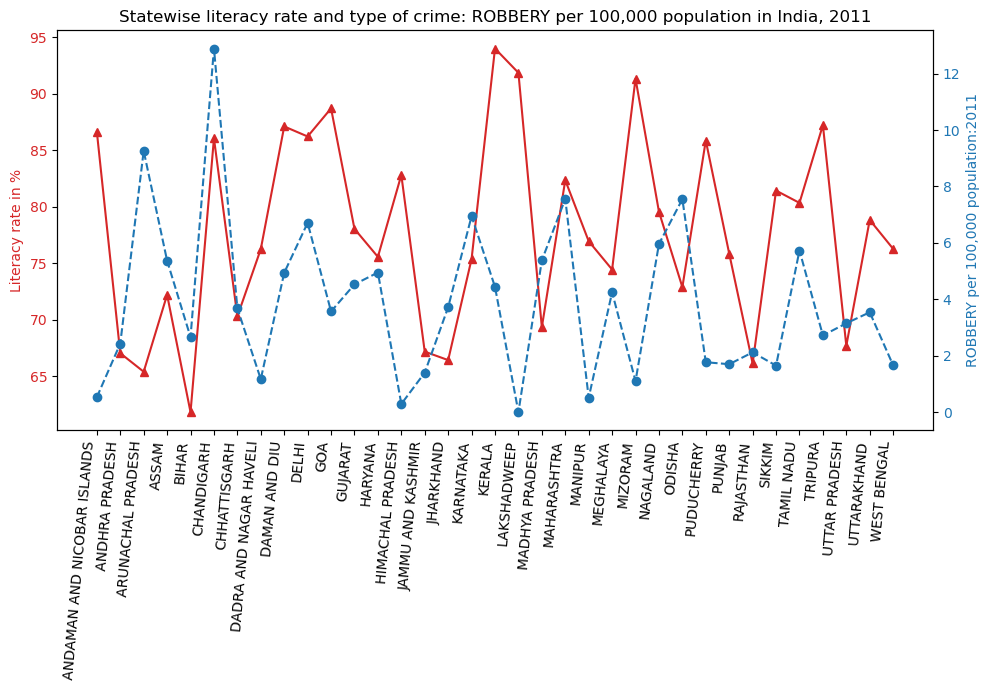

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


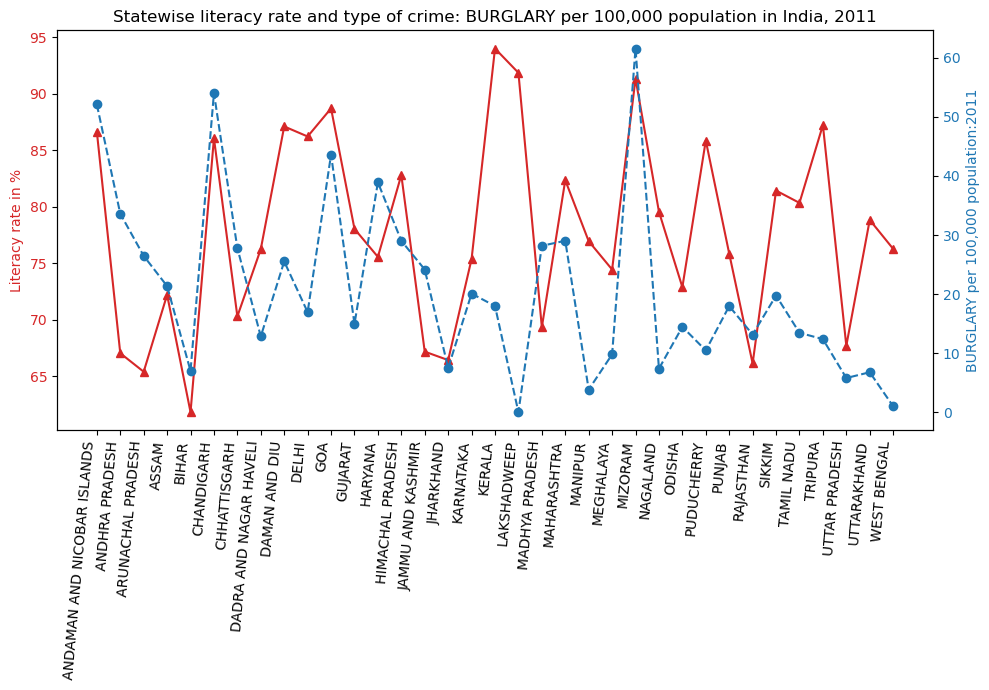

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


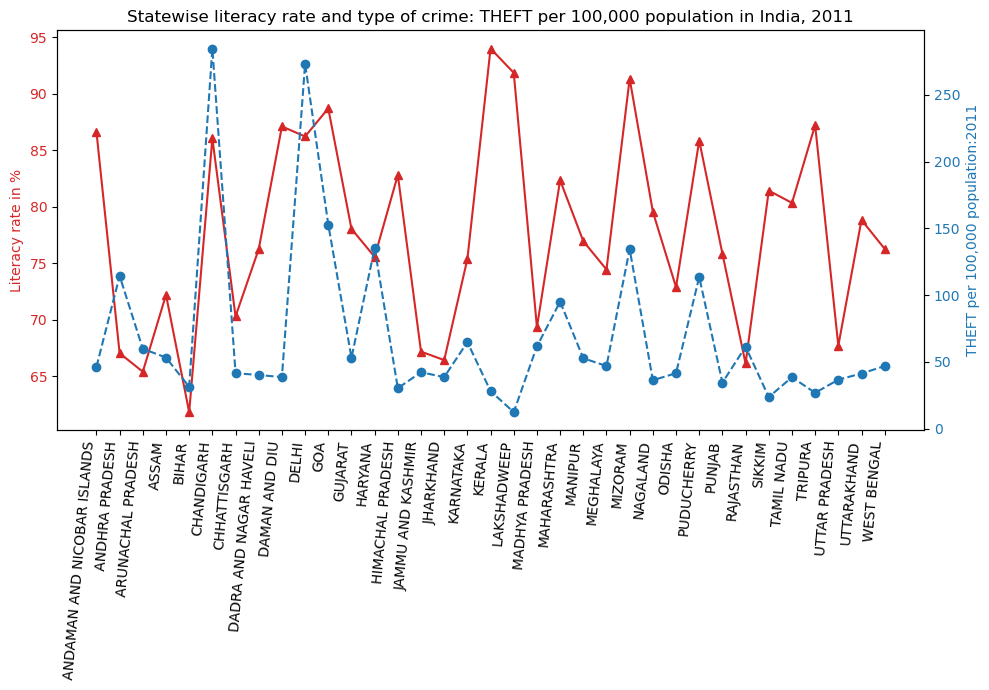

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


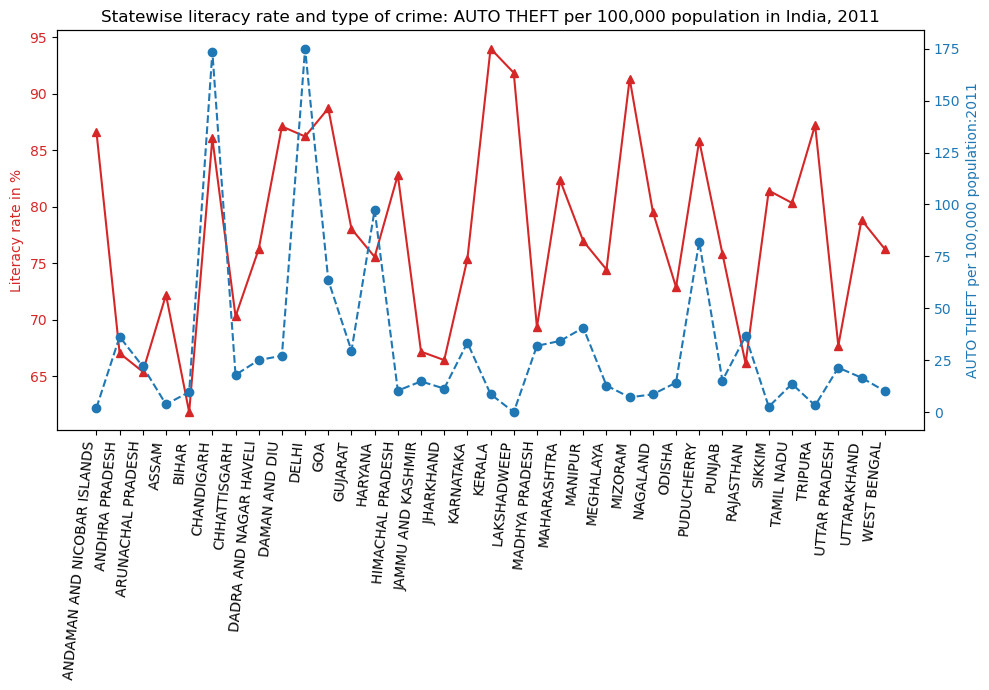

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


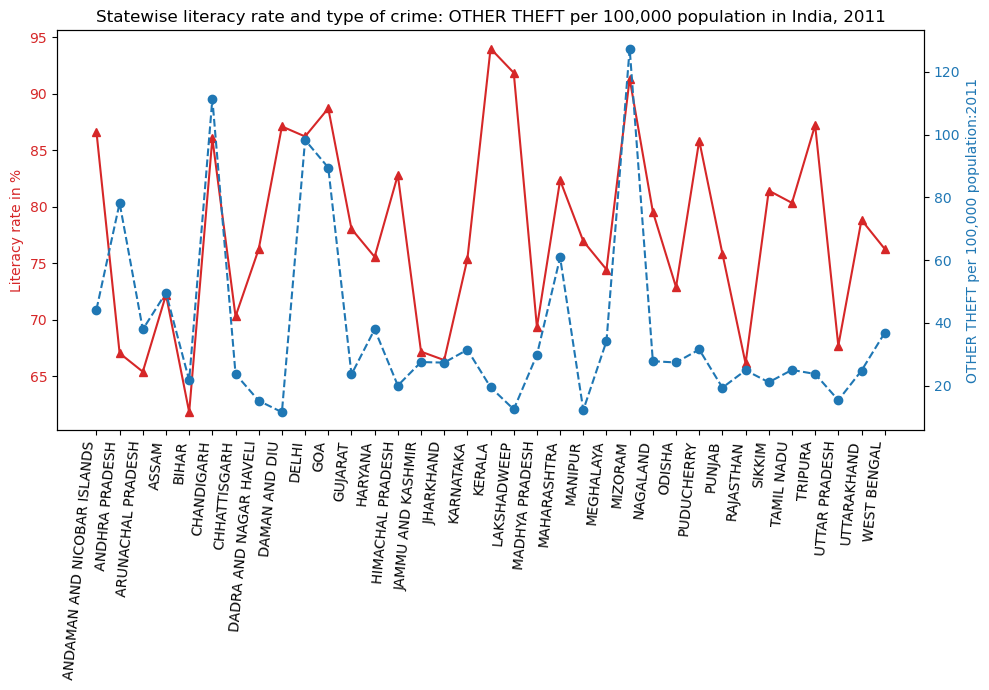

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


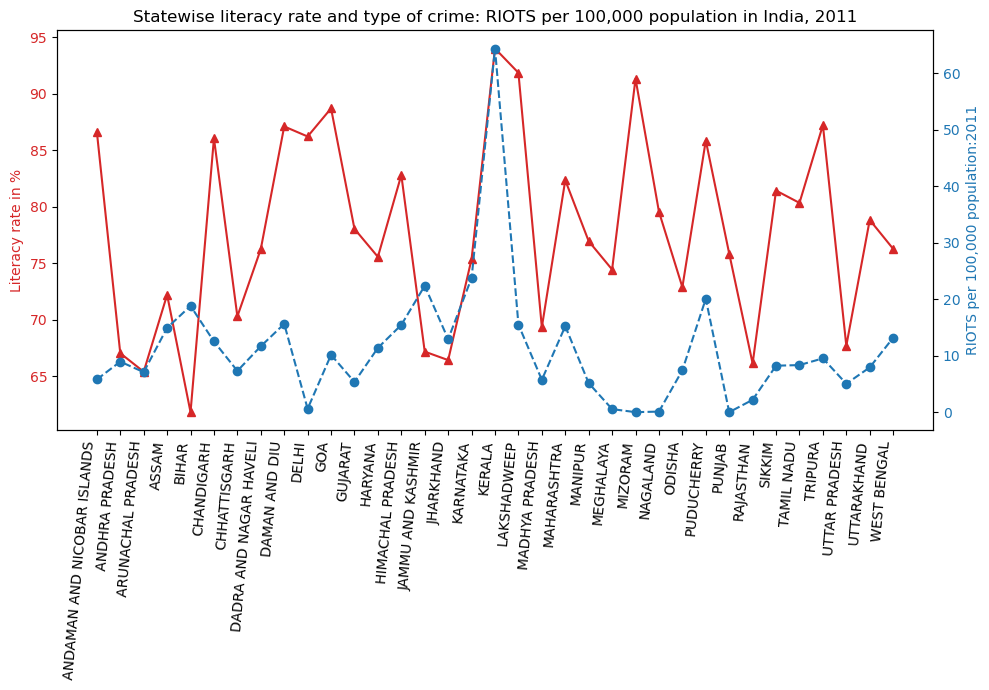

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


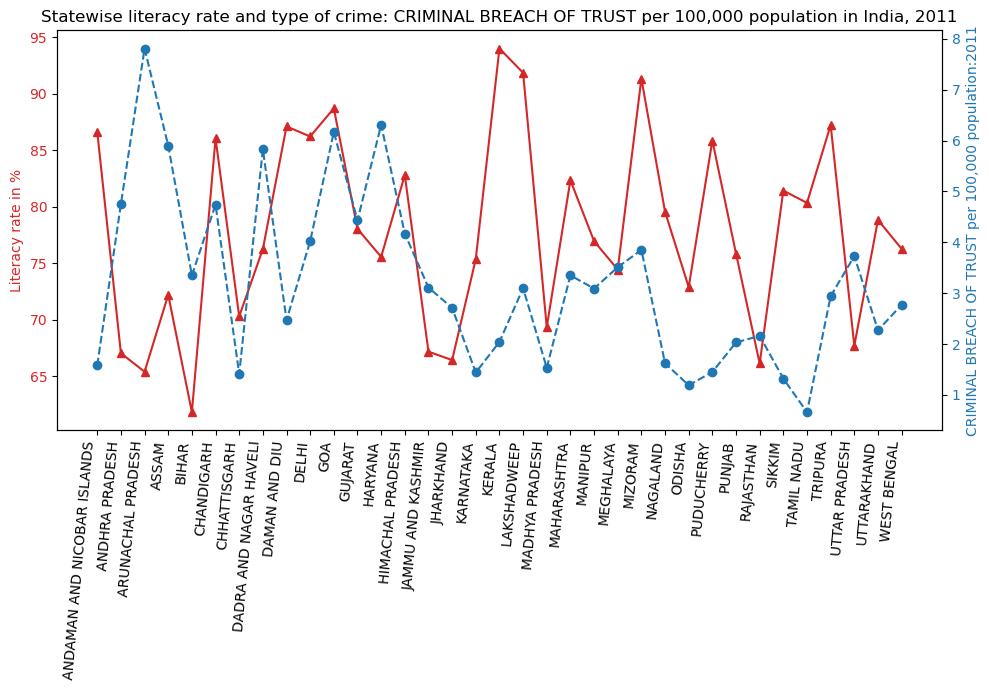

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


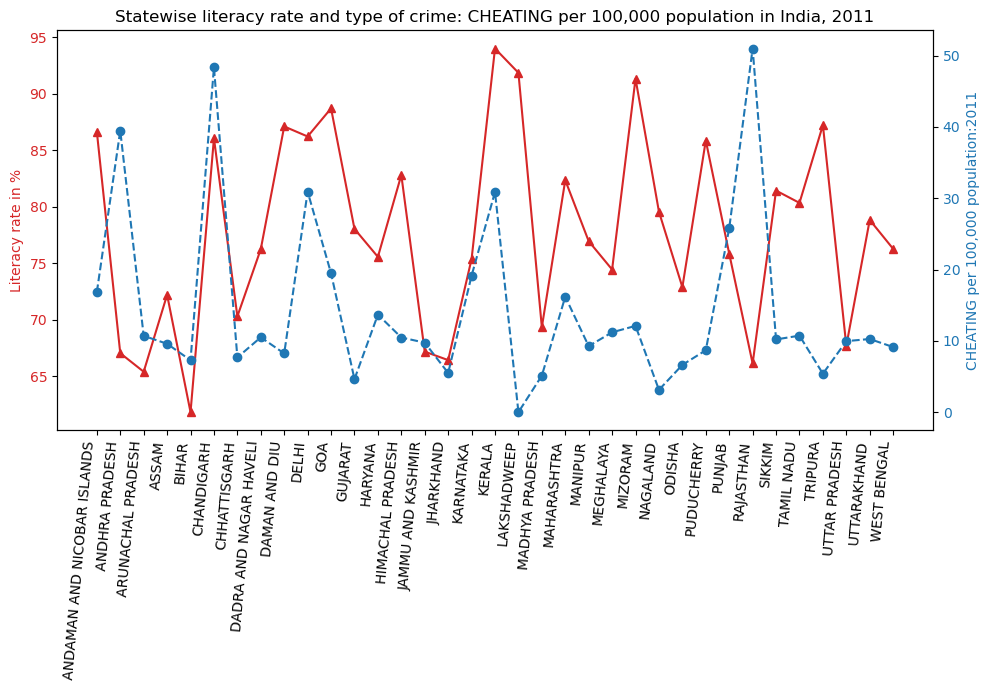

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


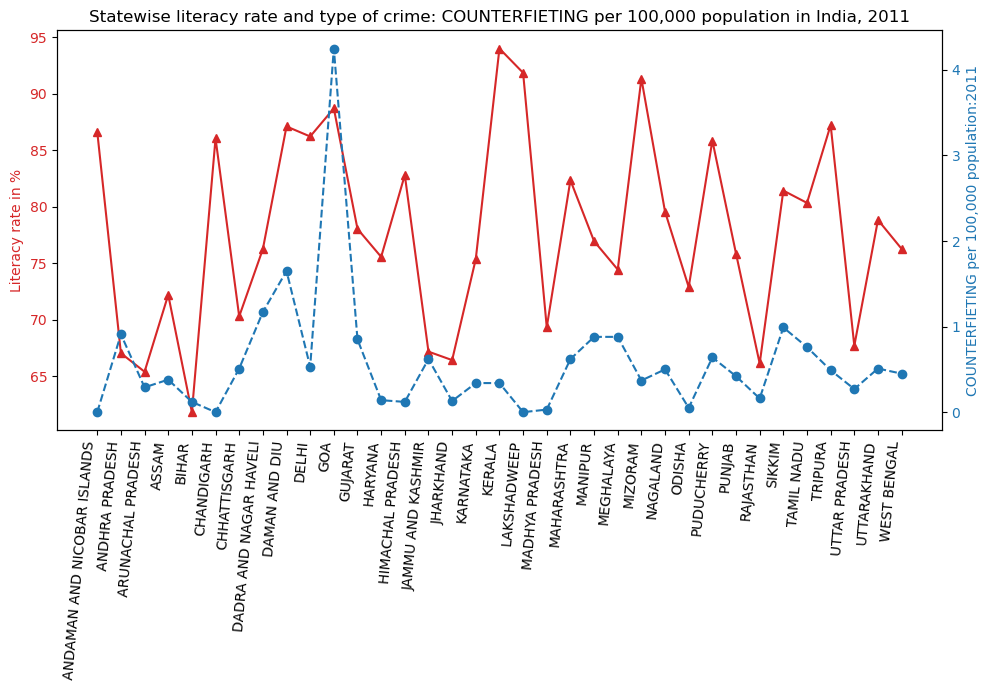

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


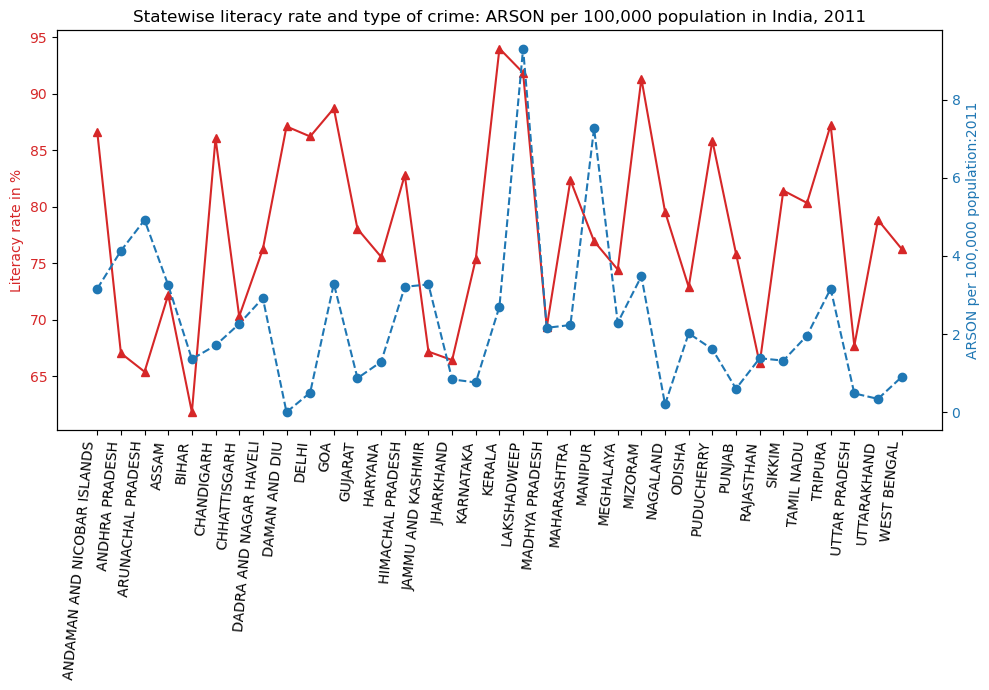

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


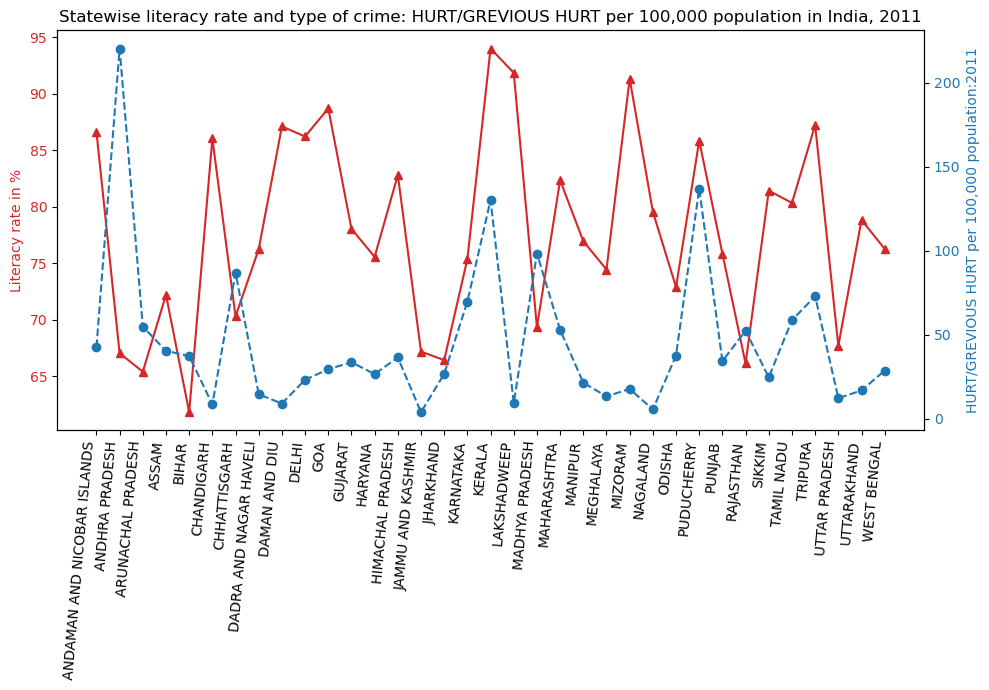

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


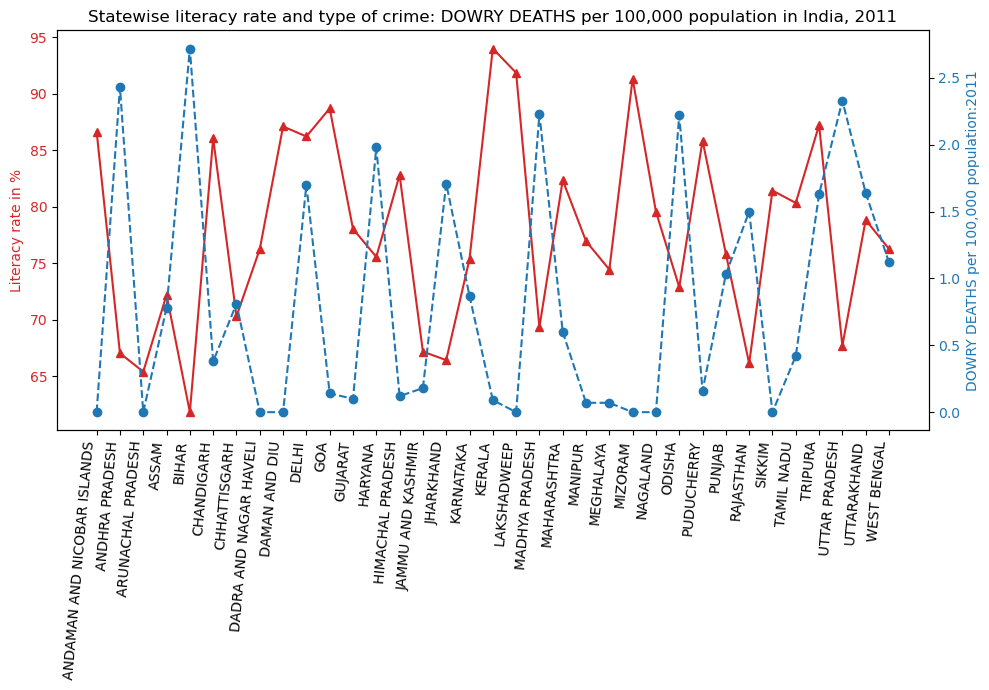

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


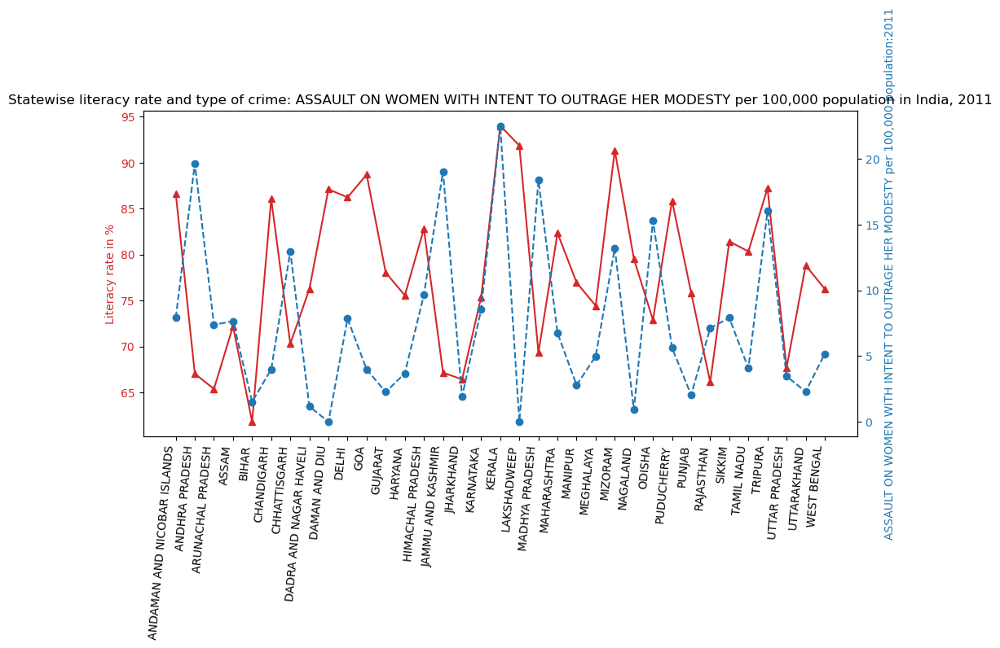

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


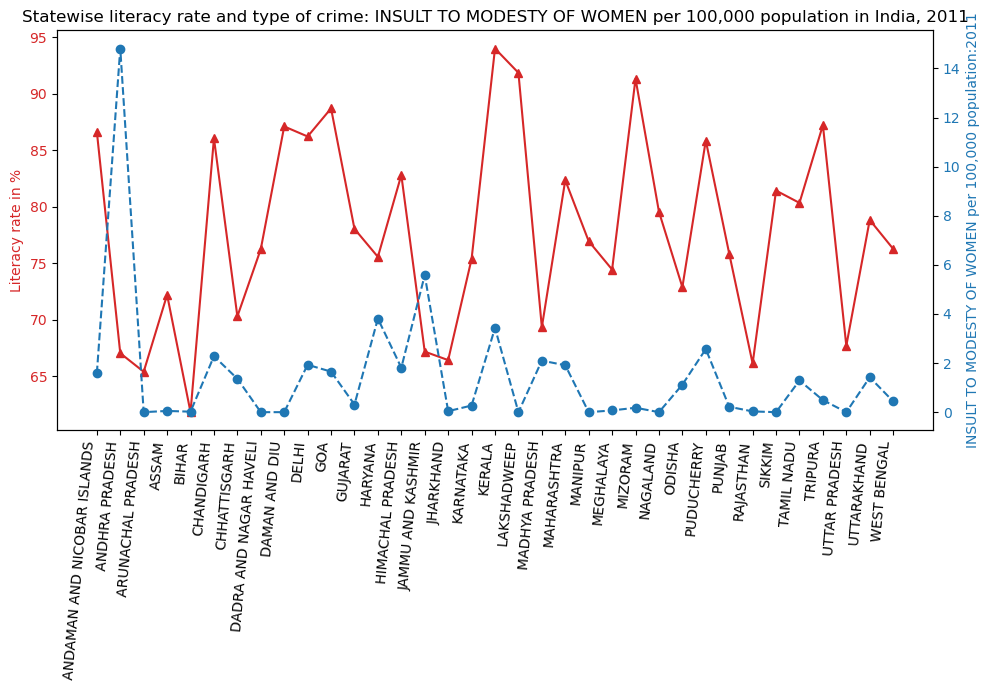

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


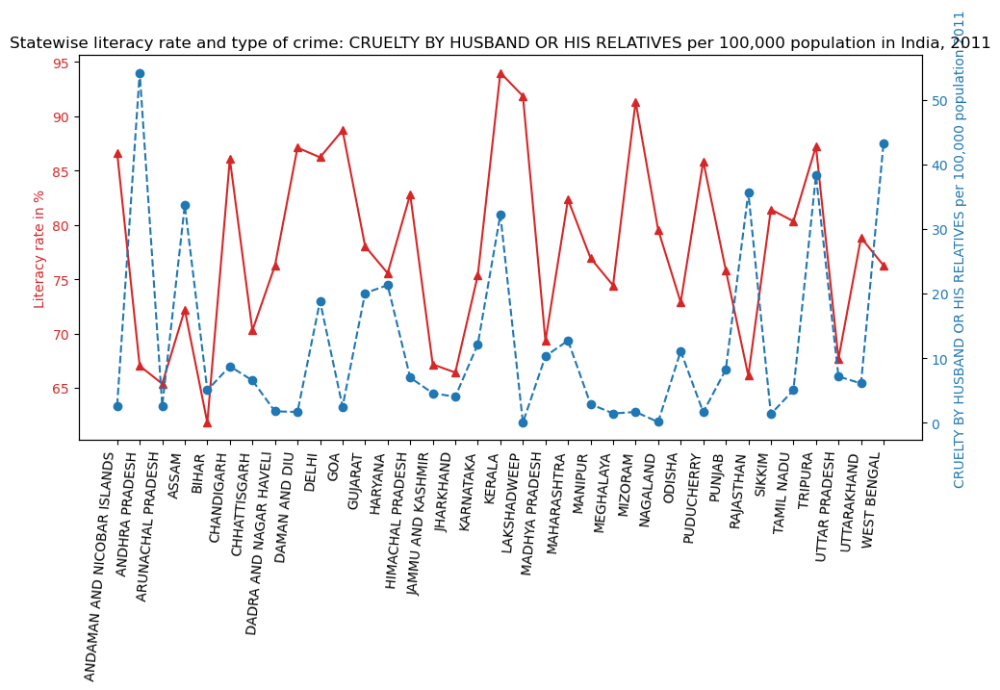

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


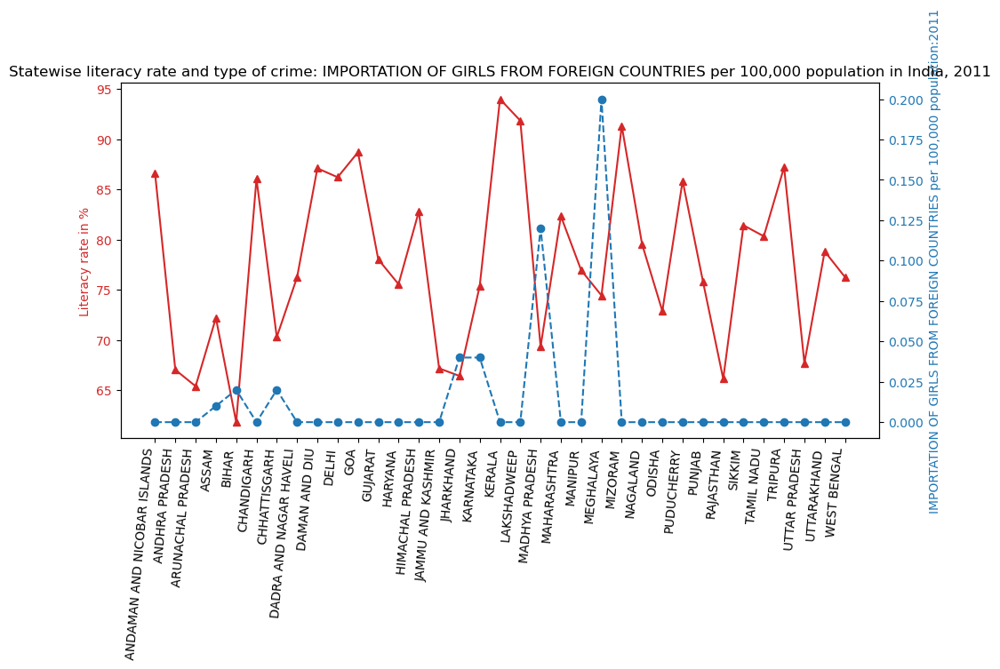

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


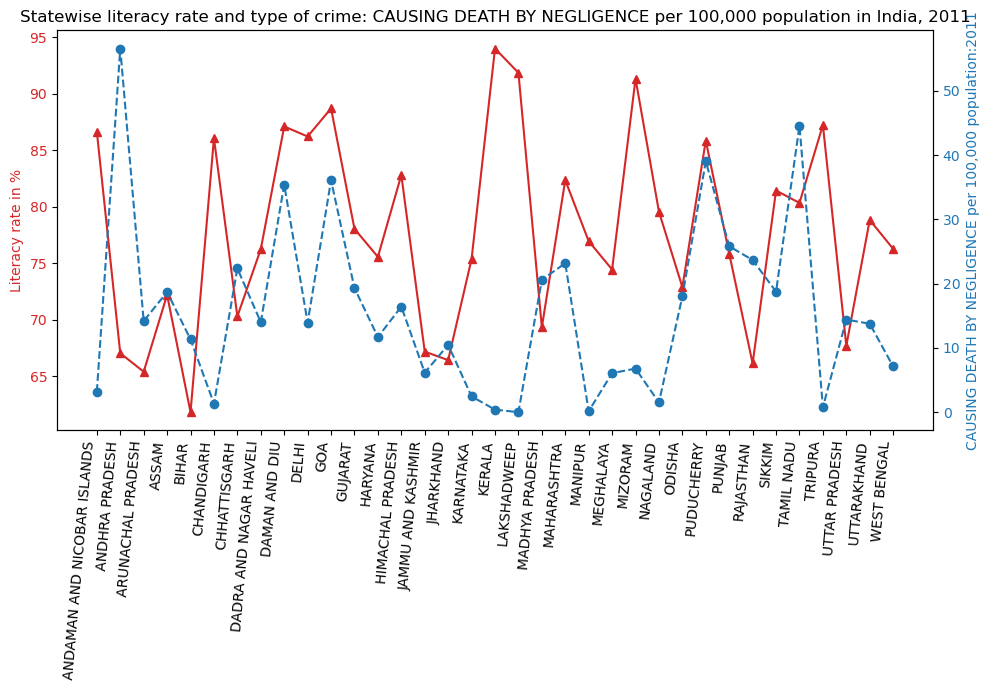

C:\Users\admin\AppData\Local\Temp\ipykernel_13388\4076775397.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(x, ha='right')


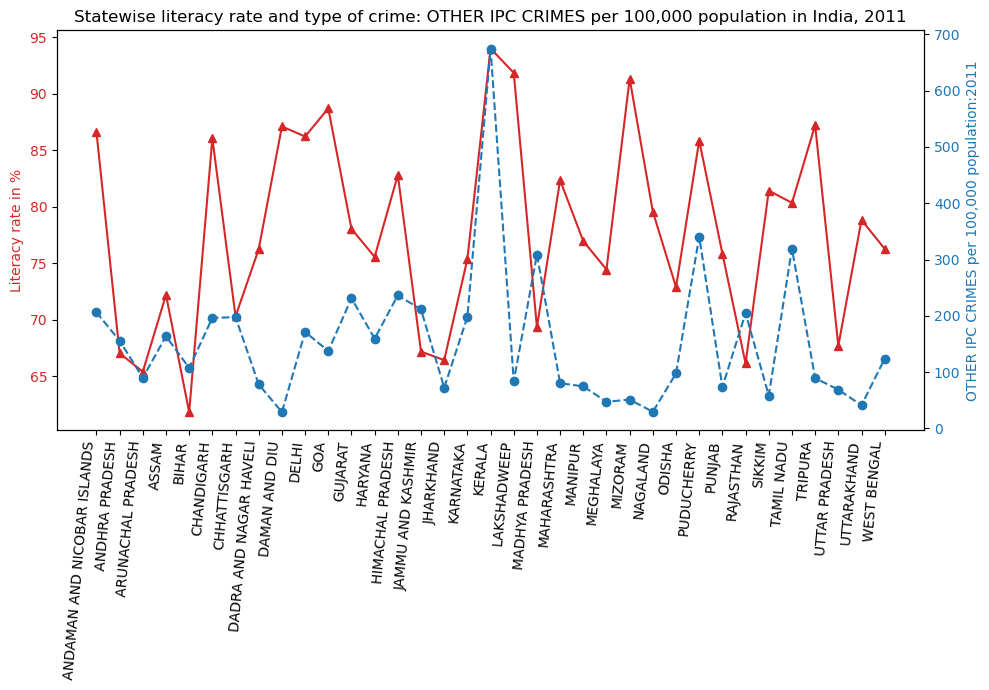

In [406]:
x = df_crime_rate_lit_2011['STATE/UT']
y1 = df_crime_rate_lit_2011['Literacy rate (%) [Census 2011]'].astype(float)
for l in df_crime_rate_lit_2011.columns[31:60]:
    y = df_crime_rate_lit_2011[l]
    fig=plt.figure(figsize=(10,7))
    color = 'tab:red'
    plt.plot(x,y1.astype(float),color=color,marker='^',)
    plt.gca().tick_params(axis='y', labelcolor=color)
    plt.gca().set_ylabel('Literacy rate in %',color=color)
    plt.xticks(rotation=85)
    plt.gca().set_xticklabels(x, ha='right')
    ax2 = plt.gca().twinx()
    color = 'tab:blue'
    plt.plot(x,y,color=color,marker='o',ls='--')
    plt.gca().set_ylabel(f'{l}:2011',color=color)
    plt.gca().tick_params(axis='y', labelcolor=color)
    plt.gca().set_title(f'Statewise literacy rate and type of crime: {l} in India, 2011')
    plt.tight_layout()
    plt.show()

## 2.3. Analysis of year-on-year total crime rate

In [407]:
df_crimes

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


In [408]:
df_year_crime=df_crimes[['STATE/UT','YEAR','TOTAL IPC CRIMES']]
df_year_crime

,STATE/UT,YEAR,TOTAL IPC CRIMES
0,ANDHRA PRADESH,2001,4154
1,ANDHRA PRADESH,2001,4125
2,ANDHRA PRADESH,2001,5818
3,ANDHRA PRADESH,2001,3140
4,ANDHRA PRADESH,2001,6507
...,...,...,...
9012,LAKSHADWEEP,2012,60
9013,LAKSHADWEEP,2012,60
9014,PUDUCHERRY,2012,787
9015,PUDUCHERRY,2012,3494


In [409]:
df_year_crime1=pd.DataFrame(df_year_crime.groupby('YEAR')['TOTAL IPC CRIMES'].sum())
df_year_crime1.reset_index()

,YEAR,TOTAL IPC CRIMES
0,2001,3538616
1,2002,3560660
2,2003,3432240
3,2004,3664020
4,2005,3645204
5,2006,3756586
6,2007,3979346
7,2008,4186758
8,2009,4242690
9,2010,4449662


In [410]:
df_pop_total=df_state_pop.drop(columns=['STATE/UT','Annualized population growth rate (%)'],inplace=False)
df_pop_total

,Population [Census 2001],Population [Census 2011],Estimated Population_2002,Estimated Population_2003,Estimated Population_2004,Estimated Population_2005,Estimated Population_2006,Estimated Population_2007,Estimated Population_2008,Estimated Population_2009,Estimated Population_2010,Estimated Population_2012
0,166053600,199581477,169135720,172275048,175472646,178729593,182046993,185425968,188867659,192373232,195943871,203285204
1,96752500,112372972,98211430,99692361,101195622,102721551,104270489,105842783,107438787,109058856,110703355,114067118
2,82879910,103804630,84766836,86696723,88670547,90689310,92754033,94865764,97025573,99234554,101493827,106167855
3,80221300,91347736,81270033,82332476,83408808,84499212,85603870,86722969,87856698,89005249,90168815,92541779
4,60385090,72597565,61507648,62651076,63815759,65002094,66210483,67441336,68695070,69972112,71272893,73947450
5,62111390,72138958,63047967,63998667,64963703,65943291,66937650,67947003,68971576,70011598,71067303,73226710
6,56473300,68621012,57584355,58717270,59872473,61050404,62251510,63476246,64725078,65998479,67296933,69970981
7,52734986,61130704,53519840,54316376,55124767,55945189,56777821,57622845,58480446,59350810,60234129,62040400
8,50597200,60383628,51499803,52418508,53353602,54305377,55274130,56260165,57263791,58285319,59325071,61460550
9,75728400,49386799,72559469,69523145,66613880,63826355,61155478,58596366,56144342,53794926,51543823,47320275


In [411]:
df_pop_columns_sum = df_pop_total.sum()
df_total=pd.DataFrame(df_pop_columns_sum).reset_index()
df_total.columns=['YEAR','POPULATION']
df_total['YEAR']=[2001, 2011, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2012]
df_total

,YEAR,POPULATION
0,2001,1027100050
1,2011,1210530555
2,2002,1040033390
3,2003,1053385992
4,2004,1067157570
5,2005,1081348183
6,2006,1095958233
7,2007,1110988421
8,2008,1126439771
9,2009,1142313606


In [412]:
df_crime_pop=pd.merge(df_year_crime1.reset_index(),df_total.reset_index(),on='YEAR')
df_crime_pop.drop(columns='index',inplace=True)
df_crime_pop

,YEAR,TOTAL IPC CRIMES,POPULATION
0,2001,3538616,1027100050
1,2002,3560660,1040033390
2,2003,3432240,1053385992
3,2004,3664020,1067157570
4,2005,3645204,1081348183
5,2006,3756586,1095958233
6,2007,3979346,1110988421
7,2008,4186758,1126439771
8,2009,4242690,1142313606
9,2010,4449662,1158611548


In [413]:
crime_rate_year = (df_crime_pop['TOTAL IPC CRIMES'].div(df_crime_pop['POPULATION']))*100000
df_crime_pop['CRIME RATE (total crimes per 100,000 population)']=round(crime_rate_year,2)
df_crime_pop

,YEAR,TOTAL IPC CRIMES,POPULATION,"CRIME RATE (total crimes per 100,000 population)"
0,2001,3538616,1027100050,344.52
1,2002,3560660,1040033390,342.36
2,2003,3432240,1053385992,325.83
3,2004,3664020,1067157570,343.34
4,2005,3645204,1081348183,337.10
5,2006,3756586,1095958233,342.77
6,2007,3979346,1110988421,358.18
7,2008,4186758,1126439771,371.68
8,2009,4242690,1142313606,371.41
9,2010,4449662,1158611548,384.05


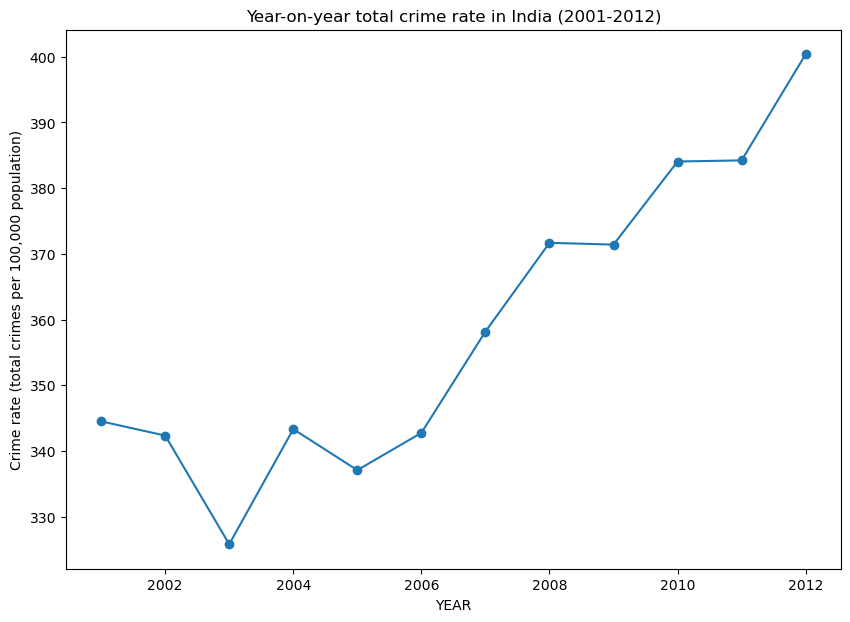

In [414]:
plt.figure(figsize=(10,7))
x_year=df_crime_pop['YEAR']
y_year=df_crime_pop['CRIME RATE (total crimes per 100,000 population)']
plt.plot(x_year,y_year,marker='o')
plt.xlabel('YEAR')
plt.ylabel('Crime rate (total crimes per 100,000 population)')
plt.title('Year-on-year total crime rate in India (2001-2012)')
plt.show()

## 2.4.  Analysis of area vs overall crime.

In [415]:
df_crimes

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


In [416]:
df_place=pd.read_csv('17_Crime_by_place_of_occurrence_2001_2012.csv')
df_place.drop(index=[454,455],inplace=True)
df_place.drop(columns=['STATE/UT','YEAR'],inplace=True)
df_place.sum()
df_place1=pd.DataFrame(df_place.sum())
df_place2=df_place1.T
df_place2

,RESIDENTIAL PREMISES - Dacoity,RESIDENTIAL PREMISES - Robbery,RESIDENTIAL PREMISES - Burglary,RESIDENTIAL PREMISES - Theft,HIGHWAYS - Dacoity,HIGHWAYS - Robbery,HIGHWAYS - Burglary,HIGHWAYS - Theft,RIVER and SEA - Dacoity,RIVER and SEA - Robbery,...,COMMERCIAL ESTABLISHMENTS - Burglary,COMMERCIAL ESTABLISHMENTS - Theft,OTHER PLACES - Dacoity,OTHER PLACES - Robbery,OTHER PLACES - Burglary,OTHER PLACES - Theft,TOTAL - Dacoity,TOTAL - Robbery,TOTAL - Burglary,TOTAL - Theft
0,68128,108560,2078408,2592093,28894,146771,9884,428313,203,504,...,475369,921789,55064,386136,583865,5397210,169296,696664,3165163,9843976


In [417]:
dacoity = {}
area_crime=['RESIDENTIAL PREMISES','HIGHWAYS','RIVER and SEA','RAILWAYS','BANKS','COMMERCIAL ESTABLISHMENTS','OTHER PLACES','TOTAL']
for i in range(len(df_place2.columns)):
    if "Dacoity" in df_place2.columns[i]:
        jj = (df_place2.iloc[:, i] / df_place2['TOTAL - Dacoity'])*100
        dacoity[df_place2.columns[i]] = round(jj,2)

df_dacoity = pd.DataFrame(dacoity)

df_dacoity1=df_dacoity.T
df_dacoity2=df_dacoity1.reset_index()
df_dacoity2.drop(7, inplace=True)
df_dacoity2['index']=['RESIDENTIAL PREMISES', 'HIGHWAYS', 'RIVER and SEA', 'RAILWAYS', 'BANKS', 'COMMERCIAL ESTABLISHMENTS', 'OTHER PLACES']
df_dacoity2

,index,0
0,RESIDENTIAL PREMISES,40.24
1,HIGHWAYS,17.07
2,RIVER and SEA,0.12
3,RAILWAYS,2.49
4,BANKS,1.15
5,COMMERCIAL ESTABLISHMENTS,6.41
6,OTHER PLACES,32.53


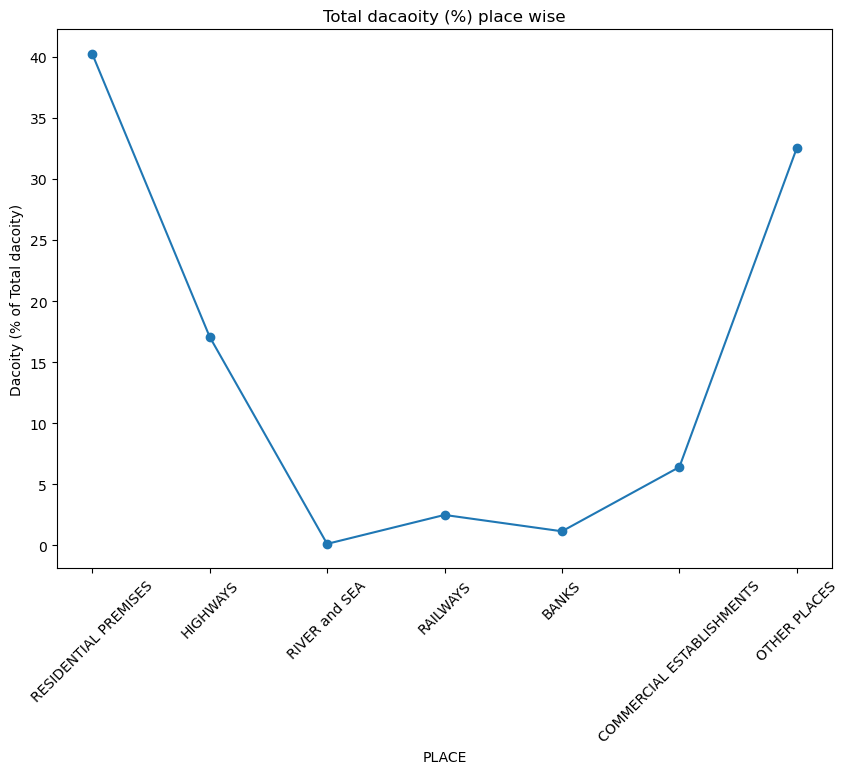

In [418]:
plt.figure(figsize=(10,7))
x_dacoity=df_dacoity2['index']
y_dacoity=df_dacoity2[0]
plt.plot(x_dacoity,y_dacoity,marker='o')
plt.xlabel('PLACE')

plt.ylabel('Dacoity (% of Total dacoity)')
plt.title('Total dacaoity (%) place wise')
plt.xticks(rotation=45)
plt.show()

In [419]:
Robbery = {}
area_crime=['RESIDENTIAL PREMISES','HIGHWAYS','RIVER and SEA','RAILWAYS','BANKS','COMMERCIAL ESTABLISHMENTS','OTHER PLACES','TOTAL']
for i in range(len(df_place2.columns)):
    if "Robbery" in df_place2.columns[i]:
        jj = (df_place2.iloc[:, i] / df_place2['TOTAL - Robbery'])*100
        Robbery[df_place2.columns[i]] = round(jj,2)

df_Robbery = pd.DataFrame(Robbery)

df_Robbery1=df_Robbery.T
df_Robbery2=df_Robbery1.reset_index()
df_Robbery2.drop(7, inplace=True)
df_Robbery2['index']=['RESIDENTIAL PREMISES', 'HIGHWAYS', 'RIVER and SEA', 'RAILWAYS', 'BANKS', 'COMMERCIAL ESTABLISHMENTS', 'OTHER PLACES']
df_Robbery2

,index,0
0,RESIDENTIAL PREMISES,15.58
1,HIGHWAYS,21.07
2,RIVER and SEA,0.07
3,RAILWAYS,2.29
4,BANKS,0.49
5,COMMERCIAL ESTABLISHMENTS,5.07
6,OTHER PLACES,55.43


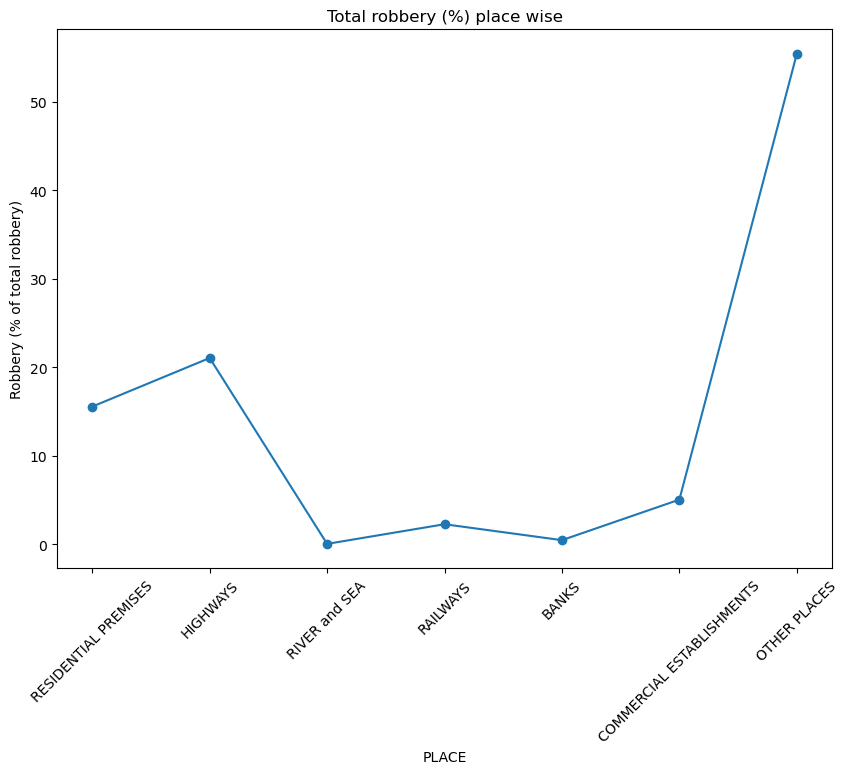

In [420]:
plt.figure(figsize=(10,7))
x_robbery=df_Robbery2['index']
y_robbery=df_Robbery2[0]
plt.plot(x_robbery,y_robbery,marker='o')
plt.xlabel('PLACE')

plt.ylabel('Robbery (% of total robbery)')
plt.title('Total robbery (%) place wise')
plt.xticks(rotation=45)
plt.show()

In [421]:
Burglary = {}
area_crime=['RESIDENTIAL PREMISES','HIGHWAYS','RIVER and SEA','RAILWAYS','BANKS','COMMERCIAL ESTABLISHMENTS','OTHER PLACES','TOTAL']
for i in range(len(df_place2.columns)):
    if "Burglary" in df_place2.columns[i]:
        jj = (df_place2.iloc[:, i] / df_place2['TOTAL - Burglary'])*100
        Burglary[df_place2.columns[i]] = round(jj,2)

df_Burglary = pd.DataFrame(Burglary)

df_Burglary1=df_Burglary.T
df_Burglary2=df_Burglary1.reset_index()
df_Burglary2.drop(7, inplace=True)
df_Burglary2['index']=['RESIDENTIAL PREMISES', 'HIGHWAYS', 'RIVER and SEA', 'RAILWAYS', 'BANKS', 'COMMERCIAL ESTABLISHMENTS', 'OTHER PLACES']
df_Burglary2

,index,0
0,RESIDENTIAL PREMISES,65.67
1,HIGHWAYS,0.31
2,RIVER and SEA,0.02
3,RAILWAYS,0.12
4,BANKS,0.42
5,COMMERCIAL ESTABLISHMENTS,15.02
6,OTHER PLACES,18.45


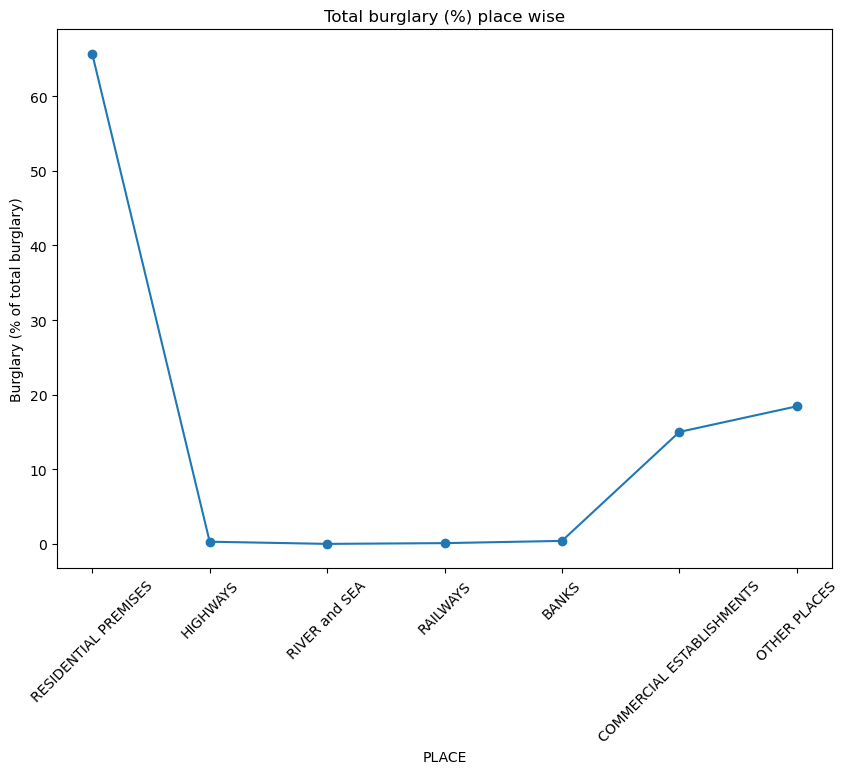

In [422]:
plt.figure(figsize=(10,7))
x_burglary=df_Burglary2['index']
y_burglary=df_Burglary2[0]
plt.plot(x_burglary,y_burglary,marker='o')
plt.xlabel('PLACE')

plt.ylabel('Burglary (% of total burglary)')
plt.title('Total burglary (%) place wise')
plt.xticks(rotation=45)
plt.show()

In [423]:
Theft = {}
area_crime=['RESIDENTIAL PREMISES','HIGHWAYS','RIVER and SEA','RAILWAYS','BANKS','COMMERCIAL ESTABLISHMENTS','OTHER PLACES','TOTAL']
for i in range(len(df_place2.columns)):
    if "Theft" in df_place2.columns[i]:
        jj = (df_place2.iloc[:, i] / df_place2['TOTAL - Theft'])*100
        Theft[df_place2.columns[i]] = round(jj,2)

df_Theft = pd.DataFrame(Theft)

df_Theft1=df_Theft.T
df_Theft2=df_Theft1.reset_index()
df_Theft2.drop(7, inplace=True)
df_Theft2['index']=['RESIDENTIAL PREMISES', 'HIGHWAYS', 'RIVER and SEA', 'RAILWAYS', 'BANKS', 'COMMERCIAL ESTABLISHMENTS', 'OTHER PLACES']
df_Theft2

,index,0
0,RESIDENTIAL PREMISES,26.33
1,HIGHWAYS,4.35
2,RIVER and SEA,0.07
3,RAILWAYS,4.91
4,BANKS,0.15
5,COMMERCIAL ESTABLISHMENTS,9.36
6,OTHER PLACES,54.83


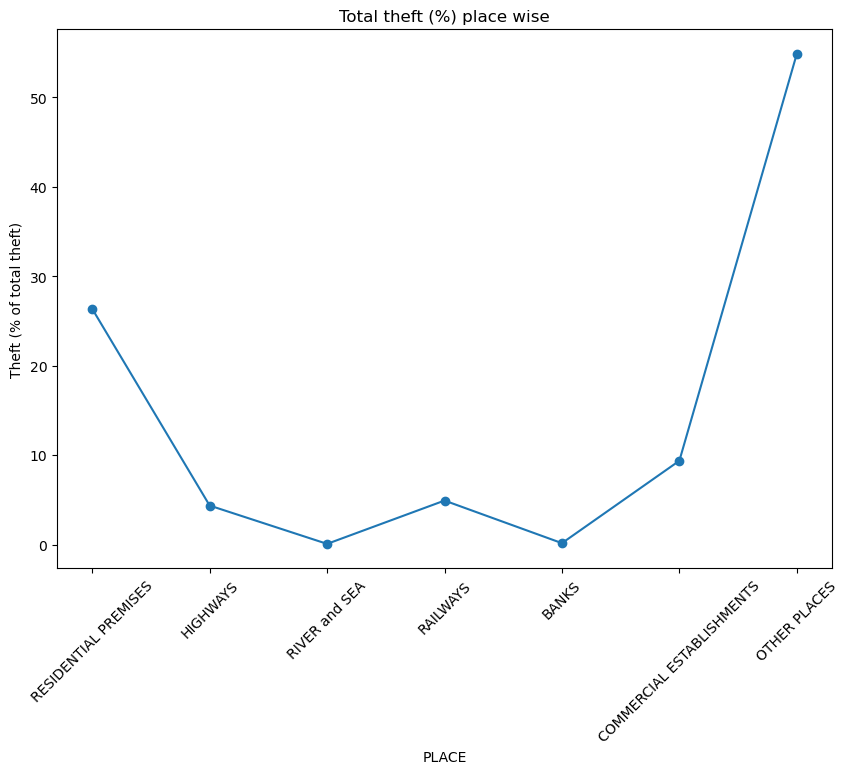

In [424]:
plt.figure(figsize=(10,7))
x_theft=df_Theft2['index']
y_theft=df_Theft2[0]
plt.plot(x_theft,y_theft,marker='o')
plt.xlabel('PLACE')

plt.ylabel('Theft (% of total theft)')
plt.title('Total theft (%) place wise')
plt.xticks(rotation=45)
plt.show()

## 2.5.	Analysis of Population vs overall Crime.

In [425]:
df_crime_pop

,YEAR,TOTAL IPC CRIMES,POPULATION,"CRIME RATE (total crimes per 100,000 population)"
0,2001,3538616,1027100050,344.52
1,2002,3560660,1040033390,342.36
2,2003,3432240,1053385992,325.83
3,2004,3664020,1067157570,343.34
4,2005,3645204,1081348183,337.10
5,2006,3756586,1095958233,342.77
6,2007,3979346,1110988421,358.18
7,2008,4186758,1126439771,371.68
8,2009,4242690,1142313606,371.41
9,2010,4449662,1158611548,384.05


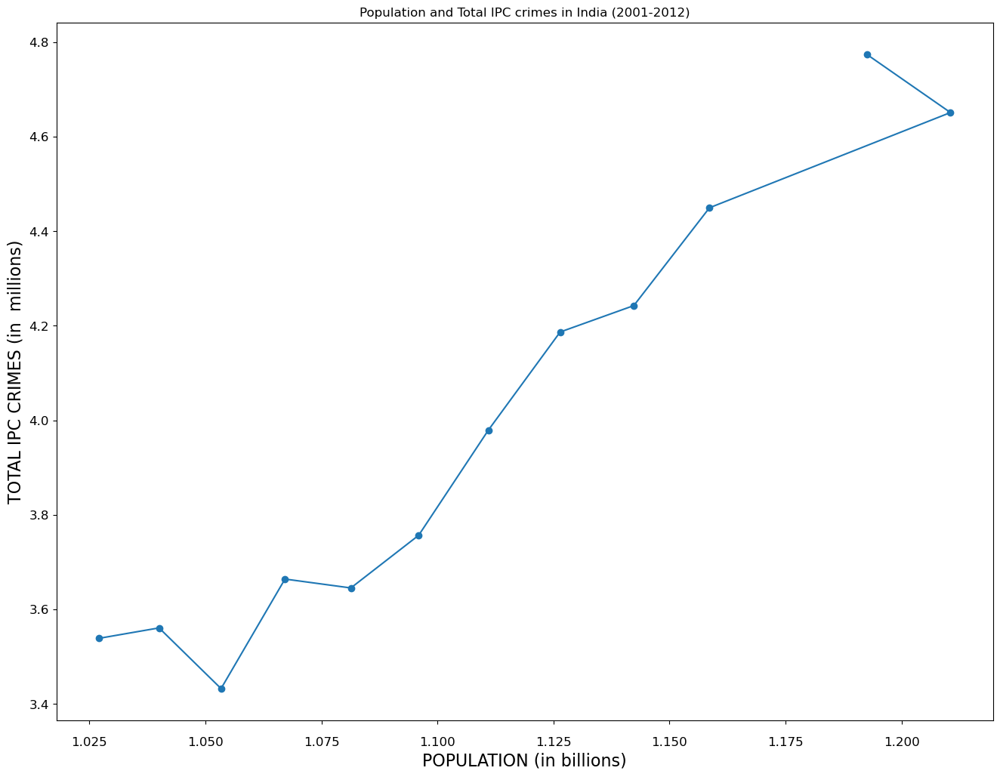

In [426]:
plt.figure(figsize=(16,12))
x_pop=df_crime_pop['POPULATION']/10**9
y_pop=df_crime_pop['TOTAL IPC CRIMES']/10**6
plt.plot(x_pop,y_pop,marker='o')
plt.xlabel('POPULATION (in billions)',fontsize=16)
plt.xticks(fontsize=12)
plt.tick_params(axis='x', pad=12)
plt.yticks(fontsize=12)
plt.ylabel('TOTAL IPC CRIMES (in  millions)',fontsize=16)
plt.title('Population and Total IPC crimes in India (2001-2012)')
plt.show()

## 2.6.	Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.

#### Observations:
(1) In 2001: 

- **Lowest crime rates (below 200) :**  LAKSHADWEEP(117.46), NAGALAND(124.00), MEGHALAYA(146.28), WEST BENGAL(153.48), SIKKIM(163.87), TRIPURA(175.51), JHARKHAND(188.87) and UTTARAKHAND(190.20).


- **Highest crime rates (above 700) :**  CHANDIGARH(753.98), DELHI(785.24) and PUDUCHERRY(834.62).


- **Highest literacy rates (more than 80 %) :** PUDUCHERRY(81.24 %), ANDAMAN AND NICOBAR ISLANDS (81.30 %), DELHI(81.67 %), CHANDIGARH (81.94 %), GOA(82.01 %), LAKSHADWEEP (86.66 %), MIZORAM (88.80 %) and KERALA (90.86 %).


- **Lowest literacy rates (below 60 %) :** BIHAR (47.00 %), JHARKHAND (53.56 %),  ARUNACHAL PRADESH (54.34 %), JAMMU AND KASHMIR (55.52 %), UTTAR PRADESH (56.27 %) and DADRA AND NAGAR HAVELI (57.63 %).

                 
- **Highest murder per 100,000 population (more than 15) :** TRIPURA (15.04), ARUNACHAL PRADESH (15.11), MANIPUR               (18.22) and JAMMU AND KASHMIR (21.35).


- **Lowest murder per 100,000 population (less than 4) :** DADRA AND NAGAR HAVELI (2.72), KERALA (2.96), LAKSHADWEEP            (3.26), CHANDIGARH (3.33), HIMACHAL PRADESH (3.92), and WEST BENGAL(3.97).


- **Highest attempt to murder per 100,000 population (more than 10) :** MANIPUR(14.64) and JAMMU AND KASHMIR(29.27).


- **Lowest attempt to murder per 100,000 population (less than 1) :** ANDAMAN AND NICOBAR (0.00) ISLANDS and LAKSHADWEEP (0.00).


- **Highest rape cases per 100,000 population (more than 9) :** CHHATTISGARH(9.21), MADHYA PRADESH(9.44) and MIZORAM (11.69).


- **Lowest rape cases per 100,000 population (less than 1) :** LAKSHADWEEP(0.00) and DAMAN AND DIU(0.00)	


- **Highest 'KIDNAPPING & ABDUCTION per 100,000 population (more than 15) :** DELHI(23.49) and ARUNACHAL PRADESH(15.11).


- **Lowest 'KIDNAPPING & ABDUCTION per 100,000 population (less than 11) :** LAKSHADWEEP(0.00), MIZORAM (0.45) and PUDUCHERRY (0.82).


- **Highest dacoity per 100,000 population (more than 4) :** MEGHALAYA(8.41), JHARKHAND (4.72) and ARUNACHAL PRADESH(4.01)


- **Lowest dacoity per 100,000 population (Nil cases) :** ANDAMAN AND NICOBAR ISLANDS, SIKKIM, DADRA AND NAGAR HAVELI, DAMAN AND DIU, LAKSHADWEEP


- **Highest dowry deaths per 100,000 population (more than 2) :** MADHYA PRADESH(2.02), BIHAR(2.07), UTTAR PRADESH(2.66) and HARYANA(2.70)


- **Lowest dowry deaths per 100,000 population (NIL cases) :** ANDAMAN AND NICOBAR ISLANDS, SIKKIM, ARUNACHAL PRADESH, NAGALAND, MIZORAM, MEGHALAYA, MANIPUR, DADRA AND NAGAR HAVELI, DAMAN AND DIU and LAKSHADWEEP


- **Highest "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population" (more than 15) :** CHHATTISGARH(16.92) and MADHYA PRADESH(23.39)


- **Lowest "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population" (NIL cases) :** SIKKIM, LAKSHADWEEP and DAMAN AND DIU	


- **Highest cases of "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" (more than 15) :** ANDHRA PRADESH(15.29), KERALA(16.09) and RAJASTHAN (19.59)



- **Lowest cases of "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" (Nil cases) :** SIKKIM, LAKSHADWEEP and NAGALAND


(2) In 2011:

- **Lowest crime rates (below 200) :** NAGALAND (109.36), LAKSHADWEEP(136.58), UTTARAKHAND (173.45), DAMAN AND DIU (184.43), MEGHALAYA (185.90), UTTAR PRADESH (195.54) and SIKKIM (196.15).


- **Highest crime rates (above 700) :** PUDUCHERRY (701.02), ANDHRA PRADESH (768.55) and KERALA (1031.14).


- **Highest literacy rates (more than 90 %) :** MIZORAM(91.33 %), LAKSHADWEEP(91.85 %) and KERALA (94.00 %).


- **Lowest literacy rates (below 70 %) :** BIHAR (61.80 %), ARUNACHAL PRADESH (65.38 %), RAJASTHAN (66.11 %), JHARKHAND (66.41 %), ANDHRA PRADESH (67.02 %), JAMMU AND KASHMIR (67.16 %), UTTAR PRADESH (67.68 %) and MADHYA PRADESH (69.32 %).


- **Highest murder per 100,000 population (more than 10) :** JHARKHAND (10.59), ANDHRA PRADESH(11.37) and MEGHALAYA(11.47).


- **Lowest murder per 100,000 population (less than 4) :** LAKSHADWEEP(0.00),KERALA(2.19),JAMMU AND KASHMIR(2.69),UTTARAKHAND(3.52), GUJARAT(3.73) and HIMACHAL PRADESH(3.79).


- **Highest attempt to murder per 100,000 population (more than 10) :** MANIPUR (18.00)


- **Lowest attempt to murder per 100,000 population (less than 1) :** DAMAN AND DIU (0.82)


- **Highest rape cases per 100,000 population (more than 10) :** ASSAM(10.91), TRIPURA	(11.17) and MIZORAM (14.12).


- **Lowest rape cases per 100,000 population (less than 1) :** LAKSHADWEEP(0.00) and DAMAN AND DIU(0.82)


- **Highest 'KIDNAPPING & ABDUCTION per 100,000 population (more than 15) :** DELHI(44.97), ASSAM(24.15) and JAMMU AND KASHMIR (17.16).


- **Lowest 'KIDNAPPING & ABDUCTION per 100,000 population (less than 1) :** LAKSHADWEEP(0.00)


- **Highest dacoity per 100,000 population (more than 3):** DADRA AND NAGAR HAVELI(4.08), DAMAN AND DIU(3.29) and MEGHALAYA(3.31)


- **Lowest dacoity per 100,000 population (Nil cases):** SIKKIM(0.00) and LAKSHADWEEP (0.00)


- **Highest dowry deaths per 100,000 population (more than 2) :** ODISHA (2.22), MADHYA PRADESH (2.23), UTTAR PRADESH (2.33), ANDHRA PRADESH (2.43) and BIHAR (2.72)


- **Lowest dowry deaths per 100,000 population (NIL cases) :** ANDAMAN AND NICOBAR ISLANDS, SIKKIM, ARUNACHAL PRADESH, NAGALAND, MIZORAM, DADRA AND NAGAR HAVELI, DAMAN AND DIU and	LAKSHADWEEP


- **Highest "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population" (more than 15) :** ODISHA(15.29) TRIPURA(16.02), MADHYA PRADESH(18.36), JAMMU AND KASHMIR(19.03), ANDHRA PRADESH(19.64) and KERALA(22.50)


- **Lowest "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population" (NIL cases) :** LAKSHADWEEP	and DAMAN AND DIU


- **Highest cases of "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" (more than 15) :** DELHI(18.80), GUJARAT(20.05), HARYANA (21.28), KERALA(32.21), ASSAM (33.66), RAJASTHAN(35.61), TRIPURA(38.25), WEST BENGAL(43.29) and ANDHRA PRADESH(54.17).


- **Lowest cases of "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" (Nil cases) :** LAKSHADWEEP

#### Conclusion:
- It is expected that crime rate should be low in states with high literacy. This is observed in case of **LAKSHADWEEP** in both the years. It is a UT with one of the highest literacy and lowest crime rate.


- However,in 2011, **KERALA** which has the highest lietracy has also the highest crime rate in the country. **ANDHRA PRADESH** which is one of the lowest literacy states in the country is among one of the highest crime rate states.


- Despite increase in litercay, there has been a drastic increase in the crime rate in **ANDHRA PRADESH** (more than doubled) and **KERALA** between 2001 and 2011.

- **MIZORAM** and **DELHI** has seen a significant decline in crime rates between 2001-2011.


- Even though there has been a considerable decline in crime rate in **PUDUCHERRY** between 2001-2011, still it is one of the highest crime rate states in the country as on 2011.


- **DADRA AND NAGAR HAVELI** has reported an increase of 18.61 % points in literacy, which is the highest increase in the decade 2001-11. This is followed by **BIHAR** which has reported an increase in 14.8 % point. **TRIPURA** has also reported an increase in 14.03 % points in literacy in this duration. 


- **JAMMU AND KASHMIR** reported a drastic reduction in murder as a crime between 2001 and 2011. It became a state with the highest murder to one of the lowest murder state.


- In general, this decade observed a drastic reduction in murder as the crime. Where there were 4 states in the year 2001 with more than 15 murders per 100,000 population, there were no states with more than 15 murder per 100,000 population and there were only 3 states with more than 10 murder per 100,000 population. 


- In 2001, **JAMMU AND KASHMIR** had the highest attempt to murder cases with more than 29 cases per 100,000 population. This number drastically reduced to 7.87 by 2011.


- One of the highest literate north-eastern state of **MIZORAM** reported the highest rape cases in the country in both 2001 and 2011.


- **DELHI** reported the highest cases of kidnapping and abduction in the country in both 2001 and 2011.


- **DADRA AND NAGAR HAVELI** reported the highest increase in dacoity per 100,000 population from 2001 to 2011. It became a UT with zero cases of dacoity to the highest cases by 2011


- **SIKKIM and LAKSHDWEEP** were the states with NO cases of dacoity consistently in 2001 and 2011.


- **HARYANA and BIHAR** were the states with the highest dowry deaths in the country in 2001 and 2011 respectively, whereas **ANDHRA PRADESH** reported the highest increase in dowry deaths per 100,00 population between 2001 and 2011.	


- **MADHYA PRADESH and KERALA** were the states with highest cases of "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY per 100,000 population" in 2001 and 2011 respectively. Infact, **KERALA** reported the highest increase in cases of assault on women with intent to outrage her modesty per 100,000 population between 2001 and 2011.


- **RAJASTHAN and ANDHRA PRADESH** topped the list of states in "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" in 2001 and 2011 respectively. Infact **ANDHRA PRADESH** reported a very drastic four fold increase in this crime from 2001 to 2011.On the flip side **LAKSHADWEEP** was consistently a UT with no cases of "CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population" in 2001 and 2011.

In [427]:
df_crime_rate_lit_2011.columns[31:60]

Index(['MURDER per 100,000 population',
       'ATTEMPT TO MURDER per 100,000 population',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER per 100,000 population',
       'RAPE per 100,000 population', 'CUSTODIAL RAPE per 100,000 population',
       'OTHER RAPE per 100,000 population',
       'KIDNAPPING & ABDUCTION per 100,000 population',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS per 100,000 population',
       'KIDNAPPING AND ABDUCTION OF OTHERS per 100,000 population',
       'DACOITY per 100,000 population',
       'PREPARATION AND ASSEMBLY FOR DACOITY per 100,000 population',
       'ROBBERY per 100,000 population', 'BURGLARY per 100,000 population',
       'THEFT per 100,000 population', 'AUTO THEFT per 100,000 population',
       'OTHER THEFT per 100,000 population', 'RIOTS per 100,000 population',
       'CRIMINAL BREACH OF TRUST per 100,000 population',
       'CHEATING per 100,000 population',
       'COUNTERFIETING per 100,000 population', 'ARSON per 100,000 pop

In [428]:
sorted_df = df_crime_rate_lit_2011[['STATE/UT', 'CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population']].sort_values(by='CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population')
sorted_df


,STATE/UT,"CRUELTY BY HUSBAND OR HIS RELATIVES per 100,000 population"
18,LAKSHADWEEP,0.00
24,NAGALAND,0.10
29,SIKKIM,1.32
22,MEGHALAYA,1.42
26,PUDUCHERRY,1.61
23,MIZORAM,1.65
8,DAMAN AND DIU,1.65
7,DADRA AND NAGAR HAVELI,1.75
10,GOA,2.47
2,ARUNACHAL PRADESH,2.60


### Phase 3: SQL Operations

     3.1 To insert records from 42_District_wise_crimes_committed_against_women_2001_2012.csv into a table.


    3.2	 To write SQL query to find the highest number of rapes & Kidnappings that happened in which state,    
         District, and year.


    3.3	 To write SQL query to find All the lowest number of rapes & Kidnappings that happened in which state, 
         District, and year.


    3.4	To insert records from 02_District_wise_crimes_committed_against_ST_2001_2012.csv into a new table

    3.5	To write SQL query to find the highest number of dacoity/robbery in which district.


    3.6	To write SQL query to find in which districts(All) the lowest number of murders happened.


    3.7	To write SQL query to find the number of murders in ascending order in district and year wise.


    3.8.1 To insert records of STATE/UT, DISTRICT, YEAR, MURDER, ATTEMPT TO MURDER, and RAPE columns only from 
         01_District_wise_crimes_committed_IPC_2001_2012.csv into a new table.

    3.8.2 To write SQL query to find which District in each state/UT has the highest number of murders year wise. Your 
         output should show STATE/UT, YEAR, DISTRICT, and MURDERS.


    3.8.3 To store the above data (the result of 3.8.2) in DataFrame and analyze districts that appear 3 or more than 
          3 years and print the corresponding state/UT, district, murders, and year in descending order.

    3.8.4 To use appropriate graphs to show your data (the result of 3.8.3).


In [429]:
pip install ipython-sql


Note: you may need to restart the kernel to use updated packages.


In [430]:
pip install mysql-connector-python


Note: you may need to restart the kernel to use updated packages.


## 3.1 To insert records from  42_District_wise_crimes_committed_against_women_2001_2012.csv into a table.

In [431]:
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/India_Crime - Copy')
df_women=pd.read_csv('42_District_wise_crimes_committed_against_women_2001_2012.csv')
df_women.columns
# Rename columns to remove spaces and special characters
df_women.columns = [col.replace(" ", "_").replace("/", "_").replace("&", "AND") for col in df_women.columns]


print(df_women.columns)  # To check column names

Index(['STATE_UT', 'DISTRICT', 'Year', 'Rape', 'Kidnapping_and_Abduction',
       'Dowry_Deaths', 'Assault_on_women_with_intent_to_outrage_her_modesty',
       'Insult_to_modesty_of_Women', 'Cruelty_by_Husband_or_his_Relatives',
       'Importation_of_Girls'],
      dtype='object')


In [432]:
import mysql.connector
import pandas as pd
import os

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',
    user='root',
    password='Vijay@12',
    database='capstone'
)

# Create a cursor object
cursor = connection.cursor()
# Create a table in MySQL
create_table_query = '''
CREATE TABLE IF NOT EXISTS women_crime (
    STATE_UT VARCHAR(255),
    DISTRICT VARCHAR(255),
    Year INT, Rape INT, Kidnapping_and_Abduction INT, Dowry_Deaths INT, Assault_on_women_with_intent_to_outrage_her_modesty INT,
Insult_to_modesty_of_Women INT, Cruelty_by_Husband_or_his_Relatives INT, Importation_of_Girls INT)
'''
cursor.execute(create_table_query)
connection.commit()

# Insert DataFrame data to the MySQL table
insert_query = '''
INSERT INTO women_crime (STATE_UT, DISTRICT, Year, Rape,Kidnapping_and_Abduction,
       Dowry_Deaths,Assault_on_women_with_intent_to_outrage_her_modesty,Insult_to_modesty_of_Women,Cruelty_by_Husband_or_his_Relatives,
Importation_of_Girls)
VALUES (%s, %s, %s, %s,%s, %s, %s,%s, %s, %s)
'''

data = [tuple(row) for row in df_women.values]

pd.DataFrame(data)

,0,1,2,3,4,5,6,7,8,9
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,1,0,1,0
9014,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0
9015,PUDUCHERRY,PUDUCHERRY,2012,7,14,0,7,2,5,0


#### Observation:
- Table created women_crime in database capstone

#### Next:
- To check the entries of the table women_crime in database capstone

In [433]:
# Establish the connection
connection = mysql.connector.connect(
    host='localhost',
    user='root',
    password='Vijay@12',
    database='capstone'
)

# Create a cursor object
cursor = connection.cursor()
# Query to fetch data
query = "SELECT * FROM women_crime"

# Load data into a DataFrame
df_database_women = pd.read_sql(query, connection)


# Display the DataFrame
df_database_women.head()


C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year,Rape,Kidnapping_and_Abduction,Dowry_Deaths,Assault_on_women_with_intent_to_outrage_her_modesty,Insult_to_modesty_of_Women,Cruelty_by_Husband_or_his_Relatives,Importation_of_Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0


In [434]:
import mysql.connector

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          # MySQL username
    password='Vijay@12',  # MySQL password
    database='capstone'   # MySQL database name
)

# Create a cursor object to execute queries
cursor = connection.cursor()

# Define the DELETE statement
delete_query = "DELETE FROM women_crime WHERE DISTRICT = 'TOTAL'"

# Execute the DELETE statement
cursor.execute(delete_query)

# Commit the changes to the database
connection.commit()

# Check the number of rows affected
print(f"{cursor.rowcount} rows deleted.")

# Close the cursor and connection
cursor.close()
connection.close()


0 rows deleted.


## 3.2    To write SQL query to find the highest number of rapes & Kidnappings that happened in which state, District, and year.

In [435]:
import mysql.connector
import pandas as pd

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)

# Create a cursor object to execute queries
cursor = connection.cursor()

# Query to find the maximum 'Rape' value
max_rape_query = "SELECT MAX(Rape) FROM women_crime"
cursor.execute(max_rape_query)
max_rape = cursor.fetchone()[0]

# Query to fetch data with the maximum 'Rape' value
query = f"SELECT STATE_UT, DISTRICT, Year FROM women_crime WHERE Rape = {max_rape}"

# Load data into a DataFrame
df_database_women = pd.read_sql(query, connection)

# Close the cursor and connection
cursor.close()
connection.close()

# Display the DataFrame
df_database_women.head()


C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year
0,DELHI,DELHI UT TOTAL,2012
1,DELHI,DELHI UT TOTAL,2012


#### Observation
- The state with maximum rape is DELHI UT in year 2012

In [436]:
import mysql.connector
import pandas as pd

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)

# Create a cursor object to execute queries
cursor = connection.cursor()

# Query to find the maximum 'Rape' value
max_Kid_query = "SELECT MAX(Kidnapping_and_Abduction) FROM women_crime"
cursor.execute(max_Kid_query)
max_Kid = cursor.fetchone()[0]

# Query to fetch data with the maximum 'Rape' value
query = f"SELECT STATE_UT, DISTRICT, Year FROM women_crime WHERE Kidnapping_and_Abduction = {max_Kid}"

# Load data into a DataFrame
df_database_women = pd.read_sql(query, connection)

# Close the cursor and connection
# cursor.close()
# connection.close()

# Display the DataFrame
df_database_women.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year
0,DELHI,DELHI UT TOTAL,2012
1,DELHI,DELHI UT TOTAL,2012


#### Observation
- The state with maximum kidnapping and abduction is DELHI UT in year 2012

## 3.3    To write SQL query to find All the lowest number of rapes & Kidnappings that happened in which state, District, and year.

In [437]:
import mysql.connector
import pandas as pd

#Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)

# Create a cursor object to execute queries
cursor = connection.cursor()

# Query to find the maximum 'Rape' value
min_rape_query = "SELECT MIN(Rape) FROM women_crime"
cursor.execute(min_rape_query)
min_rape = cursor.fetchone()[0]

# Query to fetch data with the maximum 'Rape' value
query = f"SELECT STATE_UT, DISTRICT, Year FROM women_crime WHERE Rape = {min_rape}"

# Load data into a DataFrame
df_database_women = pd.read_sql(query, connection)

# Close the cursor and connection
# cursor.close()
# connection.close()

# Display the DataFrame
df_database_women.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year
0,ANDHRA PRADESH,GUNTAKAL RLY.,2001
1,ANDHRA PRADESH,SECUNDERABAD RLY.,2001
2,ARUNACHAL PRADESH,KAMENG WEST,2001
3,ASSAM,C.I.D.,2001
4,BIHAR,ARWAL,2001


#### Observation:
- Districts GUNTAKAL RLY. and SECUNDERABAD RLY. of ANDHRA PRADESH, KAMENG WEST district of ARUNACHAL PRADESH, C.I.D. in ASSAM and  ARWAL in BIHAR in the year 2001 had minimum rape cases.

In [438]:
import mysql.connector
import pandas as pd

# Establish the connection
# connection = mysql.connector.connect(
#     host='localhost',     # 'localhost'
#     user='root',          #  MySQL username
#     password='Vijay@12',  #  MySQL password
#     database='capstone'  #  MySQL database name
# )

# Create a cursor object to execute queries
cursor = connection.cursor()

# Query to find the maximum 'Rape' value
min_Kid_query = "SELECT MIN(Kidnapping_and_Abduction) FROM women_crime"
cursor.execute(min_Kid_query)
min_Kid = cursor.fetchone()[0]

# Query to fetch data with the maximum 'Rape' value
query = f"SELECT STATE_UT, DISTRICT, Year FROM women_crime WHERE Kidnapping_and_Abduction = {min_Kid}"

# Load data into a DataFrame
df_database_women = pd.read_sql(query, connection)

# Display the DataFrame
df_database_women.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year
0,ANDHRA PRADESH,GUNTAKAL RLY.,2001
1,ANDHRA PRADESH,SECUNDERABAD RLY.,2001
2,ANDHRA PRADESH,VIJAYAWADA RLY.,2001
3,ARUNACHAL PRADESH,TAWANG,2001
4,ASSAM,C.I.D.,2001


#### Observation:
- Districts GUNTAKAL RLY., SECUNDERABAD RLY. and VIJAYAWADA RLY. of ANDHRA PRADESH, TAWANG district of ARUNACHAL PRADESH and C.I.D. in ASSAM in the year 2001 had minimum kidnapping and abduction cases.

## 3.4	To insert records from 02_District_wise_crimes_committed_against_ST_2001_2012.csv into a new table

In [439]:
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/India_Crime - Copy')
df_ST=pd.read_csv('02_District_wise_crimes_committed_against_ST_2001_2012.csv')
df_ST.columns
# Rename columns to remove spaces and special characters
df_ST.columns = [col.replace(" ", "_").replace("/", "_").replace("&", "AND") for col in df_ST.columns]


df_ST.columns # To check column names

Index(['STATE_UT', 'DISTRICT', 'Year', 'Murder', 'Rape',
       'Kidnapping_Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Protection_of_Civil_Rights_(PCR)_Act',
       'Prevention_of_atrocities_(POA)_Act', 'Other_Crimes_Against_STs'],
      dtype='object')

In [440]:
len(df_ST.columns) 

13

In [441]:
# Establish the connection to MySQL
connection = mysql.connector.connect(
    host='localhost',
    user='root',
    password='Vijay@12',
    database='capstone'
)

# Create a cursor object
cursor = connection.cursor()

# Create a table in MySQL with backticks around column names containing special characters
create_table_query = '''
CREATE TABLE IF NOT EXISTS ST_crime (
    `STATE_UT` VARCHAR(255),
    `DISTRICT` VARCHAR(255),
    `Year` INT,
    `Murder` INT,
    `Rape` INT,
    `Kidnapping_Abduction` INT,
    `Dacoity` INT,
    `Robbery` INT,
    `Arson` INT,
    `Hurt` INT,
    `Protection_of_Civil_Rights_(PCR)_Act` INT,
    `Prevention_of_atrocities_(POA)_Act` INT,
    `Other_Crimes_Against_STs` INT
)
'''
cursor.execute(create_table_query)
connection.commit()

# Insert DataFrame data into the MySQL table
insert_query = '''
INSERT INTO ST_crime (`STATE_UT`, `DISTRICT`, `Year`, `Murder`, `Rape`,
       `Kidnapping_Abduction`, `Dacoity`, `Robbery`, `Arson`, `Hurt`,
       `Protection_of_Civil_Rights_(PCR)_Act`,
       `Prevention_of_atrocities_(POA)_Act`, `Other_Crimes_Against_STs`)
VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
'''

# Convert DataFrame rows into a list of tuples
data = [tuple(row) for row in df_ST.values]

In [442]:
# Query to fetch data
query = "SELECT * FROM ST_crime"

# Load data into a DataFrame
df_ST_database = pd.read_sql(query, connection)

# Close the connection
# connection.close()

# Display the DataFrame
df_ST_database.head()


C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year,Murder,Rape,Kidnapping_Abduction,Dacoity,Robbery,Arson,Hurt,Protection_of_Civil_Rights_(PCR)_Act,Prevention_of_atrocities_(POA)_Act,Other_Crimes_Against_STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14


## 3.5  To write SQL query to find the highest number of dacoity/robbery in which district.

In [443]:
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/India_Crime - Copy')
df_IPC = pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')  # Reading total crimes file district wise
df_IPC
# Rename columns to remove spaces and special characters
df_IPC.columns = [col.replace(" ", "_").replace("/", "_").replace("&", "AND") for col in df_IPC.columns]


cols=df_IPC.columns.to_list() # To check column names
len(cols)

33

#### To create table: "IPC_crimes" in database: "capstone"

In [444]:
import mysql.connector

# Establish the connection to MySQL
connection = mysql.connector.connect(
    host='localhost',
    user='root',
    password='Vijay@12',
    database='capstone'
)


cursor = connection.cursor()    # Create a cursor object

# Create a table in MySQL with backticks around column names containing special characters
create_table_query = '''
CREATE TABLE IF NOT EXISTS IPC_crimes (
    STATE_UT VARCHAR(255),
    DISTRICT VARCHAR(255),
 YEAR INT,
 MURDER INT,
 ATTEMPT_TO_MURDER INT,
 CULPABLE_HOMICIDE_NOT_AMOUNTING_TO_MURDER INT,
 RAPE INT,
 CUSTODIAL_RAPE INT,
 OTHER_RAPE INT,
 KIDNAPPING_AND_ABDUCTION INT,
 KIDNAPPING_AND_ABDUCTION_OF_WOMEN_AND_GIRLS INT,
 KIDNAPPING_AND_ABDUCTION_OF_OTHERS INT,
 DACOITY INT,
 PREPARATION_AND_ASSEMBLY_FOR_DACOITY INT,
 ROBBERY INT,
 BURGLARY INT,
 THEFT INT,
 AUTO_THEFT INT,
 OTHER_THEFT INT,
 RIOTS INT,
 CRIMINAL_BREACH_OF_TRUST INT,
 CHEATING INT,
 COUNTERFIETING INT,
 ARSON INT,
 HURT_GREVIOUS_HURT INT,
 DOWRY_DEATHS INT,
 ASSAULT_ON_WOMEN_WITH_INTENT_TO_OUTRAGE_HER_MODESTY INT,
 INSULT_TO_MODESTY_OF_WOMEN INT,
 CRUELTY_BY_HUSBAND_OR_HIS_RELATIVES INT,
 IMPORTATION_OF_GIRLS_FROM_FOREIGN_COUNTRIES INT,
 CAUSING_DEATH_BY_NEGLIGENCE INT,
 OTHER_IPC_CRIMES INT,
 TOTAL_IPC_CRIMES INT
)
'''
cursor.execute(create_table_query)
connection.commit()

# Insert DataFrame data into the MySQL table
insert_query = '''
INSERT INTO IPC_crimes (STATE_UT,
 DISTRICT,
 YEAR,
 MURDER,
 ATTEMPT_TO_MURDER,
 CULPABLE_HOMICIDE_NOT_AMOUNTING_TO_MURDER,
 RAPE,
 CUSTODIAL_RAPE,
 OTHER_RAPE,
 KIDNAPPING_AND_ABDUCTION,
 KIDNAPPING_AND_ABDUCTION_OF_WOMEN_AND_GIRLS,
 KIDNAPPING_AND_ABDUCTION_OF_OTHERS,
 DACOITY,
 PREPARATION_AND_ASSEMBLY_FOR_DACOITY,
 ROBBERY,
 BURGLARY,
 THEFT,
 AUTO_THEFT,
 OTHER_THEFT,
 RIOTS,
 CRIMINAL_BREACH_OF_TRUST,
 CHEATING,
 COUNTERFIETING,
 ARSON,
 HURT_GREVIOUS_HURT,
 DOWRY_DEATHS,
 ASSAULT_ON_WOMEN_WITH_INTENT_TO_OUTRAGE_HER_MODESTY,
 INSULT_TO_MODESTY_OF_WOMEN,
 CRUELTY_BY_HUSBAND_OR_HIS_RELATIVES,
 IMPORTATION_OF_GIRLS_FROM_FOREIGN_COUNTRIES,
 CAUSING_DEATH_BY_NEGLIGENCE,
 OTHER_IPC_CRIMES,
 TOTAL_IPC_CRIMES)
VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
'''


data = [tuple(row) for row in df_IPC.values]  # Convert DataFrame rows into a list of tuples


# cursor.executemany(insert_query, data)   # Use executemany to insert all the data at once
# connection.commit() 


cursor.close()              # Close the cursor and connection
connection.close()


In [445]:
# Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)


query = "SELECT * FROM IPC_crimes"   # Query to fetch data


df_IPC_database = pd.read_sql(query, connection)   # Load data into a DataFrame


connection.close()    # Close the connection


df_IPC_database.head()   # Display the DataFrame

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,YEAR,MURDER,ATTEMPT_TO_MURDER,CULPABLE_HOMICIDE_NOT_AMOUNTING_TO_MURDER,RAPE,CUSTODIAL_RAPE,OTHER_RAPE,KIDNAPPING_AND_ABDUCTION,...,ARSON,HURT_GREVIOUS_HURT,DOWRY_DEATHS,ASSAULT_ON_WOMEN_WITH_INTENT_TO_OUTRAGE_HER_MODESTY,INSULT_TO_MODESTY_OF_WOMEN,CRUELTY_BY_HUSBAND_OR_HIS_RELATIVES,IMPORTATION_OF_GIRLS_FROM_FOREIGN_COUNTRIES,CAUSING_DEATH_BY_NEGLIGENCE,OTHER_IPC_CRIMES,TOTAL_IPC_CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507


In [446]:
#### Highest number of dacoity/robbery
import mysql.connector
import pandas as pd

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)


cursor = connection.cursor()    # Create a cursor object to execute queries
delete_query = "DELETE FROM IPC_crimes WHERE DISTRICT = 'TOTAL'"


cursor.execute(delete_query)   # Execute the DELETE statement


connection.commit()   # Commit the changes to the database


print(f"{cursor.rowcount} rows deleted.")   # Check the number of rows affected
# Query to find the maximum 'DACOITY' value
max_DACOITY_query = "SELECT MAX(DACOITY) FROM IPC_crimes"
cursor.execute(max_DACOITY_query)
max_DACOITY = cursor.fetchone()[0]

# Query to fetch data with the maximum 'DACOITY' value
query = f"SELECT STATE_UT, DISTRICT, Year,DACOITY FROM IPC_crimes WHERE DACOITY = {max_DACOITY}"


df_database_IPC = pd.read_sql(query, connection)  # Load data into a DataFrame


df_database_IPC.head()    # Display the DataFrame

0 rows deleted.


C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year,DACOITY
0,GUJARAT,AHMEDABAD COMMR.,2002,219


#### Observation:
- The district with maximum dacoity is AHMEDABAD COMMR. in the state of GUJARAT in 2002.

In [447]:


# Create a cursor object to execute queries
cursor = connection.cursor()

max_ROBBERY_query = "SELECT MAX(ROBBERY) FROM IPC_crimes"
cursor.execute(max_ROBBERY_query)
max_ROBBERY = cursor.fetchone()[0]

# Query to fetch data with the maximum 'Rape' value
query = f"SELECT STATE_UT, DISTRICT, Year,ROBBERY FROM IPC_crimes WHERE ROBBERY = {max_ROBBERY}"

# Load data into a DataFrame
df_database_IPC = pd.read_sql(query, connection)

# Close the cursor and connection
cursor.close()
connection.close()

# Display the DataFrame
df_database_IPC.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year,ROBBERY
0,MAHARASHTRA,MUMBAI COMMR.,2012,1131


#### Observation:
- The district with maximum robbery is MUMBAI COMMR. in the state of MAHARASHTRA in 2012.

## 3.6    Write SQL query to find in which districts(All) the lowest number of murders happened.

In [448]:
connection = mysql.connector.connect(
    host='localhost',     # 'localhost'
    user='root',          #  MySQL username
    password='Vijay@12',  #  MySQL password
    database='capstone'  #  MySQL database name
)

# Create a cursor object to execute queries
cursor = connection.cursor()

min_MURDER_query = "SELECT MIN(MURDER) FROM IPC_crimes"
cursor.execute(min_MURDER_query)
min_MURDER = cursor.fetchone()[0]

# Query to fetch data with the minimum 'MURDER'
query = f"SELECT STATE_UT, DISTRICT, Year,MURDER FROM IPC_crimes WHERE MURDER = {min_MURDER}"


df_database_IPC = pd.read_sql(query, connection)  # Load data into a DataFrame


df_database_IPC[df_database_IPC['MURDER']==min_MURDER] # Display the DataFrame

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,Year,MURDER
0,ASSAM,C.I.D.,2001,0
1,JAMMU & KASHMIR,CRIME JAMMU,2001,0
2,JAMMU & KASHMIR,CRIME SRINAGAR,2001,0
3,JAMMU & KASHMIR,KARGIL,2001,0
4,KERALA,RAILWAYS,2001,0
...,...,...,...,...
171,DAMAN & DIU,DIU,2012,0
172,DELHI UT,CAW,2012,0
173,DELHI UT,EOW,2012,0
174,DELHI UT,STF,2012,0


#### Observation:
- There are a total of 176 districts with no cases of murder.


- These districts are: TRICHY RLY., G.R.P., DIU, CAW, CRIME BRANCH, EOW, IGI AIRPORT, STF, LAKSHADWEEP, RURAL, TAWANG, UPPER DIBANG VALLEY, C.I.D., CID, G.R.P., LAHAUL-SPITI, CRIME JAMMU, CRIME SRINAGAR, LEH, RAILWAYS JAMMU, RAILWAYS KASHMIR, CID, KIPHIRE, LONGLENG, NICOBAR, DIU, CAW, EOW, LAKSHADWEEP, KARAIKAL, ANJAW, UPPER DIBANG VALLEY, BIEO, CID, G.R.P., LAHAUL-SPITI, CRIME JAMMU, CRIME SRINAGAR, RAILWAYS JAMMU, RAILWAYS KASHMIR, RAILWAYS KATRA, RAILWAYS, CID, LUNGLEI, SAIHA, DIU, CAW, EOW, STF, LAKSHADWEEP, C.I.D., CRIME JAMMU, CRIME SRINAGAR, KARGIL, RAILWAYS, PEREN, TRICHY RLY., NICOBAR, S.T.F., GUNTAKAL RLY., SIANG UPPER, TAWANG, C.I.D., R.P.O., G.R.P., KARGIL, RAILWAYS, SRP(CUTTACK), S.T.F., SPL CELL, LAKSHADWEEP, VIJAYAWADA RLY., TAWANG, C.I.D., G.R.P., LAHAUL-SPITI, KARGIL, LEH, RAILWAYS, PUNE RLY., CHENNAI RLY., TRICHY RLY., DIU, S.T.F., LAKSHADWEEP, TAWANG, C.I.D., G.R.P., CRIME JAMMU, CRIME SRINAGAR, KIPHIRE, TRICHY RLY., LAKSHADWEEP, C.I.D., G.R.P., LAHAUL-SPITI, CRIME SRINAGAR, KARGIL, RAILWAYS, RAILWAYS, KIPHIRE, NORTH, NICOBAR, SPL CELL, TAWANG, UPPER DIBANG VALLEY, C.I.D., G.R.P., CRIME SRINAGAR, RAILWAYS, RAILWAYS, CHENNAI RLY., TRICHY RLY., DIU, STF, LAKSHADWEEP, SUBANSIRI LOWER, C.I.D., G.R.P., CRIME JAMMU, CRIME SRINAGAR, KARGIL, RAILWAYS, NORTH, TRICHY RLY., DIU, STF, LAKSHADWEEP, C.I.D., G.R.P., KARGIL, RAILWAYS, CID, LONGLENG, ZUNHEBOTO, CHENNAI RLY., RUDRA PRAYAG, NICOBAR, DIU, CAW, EOW, STF, ANJAW, SIANG UPPER, UPPER DIBANG VALLEY, CID, CRIME SRINAGAR, KARGIL, RAILWAYS KMR, CID, KIPHIRE, TUENSANG, TRICHY RLY., RUDRA PRAYAG, TEHRI GARHWAL, NICOBAR, DIU, CAW, EOW, STF, LAKSHADWEEP, UPPER DIBANG VALLEY, C.I.D., CID, LAHAUL-SPITI, CRIME JAMMU, CRIME KASHMIR, RAILWAYS, JABALPUR RLY., PUNE RLY., CID, TAMENGLONG, SERCHHIP, LONGLENG, MON, CHENNAI RLY.

## 3.7  Write SQL query to find the number of murders in ascending order in district and year wise.

In [449]:
# Create a cursor object to execute queries
cursor = connection.cursor()

MURDER_query = "SELECT DISTRICT,MURDER FROM IPC_crimes ORDER by MURDER ASC"

df_sorted_IPC = pd.read_sql(MURDER_query, connection)  # Load data into a DataFrame


# df_sorted_IPC.groupby('MURDER')['DISTRICT'].sum()  # Display the DataFrame
df_new=df_sorted_IPC.groupby('MURDER')['DISTRICT'].agg(lambda x: ', '.join(x.astype(str))).reset_index()
pd.set_option('display.max_colwidth', None)
df_new

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,MURDER,DISTRICT
0,0,"DIU, CAW, CRIME BRANCH, EOW, IGI AIRPORT, STF, LAKSHADWEEP, RURAL, TAWANG, UPPER DIBANG VALLEY, C.I.D., CID, G.R.P., LAHAUL-SPITI, CRIME JAMMU, CRIME SRINAGAR, LEH, RAILWAYS JAMMU, RAILWAYS KASHMIR, CID, KIPHIRE, LONGLENG, NICOBAR, DIU, CAW, EOW, LAKSHADWEEP, KARAIKAL, ANJAW, UPPER DIBANG VALLEY, BIEO, CID, G.R.P., LAHAUL-SPITI, CRIME JAMMU, CRIME SRINAGAR, RAILWAYS JAMMU, RAILWAYS KASHMIR, RAILWAYS KATRA, RAILWAYS, CID, LUNGLEI, SAIHA, DIU, CAW, EOW, STF, LAKSHADWEEP, C.I.D., CRIME JAMMU, CRIME SRINAGAR, KARGIL, RAILWAYS, PEREN, TRICHY RLY., NICOBAR, S.T.F., GUNTAKAL RLY., SIANG UPPER, TAWANG, C.I.D., R.P.O., G.R.P., KARGIL, RAILWAYS, SRP(CUTTACK), S.T.F., SPL CELL, LAKSHADWEEP, VIJAYAWADA RLY., TAWANG, C.I.D., G.R.P., LAHAUL-SPITI, KARGIL, LEH, RAILWAYS, PUNE RLY., CHENNAI RLY., TRICHY RLY., DIU, S.T.F., LAKSHADWEEP, TAWANG, C.I.D., G.R.P., CRIME JAMMU, CRIME SRINAGAR, KIPHIRE, TRICHY RLY., LAKSHADWEEP, C.I.D., G.R.P., LAHAUL-SPITI, CRIME SRINAGAR, KARGIL, RAILWAYS, RAILWAYS, KIPHIRE, NORTH, NICOBAR, SPL CELL, TAWANG, UPPER DIBANG VALLEY, C.I.D., G.R.P., CRIME SRINAGAR, RAILWAYS, RAILWAYS, CHENNAI RLY., TRICHY RLY., DIU, STF, LAKSHADWEEP, SUBANSIRI LOWER, C.I.D., G.R.P., CRIME JAMMU, CRIME SRINAGAR, KARGIL, RAILWAYS, NORTH, TRICHY RLY., DIU, STF, LAKSHADWEEP, C.I.D., G.R.P., KARGIL, RAILWAYS, CID, LONGLENG, ZUNHEBOTO, CHENNAI RLY., RUDRA PRAYAG, NICOBAR, DIU, CAW, EOW, STF, ANJAW, SIANG UPPER, UPPER DIBANG VALLEY, CID, CRIME SRINAGAR, KARGIL, RAILWAYS KMR, CID, KIPHIRE, TUENSANG, TRICHY RLY., RUDRA PRAYAG, TEHRI GARHWAL, NICOBAR, DIU, CAW, EOW, STF, LAKSHADWEEP, UPPER DIBANG VALLEY, C.I.D., CID, LAHAUL-SPITI, CRIME JAMMU, CRIME KASHMIR, RAILWAYS, JABALPUR RLY., PUNE RLY., CID, TAMENGLONG, SERCHHIP, LONGLENG, MON, CHENNAI RLY., TRICHY RLY., G.R.P."
1,1,"SIANG UPPER, G.R.P., LAHAUL-SPITI, RAILWAYS, SERCHHIP, KIPHIRE, TUENSANG, NORTH, WEST, DIU, LAKSHADWEEP, CRIME JAMMU, CRIME SRINAGAR, PUNE RLY., MAMIT, KIPHIRE, MON, NORTH, DIU, DIBANG VALLEY, GRP RAIPUR, CRIME JAMMU, CRIME SRINAGAR, JABALPUR RLY., SERCHHIP, KIPHIRE, NORTH, VIJAYAWADA RLY., DIBANG VALLEY, SIANG EAST, SIANG UPPER, KARGIL, RAILWAYS, TAMENGLONG, ZUNHEBOTO, CHENNAI RLY., DIU, I.G.I. AIRPORT, S.T.F., LEH, INDORE RLY., PUNE RLY., SERCHHIP, ZUNHEBOTO, WEST, CHENNAI RLY., TRICHY RLY., DIU, IGI AIRPORT, LAKSHADWEEP, SIANG UPPER, LAHAUL-SPITI, KARGIL, SAIHA, SERCHHIP, KIPHIRE, NORTH, NICOBAR, SUBANSIRI UPPER, UPPER DIBANG VALLEY, GRP RAIPUR, BILASPUR, LAHAUL-SPITI, RAILWAYS, MAMIT, SERCHHIP, LONGLENG, SOUTH, IGI AIRPORT, VIJAYAWADA RLY., DIBANG VALLEY, KAMENG WEST, SIANG UPPER, KINNAUR, LAHAUL-SPITI, RAILWAYS, MAMIT, NORTH, SOUTH, TRICHY RLY., CHAMOLI, CRIME BRANCH, IGI AIRPORT, LAKSHADWEEP, DIBANG VALLEY, SUBANSIRI LOWER, TAWANG, C.I.D., LAHAUL-SPITI, CRIME JAMMU, RAILWAYS, RAILWAYS, JABALPUR RLY., LUNGLEI, MAMIT, SERCHHIP, LONGLENG, ZUNHEBOTO, SRP(CUTTACK), CHENNAI RLY., UTTARKASHI, CRIME BRANCH, IGI AIRPORT, ANJAW, TAWANG, GRP RAIPUR, G.R.P., KARGIL, LEH, RAILWAYS, RAILWAYS, BHOPAL RLY., INDORE RLY., PEREN, TUENSANG, CHAMOLI, KHARAGPUR G.R.P., NICOBAR, SUBANSIRI UPPER, CID CRIME, RAILWAYS, LAWNGTLAI, SAIHA, SERCHHIP, TUENSANG, NORTH, GRP, BAGESHWAR, CRIME BRANCH, IGI AIRPORT, STF, K/KUMEY, SIANG UPPER, C.I.D., CID CRIME, ANANTNAG, AWANTIPORA, KARGIL, LONGLENG, WOKHA, NORTH, SOUTH, CHENNAI RLY., GRP, CHAMOLI, UTTARKASHI, CRIME BRANCH, IGI AIRPORT"
2,2,"BAGESHWAR, PAURI GARHWAL, TEHRI GARHWAL, VIJAYAWADA RLY., ANJAW, KAMENG EAST, SIANG UPPER, SIANG WEST, KINNAUR, CHANDEL, LUNGLEI, MAMIT, WOKHA, SOUTH, ALMORA, CHAMPAWAT, UTTARKASHI, TAWANG, R.P.O., KINNAUR, GANDERBAL, LEH, RAMBAN, SHOPIAN, SENAPATI, PHEK, G.R.P.JODHPUR, WEST, TRICHY RLY., CHAMPAWAT, CAR, VIJAYAWADA RLY., TAWANG, GRP RAIPUR, HAMIRPUR, TAMENGLONG, CHAMPHAI, LAWNGTLAI, SAIHA, SILIGURI G.R.P., I.G.I. AIRPORT, GRP RAIPUR, KINNAUR, LAHAUL-SPITI, RAILWAYS, JAMSHEDPUR RLY., JABALPUR RLY., LUNGLEI, SAIHA, SOUTH, TRICHY RLY., G.R.P.(RLY), TIRAP, UPPER DIBANG VALLEY, R.P.O., UKHRUL, MAMIT, KH

## 3.8.1    Insert records of STATE/UT, DISTRICT, YEAR, MURDER, ATTEMPT TO MURDER, and RAPE columns only from 01_District_wise_crimes_committed_IPC_2001_2012.csv into a new table.

In [450]:
# Set the working directory
os.chdir('F:/FlipRobo/Capstone Project_Data Trained/India_Crime - Copy')

# Read the CSV file into a DataFrame
df_IPC = pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')

# Rename columns to remove spaces and special characters
df_IPC.columns = [col.replace(" ", "_").replace("/", "_").replace("&", "AND") for col in df_IPC.columns]

# Create a cursor object to execute queries
cursor = connection.cursor()

# Create a table in MySQL with the correct syntax
create_table_query = '''
CREATE TABLE IF NOT EXISTS SELECTED_crimes (STATE_UT VARCHAR(255),DISTRICT VARCHAR(255),YEAR INT,MURDER INT,
ATTEMPT_TO_MURDER INT,RAPE INT)
'''
cursor.execute(create_table_query)
connection.commit()

# Insert DataFrame data into the MySQL table
insert_query = '''
INSERT INTO SELECTED_crimes (STATE_UT, DISTRICT, YEAR, MURDER, ATTEMPT_TO_MURDER, RAPE)
VALUES (%s, %s, %s, %s, %s, %s)
'''

# Convert DataFrame to list of tuples
data = df_IPC[['STATE_UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT_TO_MURDER', 'RAPE']].values.tolist()

# Execute the insertion query
cursor.executemany(insert_query, data)
connection.commit()

df_table_IPC = pd.read_sql("SELECT * FROM SELECTED_crimes", connection)

df_table_IPC.head()

C:\Users\admin\anaconda3\lib\site-packages\pandas\io\sql.py:762: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,STATE_UT,DISTRICT,YEAR,MURDER,ATTEMPT_TO_MURDER,RAPE
0,ANDHRA PRADESH,ADILABAD,2001,101,60,50
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,23
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,27
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,20
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,23


#### Observation:
- A new table "SELECTED_crimes" created in the database "capstone".

## 3.8.2    Write SQL query to find which District in each state/UT has the highest number of murders year wise. Your output should show STATE/UT, YEAR, DISTRICT, and MURDERS.

In [451]:
import mysql.connector
import pandas as pd

# Establish the connection
connection = mysql.connector.connect(
    host='localhost',
    user='root',
    password='Vijay@12',
    database='capstone'
)
# Create a cursor object to execute queries
cursor = connection.cursor()
delete_query = "DELETE FROM IPC_crimes WHERE DISTRICT = 'DELHI UT TOTAL'"

# Execute the DELETE statement
cursor.execute(delete_query)

# Commit the changes to the database
connection.commit()

# Check the number of rows affected
print(f"{cursor.rowcount} rows deleted.")


# Query to fetch maximum murder count for each year along with state and district
MAX_MURDER_query = """
SELECT t1.YEAR,t1.STATE_UT, t1.DISTRICT, t1.MURDER AS MAX_MURDER FROM IPC_crimes t1
INNER JOIN (SELECT YEAR, MAX(MURDER) AS MAX_MURDER FROM IPC_crimes GROUP BY YEAR) t2 ON t1.YEAR = t2.YEAR AND t1.MURDER = t2.MAX_MURDER;
"""

cursor.execute(MAX_MURDER_query)


results = cursor.fetchall() # Fetch all rows


df_max_murder_yearly = pd.DataFrame(results, columns=['YEAR', 'STATE_UT', 'DISTRICT', 'MAX_MURDER'])

# # Close the cursor and connection
cursor.close()
connection.close()

df_max_murder_yearly


0 rows deleted.


,YEAR,STATE_UT,DISTRICT,MAX_MURDER
0,2001,BIHAR,PATNA,434
1,2002,BIHAR,PATNA,472
2,2003,BIHAR,PATNA,484
3,2004,BIHAR,PATNA,542
4,2005,BIHAR,PATNA,436
5,2006,BIHAR,PATNA,338
6,2007,BIHAR,PATNA,317
7,2008,BIHAR,PATNA,341
8,2009,BIHAR,PATNA,314
9,2010,BIHAR,PATNA,304


#### Observation:
- Maximum cases of murder in each year from 2001 to 2012 was the PATNA district in BIHAR state.

## 3.8.3    Store the above data (the result of 3.8.2) in DataFrame and analyze districts that appear 3 or more than 3 years and print the corresponding state/UT, district, murders, and year in descending order.

In [452]:
df_max_murder_yearly

,YEAR,STATE_UT,DISTRICT,MAX_MURDER
0,2001,BIHAR,PATNA,434
1,2002,BIHAR,PATNA,472
2,2003,BIHAR,PATNA,484
3,2004,BIHAR,PATNA,542
4,2005,BIHAR,PATNA,436
5,2006,BIHAR,PATNA,338
6,2007,BIHAR,PATNA,317
7,2008,BIHAR,PATNA,341
8,2009,BIHAR,PATNA,314
9,2010,BIHAR,PATNA,304


#### Observation:
- The only district that have max murders every year is "PATNA" in BIHAR.

## 3.8.4    Use appropriate graphs to show your data (the result of 3.8.3).


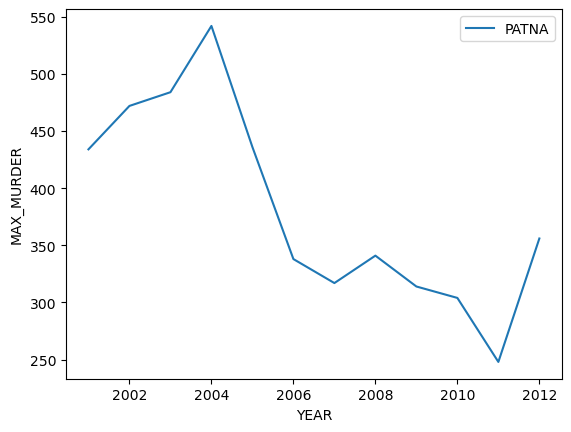

In [453]:
df_max_murder_yearly.plot(x='YEAR',y='MAX_MURDER',label='PATNA')
plt.ylabel('MAX_MURDER')
plt.legend()
plt.show()

### Phase 4: Unsupervised ML (Clustering)


- Note: This phase requires your general knowledge and thought process to merge the right datasets and the right columns. Collecting quality data is a key factor to create meaningful clusters and Analysis.

- Assumption: You were given various crime datasets that contains all the DISTRICTS in each state and you were asked to provide the below data to the higher authorities for further action.


    4.1  "Create 3 clusters as below.
        1. Sensitive Area's
        2. Moderate Area's
        3. Peaceful Area's"

    4.2  Create DataFrame for each cluster that shows data according to the areas.


    4.3  "Analyze your clusters and prepare a report that explains all your observations.


    -Example - 
1. What is impacting more crimes in sensitive areas. 
2. What needs to be done to reduce crime. 
3. Most safe and unsafe districts.
4. Etc.......Anything that you observe (If you want, you can plot various graphs to analyze)"

    4.4   Capstone project overall story in your own words. Min 1000 words.

## 4.1  To create 3 clusters as below:

        1. Sensitive Area's
        2. Moderate Area's
        3. Peaceful Area's"

### Read and understand dataset

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [454]:
# Load your dataset
os.chdir("F:\FlipRobo\Capstone Project_Data Trained\India_Crime - Copy")
data = pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')
# Drop rows where the 'DISTRICT' column is 'TOTAL'
data = data[data['DISTRICT'] != 'TOTAL']
data.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507


In [455]:
len(data.columns)

33

#### Observation:
- Rows = 9017
- Columns = 33

#### Next: 
- To perform exploratory data analysis

### Exploratory data analysis
### (i) To explore data type of all the  variables

In [456]:
data.dtypes

STATE/UT                                               object
DISTRICT                                               object
YEAR                                                    int64
MURDER                                                  int64
ATTEMPT TO MURDER                                       int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER               int64
RAPE                                                    int64
CUSTODIAL RAPE                                          int64
OTHER RAPE                                              int64
KIDNAPPING & ABDUCTION                                  int64
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS             int64
KIDNAPPING AND ABDUCTION OF OTHERS                      int64
DACOITY                                                 int64
PREPARATION AND ASSEMBLY FOR DACOITY                    int64
ROBBERY                                                 int64
BURGLARY                                                int64
THEFT   

In [457]:
Numerical=data.select_dtypes(['float','int']).columns
Numerical

Index(['YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

#### Observation:
- Categorical variables: STATE/UT, DISTRICT 


- Numerical variables: 'YEAR', 'MURDER', 'ATTEMPT TO MURDER','CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE','OTHER RAPE', 'KIDNAPPING & ABDUCTION','KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS','KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY','PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT','AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST','CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT','DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES','IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES','CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'


- All the numerical variables are of discrete type.

#### Next:
- To explore missing values in the dataframe.

In [458]:
data.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

#### Observation:
- There are no missing values in any of the variables.

#### Next:
- Visualization and distribution of the variables

### (ii) To create clusters of districts based on the crime

- To create clusters using K means clustering.

In [459]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

data_encoded = pd.get_dummies(data[['DISTRICT','MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 
                 'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION', 
                 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', 'KIDNAPPING AND ABDUCTION OF OTHERS', 
                 'DACOITY', 'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 
                 'THEFT', 'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST', 
                 'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT', 'DOWRY DEATHS', 
                 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 
                 'CRUELTY BY HUSBAND OR HIS RELATIVES', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 
                 'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES']], columns=['DISTRICT'])

# Standardize numerical variables
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_encoded[['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 
                 'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION', 
                 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', 'KIDNAPPING AND ABDUCTION OF OTHERS', 
                 'DACOITY', 'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 
                 'THEFT', 'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST', 
                 'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT', 'DOWRY DEATHS', 
                 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 
                 'CRUELTY BY HUSBAND OR HIS RELATIVES', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 
                 'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES']])

# Combine scaled numerical variable with one-hot encoded categorical variables
# combined_data = pd.concat([pd.DataFrame(data_scaled, columns=['TOTAL IPC CRIMES']), data_encoded.drop(columns=['TOTAL IPC CRIMES'])], axis=1)

# Choose the number of clusters (k)
k = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add cluster labels to the original dataset
data['cluster'] = clusters

# Explore cluster characteristics
cluster_summary = data.groupby('cluster').mean()
cluster_summary


,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
cluster,,,,,,,,,,,,,,,,,,,,,
0,2006.563227,32.834626,27.088279,3.424694,19.064867,0.001342,19.063525,25.464509,19.323591,6.140919,...,9.161348,239.264390,6.789890,34.038324,7.047569,53.444676,0.051148,75.241724,763.864450,1738.907247
1,2006.735294,335.205882,309.029412,29.294118,269.294118,0.029412,269.264706,879.323529,522.852941,356.470588,...,25.352941,2930.617647,65.352941,426.647059,96.588235,662.294118,0.058824,499.176471,12315.382353,38006.647059
2,2006.891386,94.789727,88.332263,11.522204,58.082397,0.008561,58.073836,96.991974,70.730872,26.261102,...,27.806314,904.193686,24.092563,116.598181,40.233280,272.602461,0.293205,261.008026,2407.216693,6217.490637


#### Observation:
- Highest to lowest order of total IPC crimes = cluster 1, cluster 2, cluster 0

- So, 

    **1. Sensitive Area's = cluster 1**

    **2. Moderate Area's = cluster 2**

    **3. Peaceful Area's = cluster 0**

#### Next:
- To identify districts in these clusters

In [460]:
for i in [0,1,2]:
    cluster_data = data[data['cluster'] == i]
    if i==0:
        Peaceful=cluster_data['DISTRICT'].unique()
    elif i==1:
        Sensitive=cluster_data['DISTRICT'].unique()
    else:
         Moderate=cluster_data['DISTRICT'].unique()
print('\nPeaceful Areas:\n',Peaceful)  
print('\nSensitive Areas:\n',Sensitive)  
print('\nModerate Areas:\n',Moderate) 


Peaceful Areas:
 ['CUDDAPAH' 'GUNTAKAL RLY.' 'SECUNDERABAD RLY.' 'SRIKAKULAM'
 'VIJAYAWADA RLY.' 'VISAKHA RURAL' 'VISAKHAPATNAM' 'VIZIANAGARAM'
 'CHANGLANG' 'DIBANG VALLEY' 'KAMENG EAST' 'KAMENG WEST' 'LOHIT'
 'PAPUM PARE' 'SIANG EAST' 'SIANG UPPER' 'SIANG WEST' 'SUBANSIRI LOWER'
 'SUBANSIRI UPPER' 'TAWANG' 'TIRAP' 'BARPETA' 'BONGAIGAON' 'C.I.D.'
 'DARRANG' 'DHEMAJI' 'DHUBRI' 'DIBRUGARH' 'G.R.P.' 'GOALPARA' 'GOLAGHAT'
 'HAILAKANDI' 'JORHAT' 'KAMRUP' 'KARBI ANGLONG' 'KARIMGANJ' 'KOKRAJHAR'
 'LAKHIMPUR' 'MORIGAON' 'N.C.HILLS' 'NALBARI' 'R.P.O.' 'SIBSAGAR'
 'SONITPUR' 'TINSUKIA' 'ARARIA' 'ARWAL' 'AURANGABAD' 'BAGAHA' 'BANKA'
 'BEGUSARAI' 'BETTIAH' 'BHABHUA' 'BHAGALPUR' 'BHOJPUR' 'BUXAR' 'DARBHANGA'
 'GOPALGANJ' 'JAMALPUR RLY.' 'JAMUI' 'JEHANABAD' 'KATIHAR' 'KATIHAR RLY.'
 'KHAGARIA' 'KISHANGANJ' 'LAKHISARAI' 'MADHEPURA' 'MADHUBANI' 'MUNGER'
 'MUZAFFARPUR RLY.' 'NAUGACHIA' 'NAWADAH' 'PATNA RLY.' 'SAHARSA'
 'SHEIKHPURA' 'SHEOHAR' 'SITAMARHI' 'SIWAN' 'SUPAUL' 'BALRAMPUR' 'BIZAPUR'
 'DANTEWA

## 4.2 To create DataFrame for each cluster that shows data according to the areas

- To create dataframe of **peaceful areas** represented by **cluster = 0**.

In [461]:
# Display data for cluster 0 = Peaceful Area
Peaceful_Area = data[data['cluster'] == 0]
Peaceful_Area


,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,cluster
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,795,17,126,38,57,0,233,1181,3140,0
5,ANDHRA PRADESH,GUNTAKAL RLY.,2001,3,1,0,0,0,0,0,...,1,0,1,0,0,0,4,104,287,0
19,ANDHRA PRADESH,SECUNDERABAD RLY.,2001,6,0,0,0,0,0,0,...,17,1,0,1,0,0,6,68,439,0
20,ANDHRA PRADESH,SRIKAKULAM,2001,38,10,4,8,0,8,12,...,679,6,38,47,108,0,167,926,2572,0
22,ANDHRA PRADESH,VIJAYAWADA RLY.,2001,2,1,0,1,0,1,0,...,9,0,1,1,0,0,2,25,320,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9003,DELHI UT,NORTH,2012,25,17,2,14,0,14,153,...,92,6,29,10,70,0,13,927,2700,0
9010,DELHI UT,STF,2012,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,6,0
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,0,1,0,1,0,0,32,60,0
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,186,0,2,0,1,0,44,392,787,0


In [462]:
Peaceful_Area['DISTRICT'].nunique()

705

#### Observation: 
- There are 705 districts in the country which can be considered as peaceful areas.


#### Next:
- To create dataframe of **sensitive areas** represented by **cluster = 1**.

In [463]:
# Display data for cluster 1 = Sensitive Area's
Sensitive_Area = data[data['cluster'] == 1]
Sensitive_Area.head()


,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,cluster
370,MAHARASHTRA,MUMBAI,2001,295,200,6,127,0,127,148,...,3845,18,274,44,198,0,709,6095,28968,1
700,DELHI UT,DELHI UT TOTAL,2001,547,510,63,381,0,381,1627,...,2011,113,502,90,138,0,432,22000,54384,1
972,KARNATAKA,BANGALORE COMMR.,2002,201,311,4,32,0,32,159,...,4029,33,237,62,242,0,45,11801,29120,1
1087,MAHARASHTRA,MUMBAI,2002,252,134,7,128,0,128,119,...,3542,18,254,40,214,0,753,5950,26276,1
1418,DELHI UT,DELHI UT TOTAL,2002,531,440,68,403,0,403,1323,...,1851,135,446,128,135,0,416,20876,49137,1


In [464]:
Sensitive_Area['DISTRICT'].unique()

array(['MUMBAI', 'DELHI UT TOTAL', 'BANGALORE COMMR.', 'MUMBAI COMMR.'],
      dtype=object)

#### Observation:
- There are only 4 districts in the country which can be considered as sensistive areas. These are: 'MUMBAI', 'DELHI UT TOTAL', 'BANGALORE COMMR.', 'MUMBAI COMMR.'

#### Next:
- To create dataframe of **moderate areas** represented by **cluster = 2**.

In [465]:
# Display data for cluster 2 = Moderate Area's
Moderate_Area = data[data['cluster'] == 2]
Moderate_Area


,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,cluster
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,1131,16,149,34,175,0,181,1518,4154,2
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,1543,7,118,24,154,0,270,754,4125,2
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,2088,14,112,83,186,0,404,1262,5818,2
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,1244,12,109,58,247,0,431,2313,6507,2
6,ANDHRA PRADESH,GUNTUR,2001,182,88,2,54,0,54,82,...,1792,7,139,129,378,0,369,2426,7848,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9006,DELHI UT,OUTER,2012,96,60,15,67,0,67,572,...,224,15,79,18,244,0,90,2006,6344,2
9007,DELHI UT,SOUTH,2012,39,19,3,70,0,70,245,...,101,17,59,36,68,0,25,1651,5045,2
9008,DELHI UT,SOUTH-EAST,2012,46,69,6,116,0,116,538,...,252,11,160,43,123,0,218,2004,7040,2
9009,DELHI UT,SOUTH-WEST,2012,47,48,6,87,0,87,399,...,131,18,69,21,207,0,4,1387,4085,2


In [466]:
Moderate_Area['DISTRICT'].nunique()

274

#### Observation:
- There are 274 districts in the country which can be considered as moderate areas

#### Next:
- To visulaize crimes in these three types of areas through a plot

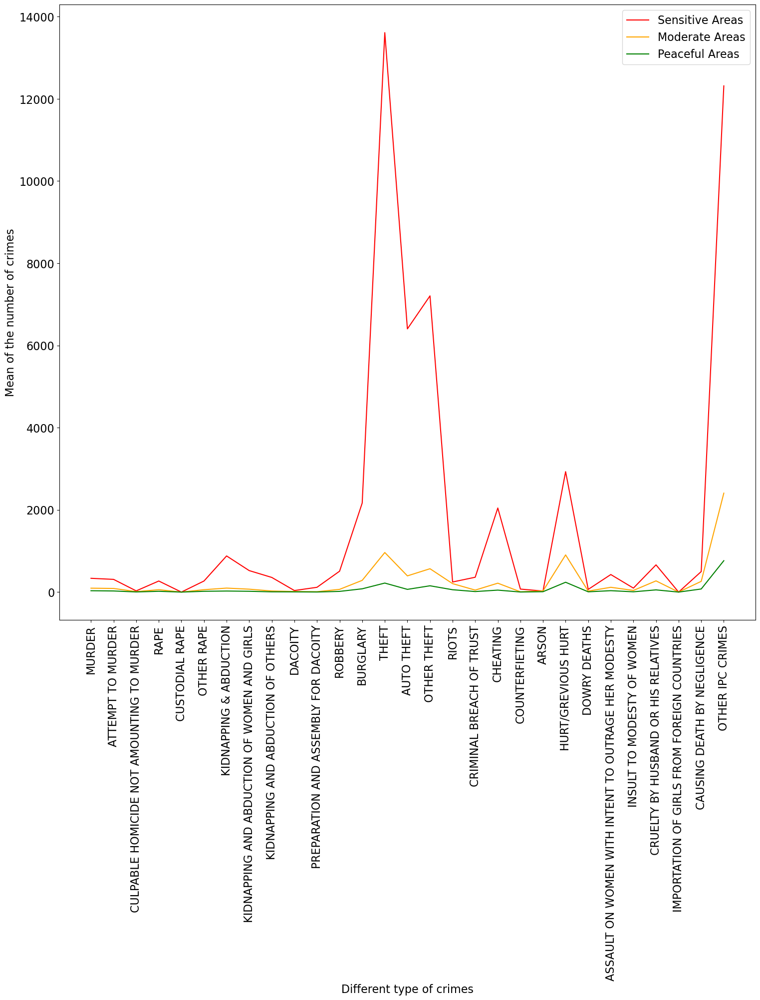

In [467]:
crime_columns=['MURDER', 'ATTEMPT TO MURDER', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 
                 'RAPE', 'CUSTODIAL RAPE', 'OTHER RAPE', 'KIDNAPPING & ABDUCTION', 
                 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', 'KIDNAPPING AND ABDUCTION OF OTHERS', 
                 'DACOITY', 'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 
                 'THEFT', 'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST', 
                 'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT', 'DOWRY DEATHS', 
                 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', 'INSULT TO MODESTY OF WOMEN', 
                 'CRUELTY BY HUSBAND OR HIS RELATIVES', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', 
                 'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES']
# Plot the mean of each crime column for Peaceful_Area and Sensitive_Area
plt.figure(figsize=(18,16))
plt.plot(Sensitive_Area[crime_columns].mean(), label='Sensitive Areas',color='red')
plt.plot(Moderate_Area[crime_columns].mean(), label='Moderate Areas',color='orange')
plt.plot(Peaceful_Area[crime_columns].mean(), label='Peaceful Areas',color='green')

plt.xlabel('Different type of crimes',fontsize=16)
plt.ylabel('Mean of the number of crimes',fontsize=16)
plt.xticks(fontsize=16,rotation=90)
plt.yticks(fontsize=16)
# Add legend to the plot
plt.legend(fontsize=16)

# Display the plot
plt.show()



 ## 4.3  Analyze your clusters and prepare a report that explains all your observations.

In [468]:
Peaceful_Area.groupby('DISTRICT')['TOTAL IPC CRIMES'].sum().sort_values().head(50)

DISTRICT
RAILWAYS KATRA           2
RAILWAYS KMR            10
BIEO                    16
CID                     23
CAR                     24
RAILWAYS JAMMU          29
CRIME KASHMIR           32
RAILWAYS KASHMIR        43
CID CRIME               54
LONGLENG                84
ANJAW                   85
SPL CELL               133
UPPER DIBANG VALLEY    148
G.R.P. JODHPUR         149
HAMREN                 150
S.T.F.                 158
STF                    181
KIPHIRE                195
SUKMA                  205
NICOBAR                235
G.R.P.JODHPUR          286
RURAL                  298
PEREN                  323
CRIME JAMMU            369
C.I.D.                 384
CRIME BRANCH           393
KHOWAI                 423
TAMENGLONG             463
K/KUMEY                507
UNAKOTI                533
KONDAGAON              537
DIU                    550
TUENSANG               559
TAWANG                 580
PHEK                   603
G.R.P. AJMER           617
BAKSA              

#### Observation:

- The mean value of the crime "THEFT" is observed to be maximum in sensitive areas compared to peaceful and moderate areas. 


- Crimes like "CHEATING" and "HURT/GREVIOUS HURT" are also relatively higher in sensitive areas.


- There are 4 districts in the country which fall under sensitive areas. These are: 'MUMBAI', 'DELHI UT TOTAL', 'BANGALORE COMMR.', 'MUMBAI COMMR.'


#### Conclusion:
- 'MUMBAI', 'DELHI UT', 'BANGALORE COMMR.', 'MUMBAI COMMR. are the districts in sensitive areas. 


- Among these DELHI UT(total IPC crimes = 633174) has the highest crimes. This data represents the sum total of all IPC crimes from 2001 to 2012. so it is the most unsafe district.


- Districts LONGLENG(Nagaland) and ANJAW(Arunachal Pradesh) are among the least crime districts. In the same 12 years duration there have been total IPC crimes 84 and 85 respectively. Therefore, these districts can be referred to as the safest districts in the country.


- The districts which fall under sensitive areas are also among the most populated districts of the country. So clustering these districts considering total crime will not give a fair idea of the crime in these districts. A better metric to cluster the districts based on crimes would be to take into account **crime rate**, which basically normalizes the crimes based on the population. Crime rate considers the number of crimes per 100,000 of the population. Therefore, next task would be to cluster the districts based on **crime rate** and not **number of crimes**. 